In [1]:
#pip install ordered-set

In [1]:
#pip install dill==0.3.5

In [1]:
import os
os.environ["DEV"] = "1"
os.environ["NEURODIFF_API_URL"] = "http://dev.neurodiff.io"
os.environ["NEURODIFF_API_KEY"] = 'tNaaIvvvdg72-c8VcTZRgpALsl0ns77ljEvxul6tG0E'

import warnings
warnings.filterwarnings("ignore")
import dill
dill.__version__


import numpy
from NNholo_multihead_paper_all_edit_plots import *
from tqdm.auto import tqdm


In [2]:
# Helper code to make graphs look better
import seaborn as sns
from cycler import cycler
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.colors import LogNorm
large = 24; medium = 22; small = 12
colors = ['#66bb6a', '#558ed5', '#dd6a63', '#ffa726', '#8c5eff', '#f44336', '#00bcd4', '#ffc107', '#9c27b0']
params = {'axes.titlesize': medium,
          'legend.fontsize': medium,
          'figure.figsize': (8, 8),
          'axes.labelsize': medium,
          'axes.linewidth': 2,
          'xtick.labelsize': medium,
          'xtick.color' : '#1D1717',
          'ytick.color' : '#1D1717',
          'ytick.labelsize': medium,
          'axes.edgecolor':'#1D1717',
          'figure.titlesize': medium,
          'axes.prop_cycle': cycler(color = colors),}
plt.rcParams.update(params)
%matplotlib inline

In [3]:
#FOR LOADING PABLOS FLAT MULTI HEAD:

# Directory 
directory = "NN_5MH_flat_metric_epochs_3000000.zip"
# Parent Directory path 
parent_dir = "MH flat"
# Path 
path_results = os.path.join(parent_dir, directory) 
path_results = 'MH non flat/'


# FOR LOEADING PEDROS NON-FLAT MULTI HEAD:

# # Directory 
# directory = "pedros_NON_flat"
# # Parent Directory path 
# parent_dir = "/Users/pablo/Desktop/NNholo/MH_flattening_paper_3_to_1/flat_5_heads/results_2/"
# # Path 
# path_results = os.path.join(parent_dir, directory) 

In [4]:
# os.mkdir(path_results) 
# print("Directory '% s' created" % directory) 

## MH from which TL will happen

In [5]:
phim_param = [3.00,2.00,1.50,1.08,1.00]
sofT_list = []
for k in range(len(phim_param)):
        
    phim_str = str(phim_param[k])
    # Replace '.' with '_'
    phim_str = phim_str.replace('.', '_')

    sofT_path = "Data/SofT/SofTphiM" + phim_str + ".txt"

    sofT_list.append(sofT_path)

In [6]:
u_pts = 64

#FOR LOADING PABLOS FLAT MULTI HEAD:

d = NNholo_multihead_heist(sofT_path_list=sofT_list, phim_list = phim_param,saving_path = path_results, \
                           load_path = f'{path_results}NN_MH_heist_epochs_3000000_paper.zip', \
                           u_pts=u_pts, u_sampling='chebyshev2-noisy', n_batches_train=1, metric_flat_coef=500,)


# FOR LOEADING PEDROS NON-FLAT MULTI HEAD:

# d = NNholo_multihead_heist(sofT_path_list=sofT_list, phim_list = phim_param,saving_path = path_results, \
#                            load_path = f'{path_results}/NN_MH_heist_epochs_3000000_paper', \
#                            u_pts=u_pts, u_sampling='chebyshev2-noisy', n_batches_train=1, metric_flat_coef=500,)



Loading the model...


/Users/pedro/Desktop/PhD Pedro/Flatten the metric/MH UR paper/NNholo_multihead_paper_all_edit_plots.py:899: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  master_dict = torch

Solver architecture [32, 32, 32, 32, 128]
Solver head architecture [16, 16]
V architecture [32, 32, 32, 128]
V head architecture [64, 64]
Creating the nets...
Solver nets ready
V-nets ready
Equations dictionary generated
Equation list ready
Force V(0), dV(0),ddV(0) ? No[0], Yes[1]0
length of s(T) curves: [72, 72, 72, 72, 72]
head 0
Inside solver __init()__: <bound method NNholo_multihead_heist.generate_equations.<locals>.make_equations.<locals>.equations of <NNholo_multihead_paper_all_edit_plots.NNholo_multihead_heist object at 0x2b1ea7d90>>
head 1
Inside solver __init()__: <bound method NNholo_multihead_heist.generate_equations.<locals>.make_equations.<locals>.equations of <NNholo_multihead_paper_all_edit_plots.NNholo_multihead_heist object at 0x2b1ea7d90>>
head 2
Inside solver __init()__: <bound method NNholo_multihead_heist.generate_equations.<locals>.make_equations.<locals>.equations of <NNholo_multihead_paper_all_edit_plots.NNholo_multihead_heist object at 0x2b1ea7d90>>
head 3
Ins

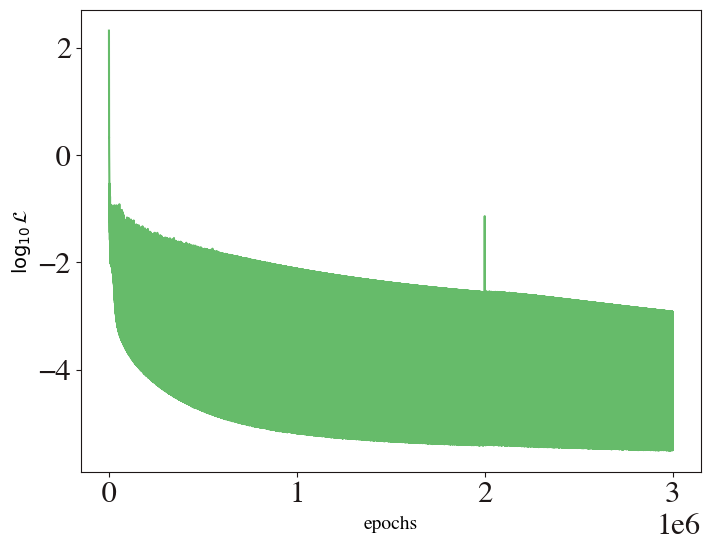

Min loss:  3.094934768722988e-06


In [31]:
d.plot_loss(save_fig=False)

In [13]:
plot_save_path = 'Final_Plots'

# Plots for UR MH paper
$\textbf{Pedro}$: Load your net instead of mine if you want to generate the non-flat metric again - the path is comented above (before the loss), but you will need to rearange paths.

All the documents needed are in the drive. Good luck! (hopefully is not too bad)

### Metric Plots

g_MAT torch.Size([18000, 3, 3]) det torch.Size([18000]) U torch.Size([5, 50, 72])


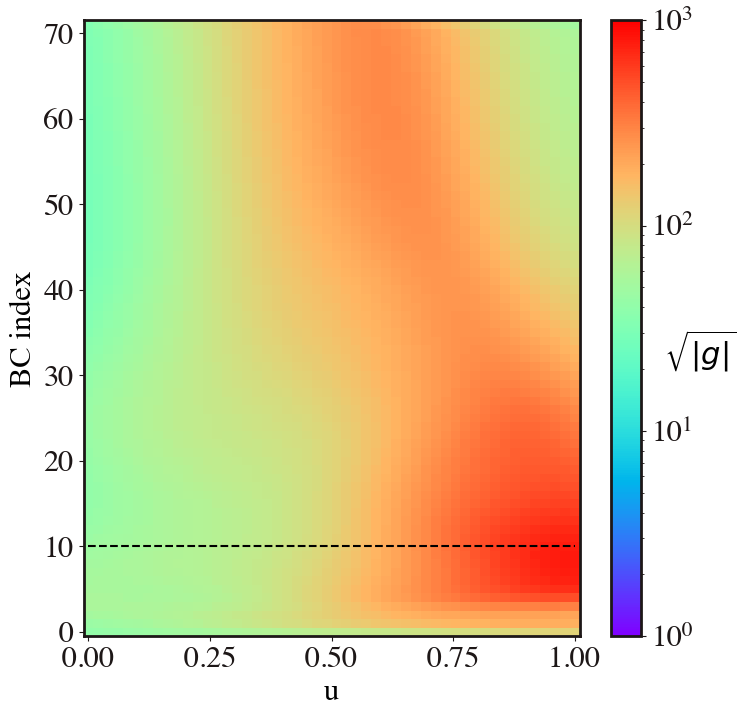

NameError: name 'plot_save_path' is not defined

In [11]:
vmax=1000
logscale=True
save_fig = True

heads = np.linspace(0, d.n_heads, d.n_heads)
phim_param = d.phim_list

# func= ['$V_\Sigma$','$V_A$','$V_\phi$','$\Sigma$','$A$','$\phi$']
# func_txt = ['Vs','Va','Vp','Sigma', 'A', 'phi']
func= ['$V_\Sigma$']
func_txt = ['Vs']

# Prepare the batch #
u = torch.linspace(0,1,50)
sigma_list = []
va_list = []
for k in range(len(heads)):
    U,SIGMA = torch.meshgrid(u,d.solver.Sigma_uh_list[k],indexing= 'ij')
    U,VA = torch.meshgrid(u,d.solver.Va_uh_list[k],indexing= 'ij')
    sigma_list.append(SIGMA)
    va_list.append(VA)
SIGMA = torch.stack(sigma_list)
VA = torch.stack(va_list)

for f in range(len(func)):
    index = torch.linspace(0,len(d.solver.Sigma_uh_list[k])-1,len(d.solver.Sigma_uh_list[k]))
    phiM,U,IND = torch.meshgrid(torch.tensor(phim_param),u,index,indexing= 'ij') #[head, U, index]
    x = torch.cat([U.reshape(-1,1,1).squeeze(dim = 2),SIGMA.reshape(-1,1,1).squeeze(dim = 2),VA.reshape(-1,1,1).squeeze(dim = 2)]
                  ,dim = 1)  # input #
    H = d.solver.all_nets[f,0].H_model(x)
    Omega = torch.cat([x,H],dim = 1)
    gmunu = torch.zeros([len(x),len(x)])
    partial_omega = []
    for j in range(Omega.shape[1]):
        partial_omega.append(diff(Omega[:,j],x,shape_check = False))
    partial_omega = torch.stack(partial_omega)
    #print(partial_omega.shape)  # [Coordinate index, sampling, metric dimension]
    partial_omega = torch.transpose(partial_omega,dim0 = 0,dim1 = 1)
    phiM,U,IND = torch.meshgrid(torch.tensor(phim_param),u,index,indexing= 'ij') #[head, U, index]
    g_MAT = torch.matmul(torch.transpose(partial_omega,dim0 = 1,dim1 = 2), partial_omega)
    print('g_MAT',g_MAT.shape,'det', torch.linalg.det(g_MAT).shape, 'U', U.shape)

    g_det = torch.sqrt(torch.linalg.det(g_MAT)).reshape_as(U)
    point = 10
    for k in range(1): #range(len(heads)):
        k +=4
       # fig1,ax = plt.subplots(1,2,figsize=(10,5))
        fig1 = plt.figure()
        if logscale:
            colormesh = plt.pcolormesh(U[k,:,:].cpu().detach().numpy(),IND[k,:,:].cpu().detach().numpy(),g_det[k,:,:].cpu().detach().numpy(),\
                                     norm=LogNorm(vmin=1, vmax=vmax), cmap = 'rainbow')
        else:
            colormesh = plt.pcolormesh(U[k,:,:].cpu().detach().numpy(),IND[k,:,:].cpu().detach().numpy(),g_det[k,:,:].cpu().detach().numpy(), cmap = 'rainbow')
        cbar = plt.colorbar(colormesh)
        cbar.set_label('$\sqrt{|g|}$',rotation=0)
#                fig1.suptitle('Function ' + str(func[f]) + ' for $\phi_M = $' + str(phim_param[k]))
#        plt.title('Function ' + str(func[f]) + ' for $\phi_M = $' + str(phim_param[k]), fontsize=18)
        #plt.title('Standard (no UR), function '+ r'$ \nu_\Sigma$' + ' for $\phi_M = $' + str(phim_param[k]), fontsize=18)
        #plt.title('UR', fontsize=18)

        plt.hlines(point,0,1,linewidth = 1.5, color = 'k',linestyle = 'dashed')
        plt.xlabel('u')
        plt.ylabel('BC index')
        plt.show()
        if save_fig==True:
            fig1.savefig(f'{plot_save_path}/Holo_metric_non_flat_body_V2.pdf', bbox_inches="tight")
            
    # fig2 = plt.figure(figsize = (10,5))
    # ax = fig2.add_subplot(111,projection='3d')
    # scatter = ax.scatter(U.cpu().detach().numpy(),IND.cpu().detach().numpy(),phiM.cpu().detach(),
    #                      c=g_det.cpu().detach().numpy(),cmap='rainbow',alpha = 0.4)

    # ax.set_xlabel('u')
    # ax.set_ylabel('index')
    # ax.set_zlabel('$\phi_M$')
    # plt.colorbar(scatter,ax = ax)
    # ax.set_title('Function ' + str(func[f]))
    # plt.show()
       

### BC plots

In [7]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset


In [67]:
large = 24; medium = 22; small = 12
fontsize = 14
col = ['#66bb6a', '#558ed5', '#dd6a63', '#ffa726', '#8c5eff', '#f44336', '#00bcd4', '#ffc107', '#9c27b0']  # this color was in the 4th position '#dcd0ff'
params = {'axes.titlesize': medium,
          'legend.fontsize': medium,
          'figure.figsize': (8, 8),
          'axes.labelsize': medium,
          'axes.linewidth': 2,
          'xtick.labelsize': medium,
          'xtick.color' : '#1D1717',
          'ytick.color' : '#1D1717',
          'ytick.labelsize': medium,
          'axes.edgecolor':'#1D1717',
          'figure.titlesize': medium,
          'axes.prop_cycle': cycler(color = colors),}
plt.rcParams.update(params)


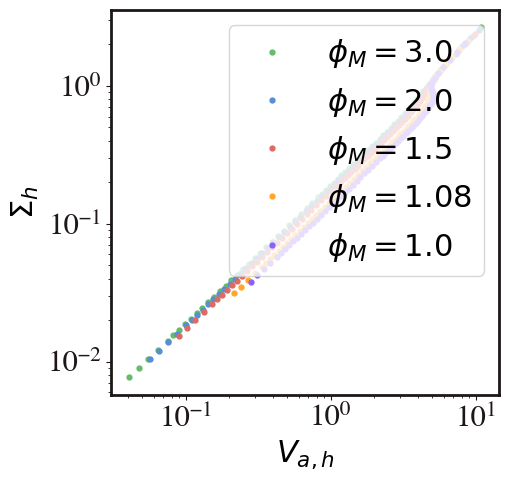

In [27]:
fig3 = plt.figure(figsize=(5,5))
col = [f'C{i}' for i in range(len(heads))]
col=['C0','C1','C2','C3','C4']
for k in range(len(heads)):
    plt.plot(abs(d.solver.Va_uh_list[k].cpu().detach().numpy()),abs(d.solver.Sigma_uh_list[k].cpu().detach().numpy()),'.', color=col[k], label = rf'$\phi_M={phim_param[k]}$',ms=7)
    plt.plot((d.solver.Va_uh_list[k][point].cpu().detach().numpy()),d.solver.Sigma_uh_list[k][point].cpu().detach().numpy(), '*',ms=10,color=col[k])
plt.xlabel('$V_{a,h}$')
plt.ylabel('$\Sigma_{h}$')
plt.legend(loc='upper right')
plt.xscale('log')
plt.yscale('log')
# plt.xlim(left=-5.5,right=-4)
# plt.ylim(top=1.35,bottom=0.6)
plt.show()


In [32]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, mark_inset

# Ensure variables are defined
col = ['C0', 'C1', 'C2', 'C3', 'C4']
plt.close()
fig3, ax = plt.subplots()

# Main plot
for k in range(len(heads)):
    ax.plot(
        d.solver.Va_uh_list[k].cpu().detach().numpy(),
        d.solver.Sigma_uh_list[k].cpu().detach().numpy(),
        '.', color=col[k], label=rf'$\phi_M={phim_param[k]}$', ms=7
    )

ax.set_xlabel('$V_{a,h}$', fontsize=14)
ax.set_ylabel('$\Sigma_{h}$', fontsize=14)
ax.legend(loc='lower left', fontsize=18)

# Create inset plot
axin = inset_axes(ax, width="30%", height="30%", loc='lower left', 
                  bbox_to_anchor=(0.5, 0.5, 1, 1), bbox_transform=ax.transAxes)

for k in range(len(heads)):
    axin.plot(
        d.solver.Va_uh_list[k].cpu().detach().numpy(),
        d.solver.Sigma_uh_list[k].cpu().detach().numpy(),
        '.', color=col[k], ms=7
    )
    axin.plot(
        d.solver.Va_uh_list[k][point].cpu().detach().numpy(),
        d.solver.Sigma_uh_list[k][point].cpu().detach().numpy(),
        '*', ms=14, mew=1, color=col[k]
    )

axin.set_xlim(-5.3, -4)
axin.set_ylim(0.65, 1.2)

# Mark inset region
mark_inset(ax, axin, loc1=2, loc2=4, fc="none", ec="0.5")

# Save plot
fig3.savefig(f'{plot_save_path}/Holo_BC_V2.pdf', bbox_inches="tight")
plt.show()


AxesHostAxes(0.531597,0.514097;0.2325x0.231)


AttributeError: 'NoneType' object has no attribute '_get_renderer'

AttributeError: 'NoneType' object has no attribute '_get_renderer'

<Figure size 800x800 with 2 Axes>

In [117]:
large = 24; medium = 22; small = 12
fontsize = 14
col = ['#66bb6a', '#558ed5', '#dd6a63', '#ffa726', '#8c5eff', '#f44336', '#00bcd4', '#ffc107', '#9c27b0']  # this color was in the 4th position '#dcd0ff'
params = {'axes.titlesize': medium,
          'legend.fontsize': medium,
          'figure.figsize': (8, 8),
          'axes.labelsize': medium,
          'axes.linewidth': 2,
          'xtick.labelsize': medium,
          'xtick.color' : '#1D1717',
          'ytick.color' : '#1D1717',
          'ytick.labelsize': medium,
          'axes.edgecolor':'#1D1717',
          'figure.titlesize': medium,
          'axes.prop_cycle': cycler(color = colors),}
plt.rcParams.update(params)
# fig3 = plt.figure(figsize=(5,5))
# col = [f'C{i}' for i in range(len(heads))]
# col=['C0','C1','C2','C4','C5']
# for k in range(len(heads)):
#     plt.plot((d.solver.Va_uh_list[k].cpu().detach().numpy()),d.solver.Sigma_uh_list[k].cpu().detach().numpy(),'.', color=col[k], label = rf'$\phi_M={phim_param[k]}$',ms=7)
#     plt.plot((d.solver.Va_uh_list[k][point].cpu().detach().numpy()),d.solver.Sigma_uh_list[k][point].cpu().detach().numpy(), '*',ms=10,color=col[k])
# plt.xlabel('$V_{a,h}$', fontsize=14)
# plt.ylabel('$\Sigma_{h}$',fontsize=14)
# plt.legend(loc='upper right')
# plt.xlim(left=-5.5,right=-4)
# plt.ylim(top=1.35,bottom=0.6)
# plt.show()

#col = ['C0','C1','C2','C4','C5']
fig3,ax = plt.subplots(figsize=(8,8))

for k in range(len(heads)):
    ax.plot((d.solver.Va_uh_list[k].cpu().detach().numpy()),d.solver.Sigma_uh_list[k].cpu().detach().numpy(),'.', color=col[k], label = rf'$\phi_M={phim_param[k]}$',ms=7)
  #  axin.plot((d.solver.Va_uh_list[k][point].cpu().detach().numpy()),d.solver.Sigma_uh_list[k][point].cpu().detach().numpy(), '*',ms=10,color=col[k])

plt.xlabel('$V_{a,h}$')
plt.ylabel('$\Sigma_{h}$')
plt.legend(loc='lower left', fontsize=18)

# Create inset plot
x0, y0 = 0.505,0.505  # Specify the lower-left corner of the inset plot in relative coordinates
width, height = 2.8,2.8 # Specify the width and height of the inset plot in relative coordinates

# Create inset plot
large = 24; medium = 22; small = 12
fontsize = 14
col = ['#66bb6a', '#558ed5', '#dd6a63', '#ffa726', '#8c5eff', '#f44336', '#00bcd4', '#ffc107', '#9c27b0']  # this color was in the 4th position '#dcd0ff'
params = {'axes.titlesize': medium,
          'legend.fontsize': medium,
          'figure.figsize': (8, 8),
          'axes.labelsize': medium,
          'axes.linewidth': 2,
          'xtick.labelsize': 15,
          'xtick.color' : '#1D1717',
          'ytick.color' : '#1D1717',
          'ytick.labelsize': 15,
          'axes.edgecolor':'#1D1717',
          'figure.titlesize': medium,
          'axes.prop_cycle': cycler(color = colors),}
plt.rcParams.update(params)
axin = inset_axes(ax, width=width, height=height, loc='lower left', bbox_to_anchor=(x0, y0), bbox_transform=ax.transAxes)
for k in range(len(heads)):
    axin.plot(d.solver.Va_uh_list[k].cpu().detach().numpy(),d.solver.Sigma_uh_list[k].cpu().detach().numpy(),'.', color=col[k], label = rf'$\phi_M={phim_param[k]}$',ms=7)
    axin.plot(d.solver.Va_uh_list[k][point].cpu().detach().numpy(),d.solver.Sigma_uh_list[k][point].cpu().detach().numpy(), '*',ms=14,mew = 1, color=col[k])
#axin.set_xticks(fontsize=15)  # Adjust the font size as needed
axin.set_xticks([-5.0,-4.5])

# draw a bbox of the region of the inset axes in the parent axes and
# connecting lines between the bbox and the inset axes area
mark_inset(ax, axin, loc1=3, loc2=4, fc="none", ec="0.3")
# Set axis labels for inset plot
#axin.set_xlabel(r'$\phi$')
#axin.set_ylabel(r'$\partial^2 V/\partial \phi^2$')
axin.set_xlim(left=-5.3,right=-4)
axin.set_ylim(top=1.2,bottom=0.65)
#plt.show()

fig3.savefig(f'{plot_save_path}/Holo_BC_V2.pdf')


AttributeError: 'NoneType' object has no attribute '_get_renderer'

<Figure size 800x800 with 2 Axes>

### $V(\phi)$ body plots

max phi_h=  1.205423276400707
max phi_h=  1.2687101980336741
max phi_h=  1.3505876073632679
max phi_h=  1.5412310809789083
max phi_h=  1.596246232474372


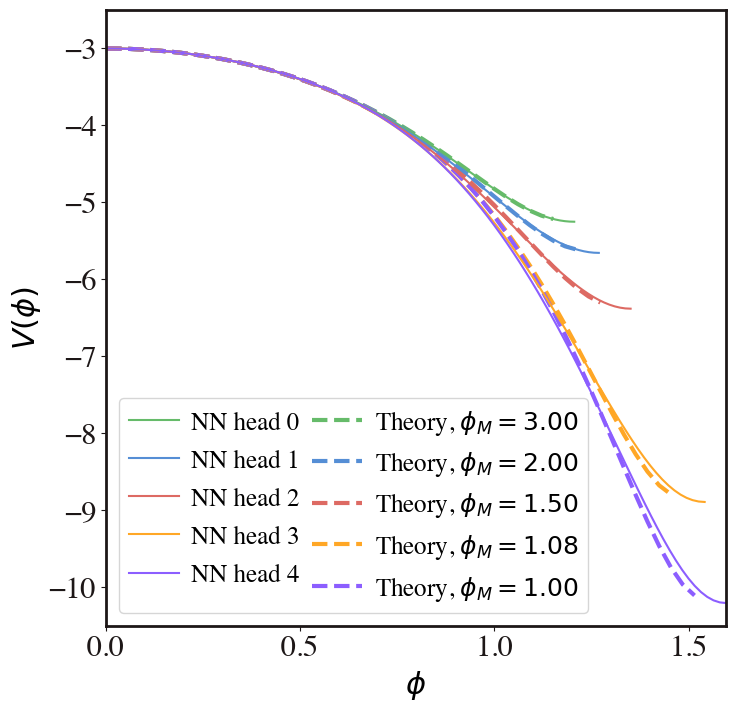

In [54]:
phim = phim_param
sampling_pts = 100
save_fig = True
best = False
show_legend=True
log_scale=False

alpha=0.6
        
trained_epochs = len(d.solver.metrics_history['train_loss'])
u = np.linspace(0, 1, sampling_pts)
phi_list = []
V_list = []
phi_h_th_list = []
phi_h_max_list = []
V_nn_min_list = []

fig = plt.figure(figsize=(8,8))

col_new = col

for head in range(d.n_heads):
    
    d.solver.best_nets = d.nets[:,head]
    solution = d.solver.get_solution(best=True)

    phi_h = np.ones(d.solver.S_true_list[head].shape)
    true_phi_h = np.ones(d.solver.S_true_list[head].shape)
    u_max = np.ones(d.solver.S_true_list[head].shape)

    for i,S in enumerate(d.solver.S_true_list[head]):
        T=d.solver.T_true_list[head][i]
    #    print(i,S,T)
        Sigma_v = (S/np.pi)**(1/3)
        Va_v = (-T*4*np.pi)
        Sigma_uh = Sigma_v.cpu().detach().numpy()*np.ones_like(u)
        Va_uh = Va_v.cpu().detach().numpy()*np.ones_like(u)
        Vs, Va, Vp, Sigma, A, phi = solution(u, Sigma_uh,  Va_uh, to_numpy=True)
        phi_h[i] = phi.max()
        true_phi_h[i] = phi[-1]
        i_max = phi.argmax()
        u_max[i] = u[i_max]
    print('max phi_h= ',max(phi_h))
    phi_h_max_list.append(max(phi_h))

    # Define the domain of input phi
    phi=torch.reshape(torch.linspace(0, max(phi_h), sampling_pts),[sampling_pts,1])
    phi_th = torch.linspace(0,3,100).cpu().detach().numpy()
    phi = torch.Tensor(phi)
    phi.requires_grad = True
    qphi = phi.cpu().detach().numpy().reshape(-1,)
    qphi.shape
    phi_list.append(qphi)
    Vv = d.V_net[head](phi)
    V_list.append(Vv)
    potentialVphi=pd.DataFrame(phi.cpu().detach().numpy())
    potentialVVv=pd.DataFrame(Vv.cpu().detach().numpy())
    py_listphi=phi.tolist()
    py_listV=Vv.tolist()
    potentialV=pd.DataFrame(list(zip(py_listphi,py_listV)),columns=['Phi','V'])
    potentialV['Phi']=potentialV['Phi'].str[0]
    potentialV['V']=potentialV['V'].str[0]
    potentialV.to_csv(f'{d.path}/V_head_{head}_epoch_{trained_epochs}.csv', index=False)

   # plt.plot(phi_th, V_or(phi_th, phim[head]).reshape(-1,1), label=fr'Theory, $\phi_M=%.2f$'%phim[head], color = col_th[head], linestyle = 'dashed', linewidth = 2.5, zorder=1)
    plt.plot(qphi, Vv.cpu().detach(), label=f'NN head {head}', color = col_new[head], linewidth=1.5)

    phi_h_th = phi_th[np.argmin(V_or(phi_th,phim[head]))]
    phi_h_th_list.append(phi_h_th)
    V_nn_interp = interp1d(phi.cpu().detach().numpy()[:,0], Vv.cpu().detach().numpy()[:,0])
    V_nn_h = V_nn_interp(phi_h)
    ind = np.argmax(phi_h)
    V_nn_min_list.append(V_nn_h[ind])
  #  plt.axvline(phi_h_th, color = col_th[head], linestyle = 'dashed', linewidth=1,alpha=alpha)
   # plt.axvline(max(phi_h), color = col_new[head], linestyle = 'solid', linewidth = 1, alpha=alpha)
    # plt.axhline(min(V_or(phi_th, phim[head])), color = col_th[head], linestyle ='dotted', linewidth=1,alpha=alpha)  
    # plt.axhline(V_nn_h[ind], color = col_new[head], linestyle ='solid', linewidth = 1, alpha=alpha)


for head in range(d.n_heads):
    Vth = V_or(phi_th, phim[head]).reshape(-1,1)
    ind = np.argmin(Vth)
    plt.plot(phi_th[:ind], Vth[:ind], label=fr'Theory, $\phi_M=%.2f$'%phim[head], color = col[head], linestyle = 'dashed', linewidth = 3, zorder=1)

plt.xlim(0.0, max(phi_h_max_list))
plt.ylim(-10.5, -2.5)
plt.xlabel(r'$\phi$')
plt.ylabel(r'$V(\phi)$',)

if show_legend==True:
    plt.legend(
        loc='lower left', 
        #bbox_to_anchor=(1, 0.5), 
        ncol=2, 
        handleheight=1.0,    # Increase spacing between rows
        handletextpad=0.5,   # Space between handles and labels
        columnspacing=0.5,
        fontsize=18
    )
    
if log_scale==True:
    plt.yscale('symlog')

if save_fig == True:
    fig.savefig(f'{plot_save_path}/Holo_V_body_flat.pdf' ,bbox_inches="tight")
plt.show()

max phi_h=  1.210581876583789
max phi_h=  1.2710463761645037
max phi_h=  1.3535575983015151
max phi_h=  1.5324795596029284
max phi_h=  1.6060513365714724


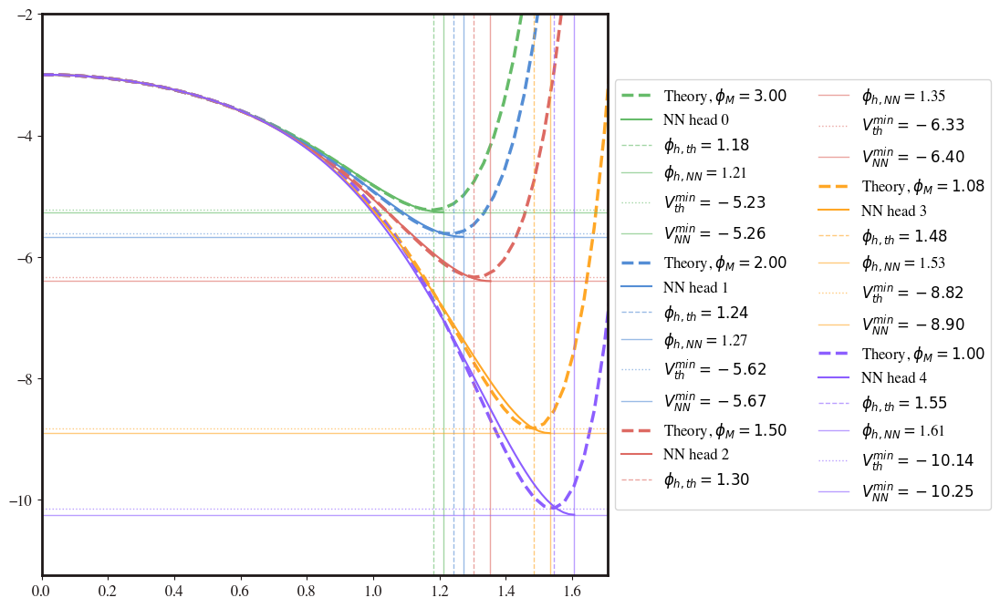

In [119]:
phim = phim_param
sampling_pts = 100
save_fig = False
best = False
show_legend=True
log_scale=False

alpha=0.6
        
trained_epochs = len(d.solver.metrics_history['train_loss'])

u = np.linspace(0, 1, sampling_pts)

phi_list = []
V_list = []
phi_h_th_list = []
phi_h_max_list = []
V_nn_min_list = []

fig = plt.figure(figsize=(8,8))

# col_th=[]
# for c in range(d.n_heads+1):
#     if c!=3:
#         color = 'C'+str(c)
#         col_th.append(color)
# col_new=col_th
col_new = col
for head in range(d.n_heads):
    
    d.solver.best_nets = d.nets[:,head]
    solution = d.solver.get_solution(best=True)

    phi_h = np.ones(d.solver.S_true_list[head].shape)
    true_phi_h = np.ones(d.solver.S_true_list[head].shape)
    u_max = np.ones(d.solver.S_true_list[head].shape)

    for i,S in enumerate(d.solver.S_true_list[head]):
        T=d.solver.T_true_list[head][i]
    #    print(i,S,T)
        Sigma_v = (S/np.pi)**(1/3)
        Va_v = (-T*4*np.pi)
        Sigma_uh = Sigma_v.cpu().detach().numpy()*np.ones_like(u)
        Va_uh = Va_v.cpu().detach().numpy()*np.ones_like(u)
        Vs, Va, Vp, Sigma, A, phi = solution(u, Sigma_uh,  Va_uh, to_numpy=True)
        phi_h[i] = phi.max()
        true_phi_h[i] = phi[-1]
        i_max = phi.argmax()
        u_max[i] = u[i_max]
    print('max phi_h= ',max(phi_h))
    phi_h_max_list.append(max(phi_h))

    # Define the domain of input phi
    phi=torch.reshape(torch.linspace(0, max(phi_h), sampling_pts),[sampling_pts,1])
    phi_th = torch.linspace(0,3,100).cpu().detach().numpy()
    phi = torch.Tensor(phi)
    phi.requires_grad = True
    qphi = phi.cpu().detach().numpy().reshape(-1,)
    qphi.shape
    phi_list.append(qphi)
    #Vv = potential_cb.best_potential(phi) #potential_cb.best_potential(phi)
    #DVv = diff(potential_cb.best_potential(phi), phi, shape_check= False)
    #DDVv = diff(potential_cb.best_potential(phi), phi, order=2, shape_check= False)
    Vv = d.V_net[head](phi)
    V_list.append(Vv)
    potentialVphi=pd.DataFrame(phi.cpu().detach().numpy())
    potentialVVv=pd.DataFrame(Vv.cpu().detach().numpy())
    #potentialDVVv=pd.DataFrame(DVv.cpu().detach().numpy())
    #potentialDDVVv=pd.DataFrame(DDVv.cpu().detach().numpy())
    py_listphi=phi.tolist()
    py_listV=Vv.tolist()
    #py_listDV=DVv.tolist()
    #py_listDDV=DDVv.tolist()
    #potentialV=pd.DataFrame(list(zip(py_listphi,py_listV,py_listDV,py_listDDV)),columns=['Phi','V','DV','DDV'])
    potentialV=pd.DataFrame(list(zip(py_listphi,py_listV)),columns=['Phi','V'])
    potentialV['Phi']=potentialV['Phi'].str[0]
    potentialV['V']=potentialV['V'].str[0]
    #potentialV['DV']=potentialV['DV'].str[0]
    #potentialV['DDV']=potentialV['DDV'].str[0]
    potentialV.to_csv(f'{d.path}/V_head_{head}_epoch_{trained_epochs}.csv', index=False)

    plt.plot(phi_th, V_or(phi_th, phim[head]).reshape(-1,1), label=fr'Theory, $\phi_M=%.2f$'%phim[head], color = col_th[head], linestyle = 'dashed', linewidth = 2.5, zorder=1)
    plt.plot(qphi, Vv.cpu().detach(), label=f'NN head {head}', color = col_new[head])

    phi_h_th = phi_th[np.argmin(V_or(phi_th,phim[head]))]
    phi_h_th_list.append(phi_h_th)
    plt.axvline(phi_h_th, color = col_th[head], linestyle = 'dashed', label='$\phi_{h,th}=%.2f$'%phi_h_th, linewidth=1,alpha=alpha)
    plt.axvline(max(phi_h), color = col_new[head], linestyle = 'solid', linewidth = 1, label ='$\phi_{h,NN}=$%.2f'%max(phi_h), alpha=alpha)
    plt.axhline(min(V_or(phi_th, phim[head])), color = col_th[head], linestyle ='dotted', label='$V_{th}^{min}=%.2f$'%min(V_or(phi_th,phim[head])), linewidth=1,alpha=alpha)  
    V_nn_interp = interp1d(phi.cpu().detach().numpy()[:,0], Vv.cpu().detach().numpy()[:,0])
    V_nn_h = V_nn_interp(phi_h)
    ind = np.argmax(phi_h)
    V_nn_min_list.append(V_nn_h[ind])
    plt.axhline(V_nn_h[ind], color = col_new[head], linestyle ='solid', linewidth = 1, label='$V_{NN}^{min}=%.2f$'%V_nn_h[ind], alpha=alpha)
    #V_nn_min_list.append(V_nn_h[int(np.where(phi_h==max(phi_h))[0])])
    #plt.axhline(V_nn_h[int(np.where(phi_h==max(phi_h))[0])], color = col_new[head], linestyle ='solid', linewidth = 1, label='$V_{NN}^{min}=%.2f$'%V_nn_h[int(np.where(phi_h==max(phi_h))[0])])

plt.xlim(0.0, max([phi_h_th+0.1, max(phi_h) + 0.1]))
plt.ylim(min([min(V_or(phi_th, phim[-1]))-1, V_nn_min_list[-1]-1]),-2)
if show_legend==True:
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=2)
if log_scale==True:
    plt.yscale('symlog')

if save_fig == True:
    fig.savefig(f'{seldf.path}/V_all_heads_epoch {trained_epochs}.pdf')
plt.show()

# if d.n_heads>1:

#     rows = 1   
#     fig2,ax = plt.subplots(rows,d.n_heads,figsize = (20,4))
    
#     for head in range(d.n_heads):
        
#         ax[head].plot(qphi, V_or(qphi, phim[head]).reshape(-1,1), label=fr'Theory, $\phi_M=%.2f$'%phim[head], color = col_th[head], linestyle = 'dashed', linewidth = 3, zorder = 1)
#         ax[head].plot(phi_list[head], V_list[head].cpu().detach(), label=f'NN head {head}', color = col_new[head], zorder=2)
#         ax[head].axvline(phi_h_th_list[head], color = col_th[head], linestyle = 'dashed', label='$\phi_{h,th}=%.2f$'%phi_h_th_list[head], linewidth = 1)
#         ax[head].axvline(phi_h_max_list[head], color = col_new[head], linestyle = 'solid', linewidth = 1, label ='$\phi_{h,NN}=$%.2f'%phi_h_max_list[head])
#         ax[head].axhline(min(V_or(qphi, phim[head])), color = col_th[head], linestyle ='dotted', label='$V_{th}^{min}=%.2f$'%min(V_or(qphi,phim[head])), linewidth = 1)  
#         ax[head].axhline(V_nn_min_list[head], color = col_new[head], linestyle ='solid', linewidth = 1, label='$V_{NN}^{min}=%.2f$'%V_nn_min_list[head])

#         #ax[head].legend(loc='lower left')
#         ax[head].set_xlim(0.0, phi_h_max_list[head]+0.1)
#         ax[head].set_ylim(V_nn_min_list[head]-1,-2)

#     if save_fig == True:
#         fig2.savefig(f'{d.path}/V_heads_epoch_{trained_epochs}.pdf')
#     plt.show()


### $\phi_M=0.9$ Transfer learning plots

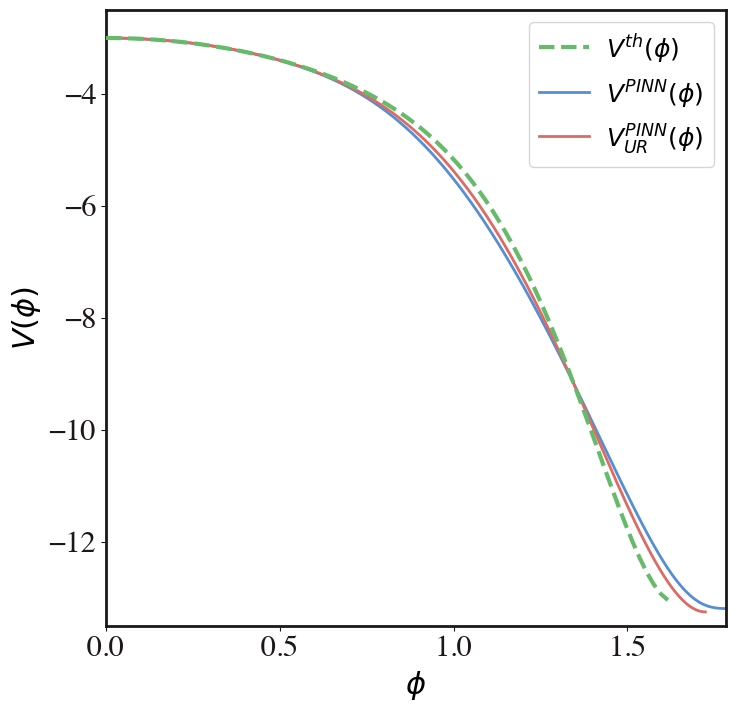

In [113]:
phim = phim_param
sampling_pts = 100
save_fig = True
best = False
show_legend=True
log_scale=False

alpha=0.6

col2 = ['C0','C1','C2']

#Import curves
path_NN_results = '0.9 TL/'
# Access the columns

Vdata_flat = pd.read_csv(f'{path_NN_results}/V_head_0_epoch_5100000.csv',header=None).values

Vdata_non_flat = pd.read_csv(f'{path_NN_results}/V_non_flat_head_0_epoch_5082353.csv',header=None).values

phi_flat = Vdata_flat[1:, 0].astype(float)
V_flat = Vdata_flat[1:, 1].astype(float) 

phi_non_flat = Vdata_non_flat[1:, 0].astype(float)
V_non_flat = Vdata_non_flat[1:, 1].astype(float) 

# phi_h_th = phi_th[np.argmin(V_or(phi_th,phim[head]))]
# phi_h_th_list.append(phi_h_th)
# V_nn_interp = interp1d(phi.cpu().detach().numpy()[:,0], Vv.cpu().detach().numpy()[:,0])
# V_nn_h = V_nn_interp(phi_h)
# ind = np.argmax(phi_h)
# V_nn_min_list.append(V_nn_h[ind])
#  plt.axvline(phi_h_th, color = col_th[head], linestyle = 'dashed', linewidth=1,alpha=alpha)
# plt.axvline(max(phi_h), color = col_new[head], linestyle = 'solid', linewidth = 1, alpha=alpha)
# plt.axhline(min(V_or(phi_th, phim[head])), color = col_th[head], linestyle ='dotted', linewidth=1,alpha=alpha)  
# plt.axhline(V_nn_h[ind], color = col_new[head], linestyle ='solid', linewidth = 1, alpha=alpha)


phi_th = torch.linspace(0,2,100)
Vth = V_or(phi_th, phim=0.9).reshape(-1,1)
ind = np.argmin(Vth)

fig = plt.figure(figsize=(8,8))

plt.plot(phi_th[:ind], Vth[:ind], label='$V^{th}(\phi)$', color = col2[0], linestyle = 'dashed', linewidth = 3, zorder=3)
plt.plot(phi_non_flat, V_non_flat,label='$V^{PINN}(\phi)$', color = col2[1], linestyle = 'solid', linewidth = 2, zorder=1)
plt.plot(phi_flat,V_flat, label='$V^{PINN}_{UR}(\phi)$', color = col2[2], linestyle = 'solid', linewidth = 2, zorder=2)

#ytic = -np.arange(3, 14, 2)
#plt.yticks(ytic)
plt.xlim(0, max(phi_non_flat))
plt.ylim(-13.5, -2.5)
#plt.title(r'$\phi_M=0.9$ from TL')
plt.xlabel(r'$\phi$')
plt.ylabel(r'$V(\phi)$')

if show_legend==True:
    plt.legend(
        loc='upper right', 
        #bbox_to_anchor=(1, 0.5), 
        ncol=1, 
        handleheight=1.5,    # Increase spacing between rows
        handletextpad=0.7,   # Space between handles and labels
        columnspacing=2.0,
        fontsize = 18
    )
    
if log_scale==True:
    plt.yscale('symlog')

if save_fig == True:
    fig.savefig(f'{plot_save_path}/Holo_V_0_9_TL.pdf',bbox_inches="tight")  #,bbox_inches="tight")
plt.show()

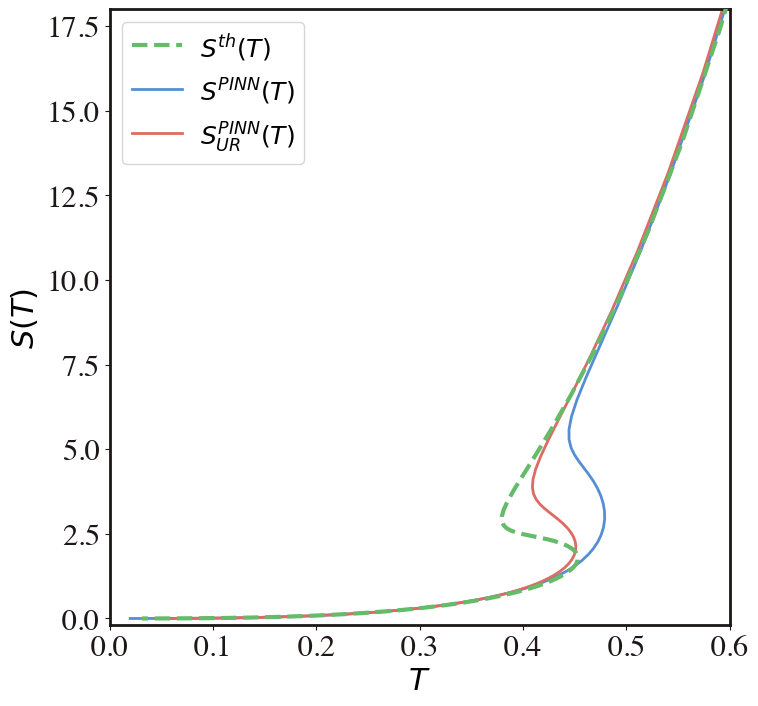

In [112]:
phim = phim_param
sampling_pts = 100
save_fig = True
best = False
show_legend=True
log_scale=False

alpha=0.6

col2 = ['C0','C1','C2']

#Import curves
path_NN_results = '0.9 TL/'
sofTdata_flat = pd.read_csv(f'{path_NN_results}/SofT_0_9_epoch_5100000_Vpts_1000_V2.txt', sep=" ", header=None).values
sofTdata_non_flat = pd.read_csv(f'{path_NN_results}/sofT_non_flat_0_9_epoch_5082353.txt', sep=" ", header=None).values

orig_sofT_path = f"Data/SofT/SofTphiM" + '0_9' + ".txt"
sofTdata_orig = pd.read_csv(f'{orig_sofT_path}', sep=" ", header=None).values

T_flat = sofTdata_flat[1:, 0].astype(float)
S_flat = sofTdata_flat[1:, 1].astype(float) 

T_non_flat = sofTdata_non_flat[1:, 0].astype(float)
S_non_flat = sofTdata_non_flat[1:, 1].astype(float) 

T_orig = sofTdata_orig[1:, 0].astype(float)
S_orig = sofTdata_orig[1:, 1].astype(float) 

fig=plt.figure(figsize=(8,8))

plt.plot(T_orig, S_orig, label='$S^{th}(T)$', color = col2[0], linestyle = 'dashed', linewidth = 3, zorder=3)
plt.plot(T_non_flat, S_non_flat,label='$S^{PINN}(T)$', color = col2[1], linestyle = 'solid', linewidth = 2, zorder=1)
plt.plot(T_flat, S_flat, label='$S^{PINN}_{UR}(T)$', color = col2[2], linestyle = 'solid', linewidth = 2, zorder=2)

# ytic = -np.arange(3, 14, 2)
# plt.yticks(ytic)
plt.xlim(0, 0.6)
plt.ylim(-0.2, 18)
#plt.title(r'$\phi_M=0.9$ from TL')
plt.xlabel(r'$T$')
plt.ylabel(r'$S(T)$')

if show_legend==True:
    plt.legend(
        loc='upper left', 
        #bbox_to_anchor=(1, 0.5), 
        ncol=1, 
        handleheight=1.5,    # Increase spacing between rows
        handletextpad=0.7,   # Space between handles and labels
        columnspacing=2.0,
        fontsize=18
    )
    
if log_scale==True:
    plt.yscale('symlog')

if save_fig == True:
    fig.savefig(f'{plot_save_path}/Holo_sofT_0_9_TL.pdf',bbox_inches="tight")
plt.show()

In [109]:
phim = phim_param
sampling_pts = 100
save_fig = True
best = False
show_legend=True
log_scale=False

alpha=0.6

col2 = ['C0','C1','C2']

#Import curves
path_NN_results = '0.9 TL/'
sofTdata_flat = pd.read_csv(f'{path_NN_results}/SofT_0_9_epoch_5100000_Vpts_1000_V2.txt', sep=" ", header=None).values
sofTdata_non_flat = pd.read_csv(f'{path_NN_results}/sofT_non_flat_0_9_epoch_5082353.txt', sep=" ", header=None).values

orig_sofT_path = f"Data/SofT/SofTphiM" + '0_9' + ".txt"
sofTdata_orig = pd.read_csv(f'{orig_sofT_path}', sep=" ", header=None).values

T_flat = sofTdata_flat[1:, 0].astype(float)
S_flat = sofTdata_flat[1:, 1].astype(float) 

T_non_flat = sofTdata_non_flat[1:, 0].astype(float)
S_non_flat = sofTdata_non_flat[1:, 1].astype(float) 

T_orig = sofTdata_orig[1:, 0].astype(float)
S_orig = sofTdata_orig[1:, 1].astype(float) 

fig,ax = plt.subplots(figsize = (8,8))

plt.plot(T_orig, S_orig, label=fr'Theory', color = col2[0], linestyle = 'dashed', linewidth = 3, zorder=3)
plt.plot(T_non_flat, S_non_flat,label=fr'Non-flat NN', color = col2[1], linestyle = 'solid', linewidth = 2, zorder=1)
plt.plot(T_flat, S_flat, label=fr'Flat NN', color = col2[2], linestyle = 'solid', linewidth = 2, zorder=2)

# ytic = -np.arange(3, 14, 2)
# plt.yticks(ytic)
plt.xlim(right = 1)
plt.ylim(bottom=-1, top = 93)
#plt.title(r'$\phi_M=0.9$ from TL')
plt.xlabel(r'$T$', fontsize = fontsize)
plt.ylabel(r'$S(T)$',fontsize = fontsize)

if show_legend==True:
    plt.legend(
        loc='upper left', 
        #bbox_to_anchor=(1, 0.5), 
        ncol=1, 
        handleheight=1.5,    # Increase spacing between rows
        handletextpad=0.7,   # Space between handles and labels
        columnspacing=2.0,
        fontsize=14
    )

# Create inset plot
x0, y0 = 0.1,0.25  # Specify the lower-left corner of the inset plot in relative coordinates
width, height = 3,3 # Specify the width and height of the inset plot in relative coordinates

# Create inset plot
axin = inset_axes(ax, width=width, height=height, loc='lower left', bbox_to_anchor=(x0, y0), bbox_transform=ax.transAxes)

plt.plot(T_orig, S_orig, label=fr'Theory', color = col2[0], linestyle = 'dashed', linewidth = 3, zorder=3)
plt.plot(T_non_flat, S_non_flat,label=fr'Non-flat NN', color = col2[1], linestyle = 'solid', linewidth = 2, zorder=1)
plt.plot(T_flat, S_flat, label=fr'Flat NN', color = col2[2], linestyle = 'solid', linewidth = 2, zorder=2)
#axin.plot((d.solver.Va_uh_list[k][point].cpu().detach().numpy()),d.solver.Sigma_uh_list[k][point].cpu().detach().numpy(), 'x',ms=10,mew = 2, color=col[k])

# draw a bbox of the region of the inset axes in the parent axes and
# connecting lines between the bbox and the inset axes area

mark_inset(ax, axin, loc1=3, loc2=4, fc="none", ec="0.3")

axin.set_xlim(left = 0.3, right = 0.5)
axin.set_ylim(top = 10,bottom= 0.3)


if log_scale==True:
    plt.yscale('symlog')

if save_fig == True:
    fig.savefig(f'{plot_save_path}/Holo_sofT_0_9_TL_little_box.pdf',bbox_inches="tight")  #,bbox_inches="tight")
plt.show()

AttributeError: 'NoneType' object has no attribute '_get_renderer'

AttributeError: 'NoneType' object has no attribute '_get_renderer'

<Figure size 800x800 with 2 Axes>

### Relative errors $\phi_M=0.9$ plots

You again need to do separately 0.9 and 0.7. There are different cells for each one, but you need to change which TL net you load to do 0.9 or 0.7 (otherwise both cells will generate the same plots)

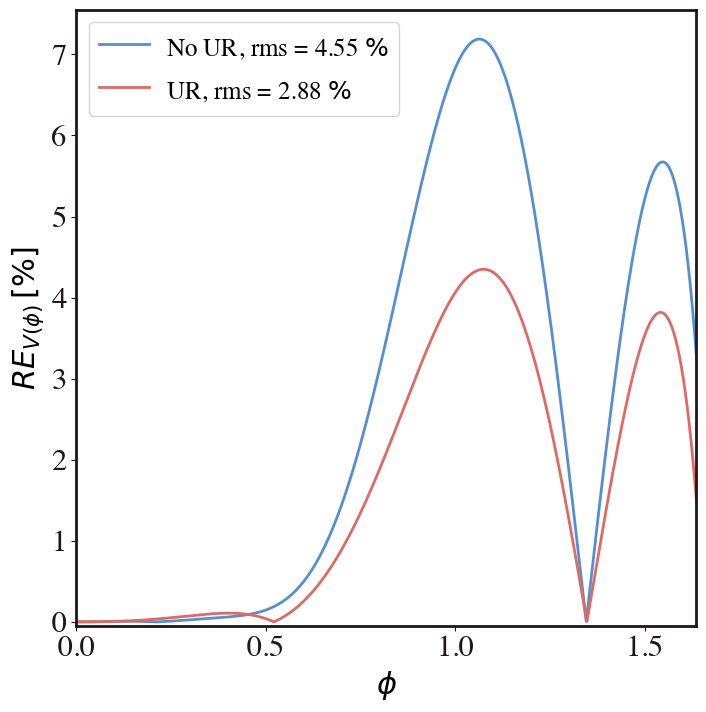

In [91]:
save_fig = True
show_legend=True
log_scale=False

alpha=0.6

col2 = ['C0','C1','C2']

#Import curves
path_NN_results = "0.9 TL"
# Access the columns

re_data_flat = pd.read_csv(f'{path_NN_results}/rel_err_V_flat_Vpts_1000.csv',header=None).values

re_data_non_flat = pd.read_csv(f'{path_NN_results}/rel_error_V_non_flat.csv',header=None).values

re_phi_flat = (1/2)*re_data_flat[1:, 0].astype(float)
re_V_flat = re_data_flat[1:, 1].astype(float) 

re_phi_non_flat = (1/2)*re_data_non_flat[1:, 0].astype(float)
re_V_non_flat = re_data_non_flat[1:, 1].astype(float) 

a=0
for i in range(len(re_V_non_flat)):
    a+=re_V_non_flat[i]**2
rms_non_flat = np.sqrt((1/len(re_V_non_flat)) * a)

b=0
for i in range(len(re_V_flat)):
    b+=re_V_flat[i]**2
rms_flat = np.sqrt((1/len(re_V_flat)) *b)


fig = plt.figure(figsize=(8,8))
plt.plot(re_phi_non_flat, re_V_non_flat,label = fr'No UR, rms = {rms_non_flat:.2f} $\%$', color = col2[1], linestyle = 'solid', linewidth = 2, zorder=1)
plt.plot(re_phi_flat,re_V_flat, label=fr'UR, rms = {rms_flat:.2f} $\%$', color = col2[2], linestyle = 'solid', linewidth = 2, zorder=2)


#plt.xscale('log')
#plt.yscale('log')

plt.xlim(0, phi_th[np.argmin(Vth)])
plt.ylim(bottom=-0.05,)
#plt.title(r'$\phi_M=0.9$ from TL')
plt.xlabel(r'$\phi$')
plt.ylabel(r'$RE_{V(\phi)}  \,[\%]$')  #= \left|\frac{V_{th}(\phi)  - V_{NN}(\phi) }{V_{th}(\phi) }\right|\cdot 100

if show_legend==True:
    plt.legend(
        loc='upper left', 
        #bbox_to_anchor=(1, 0.5), 
        ncol=1, 
        handleheight=1.5,    # Increase spacing between rows
        handletextpad=0.7,   # Space between handles and labels
        columnspacing=2.0,
        fontsize=18
    )
    
if log_scale==True:
    plt.yscale('symlog')

if save_fig == True:
    fig.savefig(f'{plot_save_path}/rel_err_V_0_9_TL.pdf',bbox_inches="tight")  #,bbox_inches="tight")
plt.show()

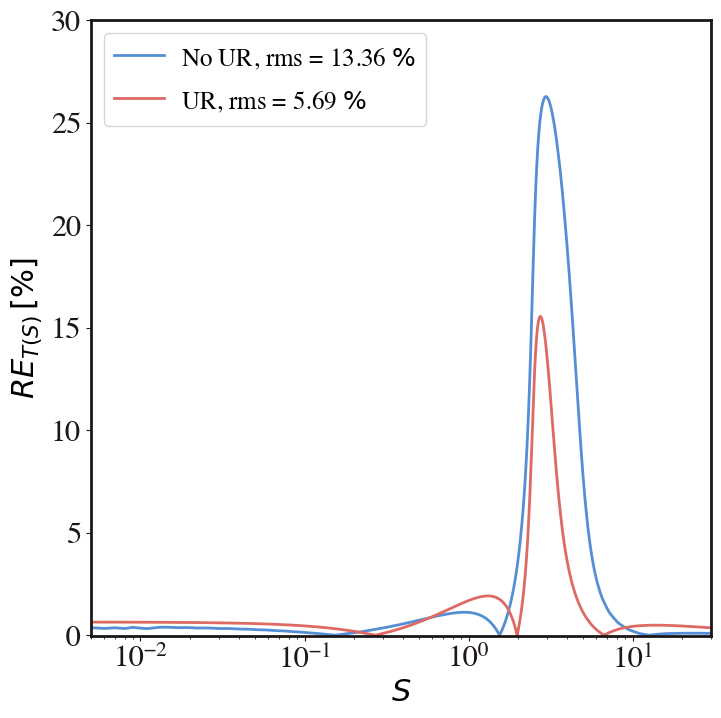

In [111]:
save_fig = True
show_legend=True
log_scale=False

alpha=0.6

col2 = ['C0','C1','C2']

#Import curves
path_NN_results = '0.9 TL/'
# Access the columns

re_data_flat = pd.read_csv(f'{path_NN_results}/rel_err_sofT_flat_Vpts_1000.csv',header=None).values

re_data_non_flat = pd.read_csv(f'{path_NN_results}/rel_error_sofT_non_flat.csv',header=None).values

re_x_flat = re_data_flat[1:, 0].astype(float)
re_y_flat = re_data_flat[1:, 1].astype(float) 

re_x_non_flat = re_data_non_flat[1:, 0].astype(float)
re_y_non_flat = re_data_non_flat[1:, 1].astype(float) 

a=0
for i in range(len(re_y_non_flat)):
    a+=re_y_non_flat[i]**2
rms_non_flat = np.sqrt((1/len(re_y_non_flat)) * a)

b=0
for i in range(len(re_y_flat)):
    b+=re_y_flat[i]**2
rms_flat = np.sqrt((1/len(re_y_flat)) *b)

fig = plt.figure(figsize=(8,8))
plt.plot(re_x_non_flat, re_y_non_flat,label=fr'No UR, rms = {rms_non_flat:.2f} $\%$', color = col2[1], linestyle = 'solid', linewidth = 2, zorder=1)
plt.plot(re_x_flat,re_y_flat, label=fr'UR, rms = {rms_flat:.2f} $\%$', color = col2[2], linestyle = 'solid', linewidth = 2, zorder=2)

# ytic = -np.arange(3, 14, 2)
# plt.yticks(ytic)

plt.xscale('log')
# plt.yscale('log')

plt.xlim(0.005, 30)
plt.ylim(bottom=-0.05,top=30)

#plt.title(r'$\phi_M=0.9$ from TL')
plt.xlabel(r'$S$')
plt.ylabel(r'$RE_{T(S)}  \,[\%]$')  #= \left|\frac{V_{th}(\phi)  - V_{NN}(\phi) }{V_{th}(\phi) }\right|\cdot 100

if show_legend==True:
    plt.legend(
        loc='upper left', 
        #bbox_to_anchor=(1, 0.5), 
        ncol=1, 
        handleheight=1.5,    # Increase spacing between rows
        handletextpad=0.7,   # Space between handles and labels
        columnspacing=2.0,
        fontsize=18
    )
    
if log_scale==True:
    plt.yscale('symlog')

if save_fig == True:
    fig.savefig(f'{plot_save_path}/rel_err_sofT_0_9_TL.pdf',bbox_inches="tight")  #,bbox_inches="tight")
plt.show()

### All $\phi_M=0.7$ TL plots

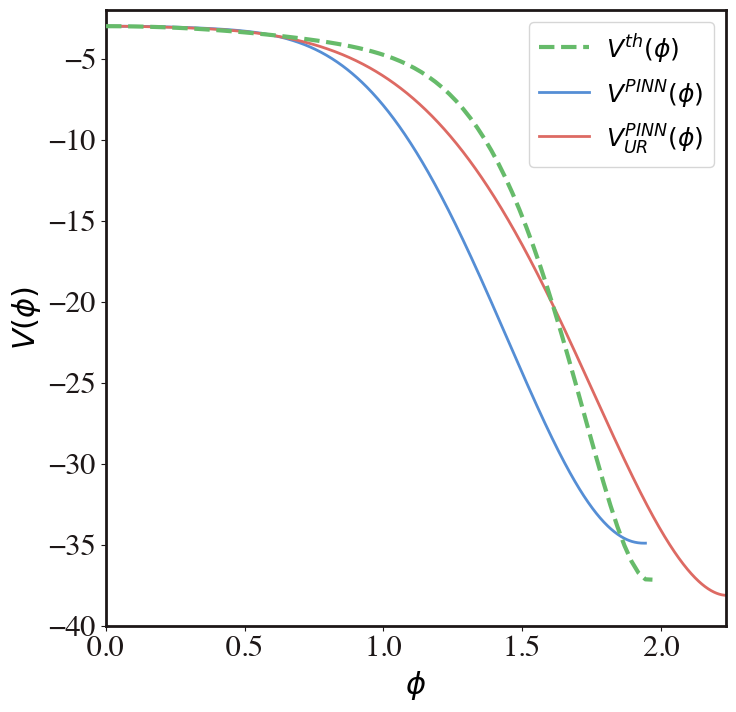

In [114]:
phim = phim_param
sampling_pts = 100
save_fig = True
best = False
show_legend=True
log_scale=False

alpha=0.6

col2 = ['C0','C1','C2','C3','C4', 'C5', 'C6']

#Import curves
path_NN_results = '0.7 TL/'
# Access the columns

Vdata_flat = pd.read_csv(f'{path_NN_results}/V_head_0_epoch_5100000_pts1000.csv',header=None).values
# Vdata_flat_4e6 = pd.read_csv(f'{path_NN_results}/V_head_0_epoch_4000000.csv',header=None).values
# Vdata_flat_5e6 = pd.read_csv(f'{path_NN_results}/V_head_0_epoch_5000000.csv',header=None).values

Vdata_non_flat = pd.read_csv(f'{path_NN_results}/V_phiM_07_pedro_no_UR.csv',header=None).values

phi_flat = Vdata_flat[1:, 0].astype(float)
V_flat = Vdata_flat[1:, 1].astype(float) 

# phi_flat_4e6 = Vdata_flat_4e6[1:, 0].astype(float)
# V_flat_4e6 = Vdata_flat_4e6[1:, 1].astype(float) 

# phi_flat_5e6 = Vdata_flat_5e6[1:, 0].astype(float)
# V_flat_5e6 = Vdata_flat_5e6[1:, 1].astype(float) 

phi_non_flat = Vdata_non_flat[1:, 0].astype(float)
V_non_flat = Vdata_non_flat[1:, 1].astype(float) 


phi_th = torch.linspace(0,2.5,100)
Vth = V_or(phi_th, phim=0.7).reshape(-1,1)
ind = np.argmin(Vth)+1

fig = plt.figure(figsize=(8,8))

plt.plot(phi_th[:ind], Vth[:ind], label='$V^{th}(\phi)$', color = col2[0], linestyle = 'dashed', linewidth = 3, zorder=3)
plt.plot(phi_non_flat, V_non_flat,label='$V^{PINN}(\phi)$', color = col2[1], linestyle = 'solid', linewidth = 2, zorder=1)
plt.plot(phi_flat,V_flat, label='$V^{PINN}_{UR}(\phi)$', color = col2[2], linestyle = 'solid', linewidth = 2, zorder=2)
# plt.plot(phi_flat_4e6, V_flat_4e6, label=fr'NN, UR body (TL only head)', color = col[4], linestyle = 'solid', linewidth = 2, zorder=2)
#plt.plot(phi_flat_5e6, V_flat_5e6, label=fr'NN, UR body', color = col2[4], linestyle = 'solid', linewidth = 1, zorder=2)

# ytic = -np.arange(3, 14, 2)
# plt.yticks(ytic)
plt.xlim(0, max(phi_flat))
plt.ylim(-40, -2)
#plt.title(r'$\phi_M=0.9$ from TL')
plt.xlabel(r'$\phi$')
plt.ylabel(r'$V(\phi)$')

if show_legend==True:
    plt.legend(
        loc='upper right', 
        #bbox_to_anchor=(1, 0.5), 
        ncol=1, 
        handleheight=1.5,    # Increase spacing between rows
        handletextpad=0.7,   # Space between handles and labels
        columnspacing=2.0,
        fontsize=18
    )
    
if log_scale==True:
    plt.yscale('symlog')

if save_fig == True:
    fig.savefig(f'{plot_save_path}/Holo_V_0_7_TL.pdf',bbox_inches="tight")  #,bbox_inches="tight")
plt.show()

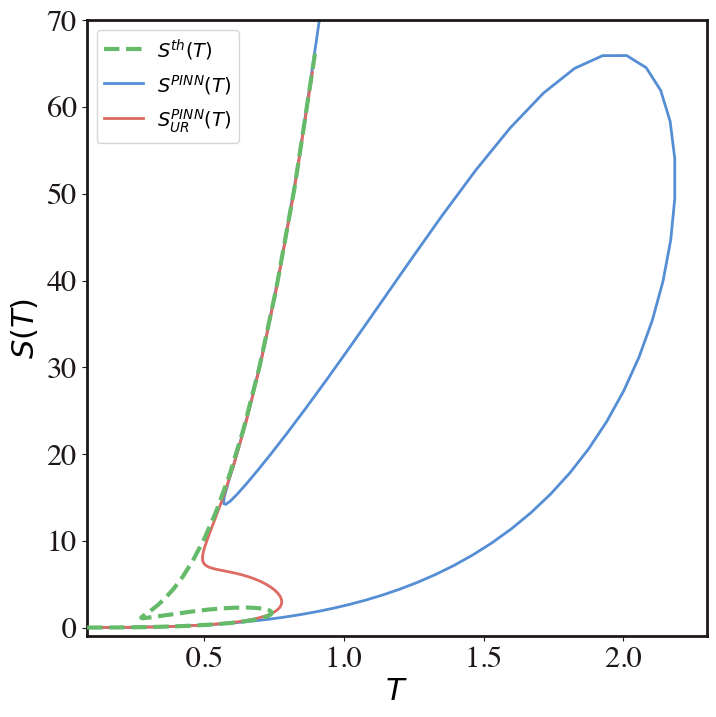

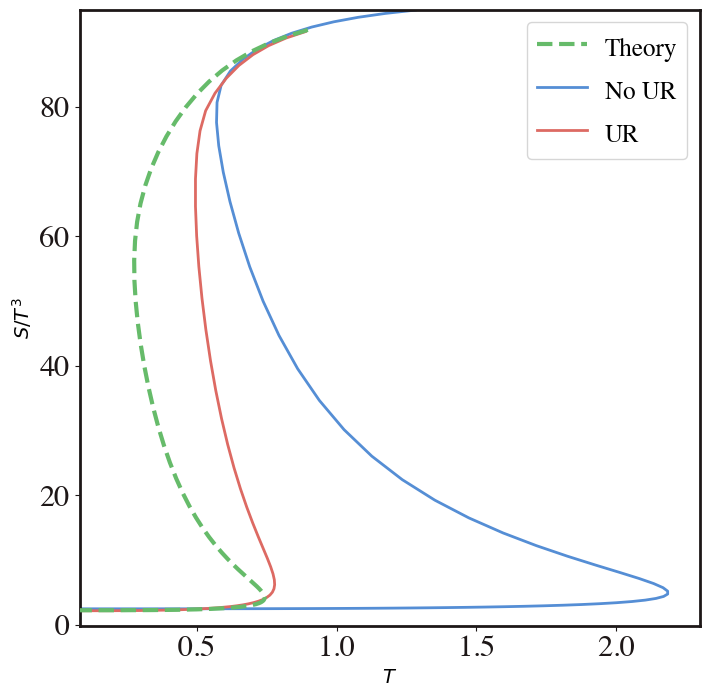

In [115]:
phim = phim_param
sampling_pts = 100
save_fig = True
best = False
show_legend=True
log_scale=False

alpha=0.6

col2 = ['C0','C1','C2']

#Import curves
path_NN_results = '0.7 TL/'
sofTdata_flat = pd.read_csv(f'{path_NN_results}/SofT_0_7_epoch_5100000_pts100.txt', sep=" ", header=None).values
sofTdata_non_flat = pd.read_csv(f'{path_NN_results}/recover_07_pedro_no_UR.txt', sep=" ", header=None).values

orig_sofT_path = f"Data/SofT/SofTphiM" + '0_7' + ".txt"
sofTdata_orig = pd.read_csv(f'{orig_sofT_path}', sep=" ", header=None).values

T_flat = sofTdata_flat[1:, 0].astype(float)
S_flat = sofTdata_flat[1:, 1].astype(float) 

T_non_flat = sofTdata_non_flat[1:, 0].astype(float)
S_non_flat = sofTdata_non_flat[1:, 1].astype(float) 

T_orig = sofTdata_orig[1:, 0].astype(float)
S_orig = sofTdata_orig[1:, 1].astype(float) 

fig=plt.figure(figsize=(8,8))

plt.plot(T_orig, S_orig, label='$S^{th}(T)$', color = col2[0], linestyle = 'dashed', linewidth = 3, zorder=3)
plt.plot(T_non_flat, S_non_flat,label='$S^{PINN}(T)$', color = col2[1], linestyle = 'solid', linewidth = 2, zorder=1)
plt.plot(T_flat, S_flat, label='$S^{PINN}_{UR}(T)$', color = col2[2], linestyle = 'solid', linewidth = 2, zorder=2)

# ytic = -np.arange(3, 14, 2)
# plt.yticks(ytic)
plt.xlim(min(T_orig), 2.3)
plt.ylim(-1, 70)
#plt.title(r'$\phi_M=0.9$ from TL')
plt.xlabel(r'$T$')
plt.ylabel(r'$S(T)$')

if show_legend==True:
    plt.legend(
        loc='upper left', 
        #bbox_to_anchor=(1, 0.5), 
        ncol=1, 
        handleheight=1.5,    # Increase spacing between rows
        handletextpad=0.7,   # Space between handles and labels
        columnspacing=2.0,
        fontsize=14
    )
    
if log_scale==True:
    plt.yscale('symlog')

if save_fig == True:
    fig.savefig(f'{plot_save_path}/Holo_sofT_0_7_TL.pdf',bbox_inches="tight")
plt.show()

fig2=plt.figure(figsize=(8,8))

plt.plot(T_orig, S_orig/T_orig**3, label=fr'Theory', color = col2[0], linestyle = 'dashed', linewidth = 3, zorder=3)
plt.plot(T_non_flat, S_non_flat/T_non_flat**3,label=fr'No UR', color = col2[1], linestyle = 'solid', linewidth = 2, zorder=1)
plt.plot(T_flat, S_flat/T_flat**3, label=fr'UR', color = col2[2], linestyle = 'solid', linewidth = 2, zorder=2)
plt.legend()

# ytic = -np.arange(3, 14, 2)
# plt.yticks(ytic)
plt.xlim(min(T_orig), 2.3)
plt.ylim(-0.2, 95)
#plt.title(r'$\phi_M=0.9$ from TL')
plt.xlabel(r'$T$', fontsize = fontsize)
plt.ylabel(r'$S/T^3$',fontsize = fontsize)

if show_legend==True:
    plt.legend(
        loc='upper right', 
        #bbox_to_anchor=(1, 0.5), 
        ncol=1, 
        handleheight=1.5,    # Increase spacing between rows
        handletextpad=0.7,   # Space between handles and labels
        columnspacing=2.0,
        fontsize=18
    )
    
if log_scale==True:
    plt.yscale('symlog')

if save_fig == True:
    fig2.savefig(f'{plot_save_path}/Holo_soverT3_0_7_TL.pdf',bbox_inches="tight")
plt.show()

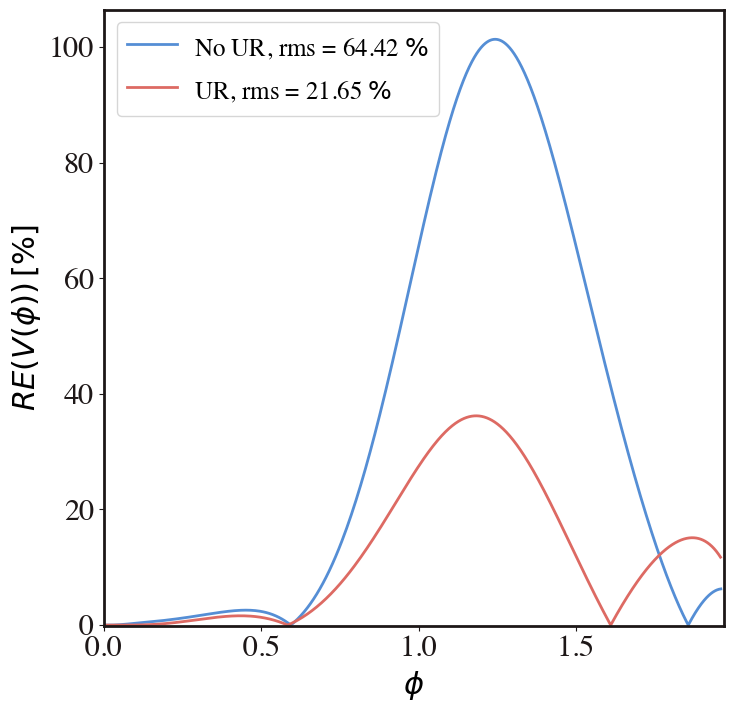

In [100]:
save_fig = True
show_legend=True
log_scale=False

alpha=0.6

col2 = ['C0','C1','C2']

#Import curves
path_NN_results = '0.7 TL/'
# Access the columns

re_data_flat = pd.read_csv(f'{path_NN_results}/rel_error_V_0_7_5.1e6_1000pts.csv',header=None).values

re_data_non_flat = pd.read_csv(f'{path_NN_results}/rel_error_V_0_7_pedro_no_UR.csv',header=None).values

re_phi_flat = (1/2)*re_data_flat[1:, 0].astype(float)
re_V_flat = re_data_flat[1:, 1].astype(float) 

re_phi_non_flat = (1/2)*re_data_non_flat[1:, 0].astype(float)
re_V_non_flat = re_data_non_flat[1:, 1].astype(float) 

a=0
for i in range(len(re_V_non_flat)):
    a+=re_V_non_flat[i]**2
rms_non_flat = np.sqrt((1/len(re_V_non_flat)) * a)

b=0
for i in range(len(re_V_flat)):
    b+=re_V_flat[i]**2
rms_flat = np.sqrt((1/len(re_V_flat)) *b)


fig = plt.figure(figsize=(8,8))
plt.plot(re_phi_non_flat, re_V_non_flat,label = fr'No UR, rms = {rms_non_flat:.2f} $\%$', color = col2[1], linestyle = 'solid', linewidth = 2, zorder=1)
plt.plot(re_phi_flat, re_V_flat, label=fr'UR, rms = {rms_flat:.2f} $\%$', color = col2[2], linestyle = 'solid', linewidth = 2, zorder=2)


#plt.xscale('log')
#plt.yscale('log')

plt.xlim(0, phi_th[np.argmin(Vth)])
plt.ylim(bottom=-0.15,)
#plt.title(r'$\phi_M=0.9$ from TL')
plt.xlabel(r'$\phi$')
plt.ylabel(r'$RE \left( V(\phi)\right ) \,[\%]$')  #= \left|\frac{V_{th}(\phi)  - V_{NN}(\phi) }{V_{th}(\phi) }\right|\cdot 100

if show_legend==True:
    plt.legend(
        loc='upper left', 
        #bbox_to_anchor=(1, 0.5), 
        ncol=1, 
        handleheight=1.5,    # Increase spacing between rows
        handletextpad=0.7,   # Space between handles and labels
        columnspacing=2.0,
        fontsize=18
    )
    
if log_scale==True:
    plt.yscale('symlog')

if save_fig == True:
    fig.savefig(f'{plot_save_path}/rel_err_V_0_7_TL.pdf',bbox_inches="tight")  #,bbox_inches="tight")
plt.show()

In [102]:
from matplotlib.ticker import LogLocator

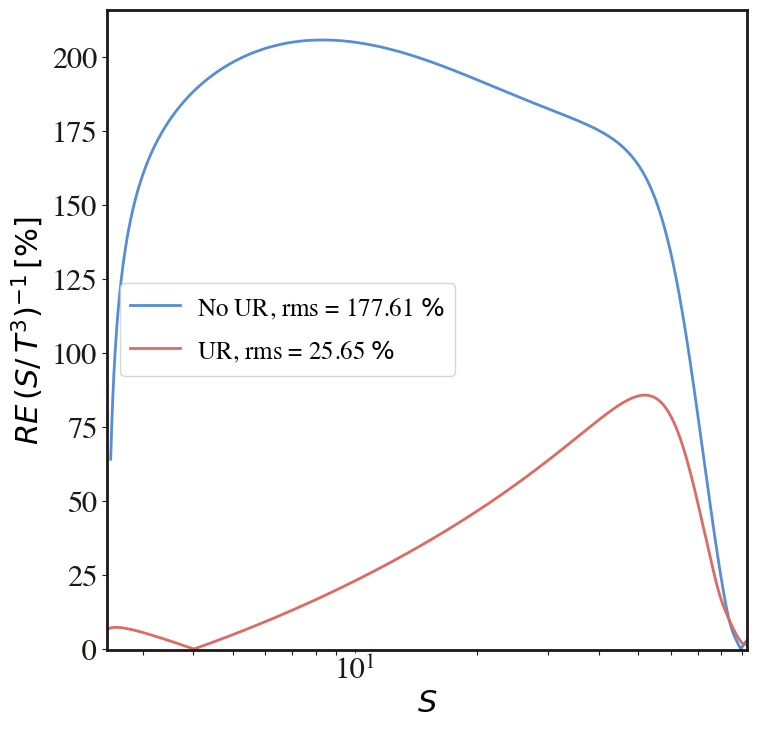

In [105]:
show_legend=True
log_scale=False
save_fig = True

alpha=0.6

col2 = ['C0','C1','C2']

#Import curves
path_NN_results = '0.7 TL/'
# Access the columns

re_data_flat = pd.read_csv(f'{path_NN_results}/rel_error_sofT_0_7_5100000_pts100.csv',header=None).values

re_data_non_flat = pd.read_csv(f'{path_NN_results}/rel_error_sofT_0_7_pedro_no_UR.csv',header=None).values

re_x_flat = re_data_flat[1:, 0].astype(float)
re_y_flat = re_data_flat[1:, 1].astype(float) 

re_x_non_flat = re_data_non_flat[1:, 0].astype(float)
re_y_non_flat = re_data_non_flat[1:, 1].astype(float) 

a=0
for i in range(len(re_y_non_flat)):
    a+=re_y_non_flat[i]**2
rms_non_flat = np.sqrt((1/len(re_y_non_flat)) * a)

b=0
for i in range(len(re_y_flat)):
    b+=re_y_flat[i]**2
rms_flat = np.sqrt((1/len(re_y_flat)) *b)

fig = plt.figure(figsize=(8,8))

ax = fig.add_axes([0.1, 0.1, 0.8, 0.8])  # Add an axis to the figure


ax.plot(re_x_non_flat, re_y_non_flat,label=fr'No UR, rms = {rms_non_flat:.2f} $\%$', color = col2[1], linestyle = 'solid', linewidth = 2, zorder=1)
ax.plot(re_x_flat,re_y_flat, label=fr'UR, rms = {rms_flat:.2f} $\%$', color = col2[2], linestyle = 'solid', linewidth = 2, zorder=2)

ax.set_xlim(left=min(re_x_non_flat)-0.05, right=max(re_x_flat))
ax.set_ylim(bottom=-0.15,)

# Set the x-axis to log scale
ax.set_xscale('log')

# Customize the ticks
ax.xaxis.set_major_locator(LogLocator(base=10.0, subs=None, numticks=10))  # Major ticks at powers of 10
ax.xaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(1.0, 10.0) * 0.1, numticks=10))  # Minor ticks

# Add labels and show the plot
ax.set_xlabel(r'$S$')
ax.set_ylabel(r'$RE \,\left(S/\,T^3\right)^{-1}   \,[\%]$')  

# plt.plot(re_x_non_flat, re_y_non_flat,label=fr'No UR, rms = {rms_non_flat:.2f} $\%$', color = col2[1], linestyle = 'solid', linewidth = 2, zorder=1)
# plt.plot(re_x_flat,re_y_flat, label=fr'UR, rms = {rms_flat:.2f} $\%$', color = col2[2], linestyle = 'solid', linewidth = 2, zorder=2)

# plt.xscale('log')

# # ytic = -np.arange(10, 14, 2)
# xtic = ['1','2','3']
# plt.xticks(xtic)

# plt.yscale('log')

#plt.title(r'$\phi_M=0.9$ from TL')
# plt.xlabel(r'$S$', fontsize = fontsize)
# plt.ylabel(r'$RE_{T(S)}  \,[\%]$',fontsize = fontsize)  #= \left|\frac{V_{th}(\phi)  - V_{NN}(\phi) }{V_{th}(\phi) }\right|\cdot 100

if show_legend==True:
    plt.legend(
        loc='center left', 
        #bbox_to_anchor=(1, 0.5), 
        ncol=1, 
        handleheight=1.5,    # Increase spacing between rows
        handletextpad=0.7,   # Space between handles and labels
        columnspacing=2.0,
        fontsize=18
    )
    
if log_scale==True:
    plt.yscale('symlog')

if save_fig == True:
    fig.savefig(f'{plot_save_path}/rel_err_sofT_0_7_TL.pdf',bbox_inches="tight")  #,bbox_inches="tight")
plt.show()

# Train more

In [28]:
d.g1.get_examples().size()

torch.Size([64])

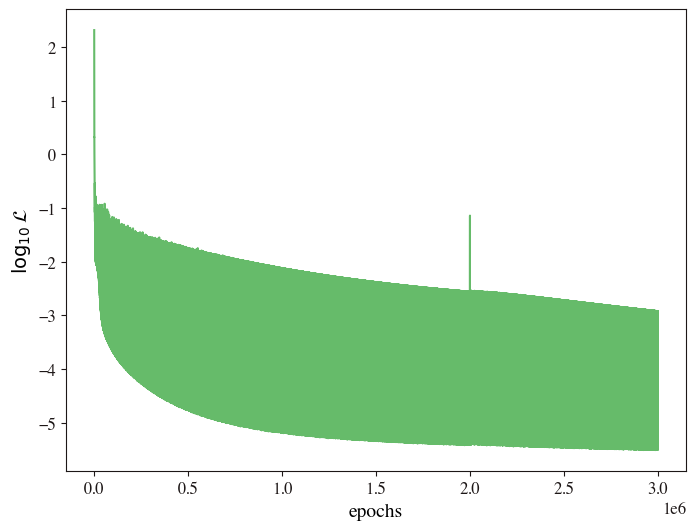

Min loss:  3.094934768722988e-06
max phi_h=  1.210581876583789
max phi_h=  1.2710463761645037
max phi_h=  1.3535575983015151
max phi_h=  1.5324795596029284
max phi_h=  1.6060513365714724


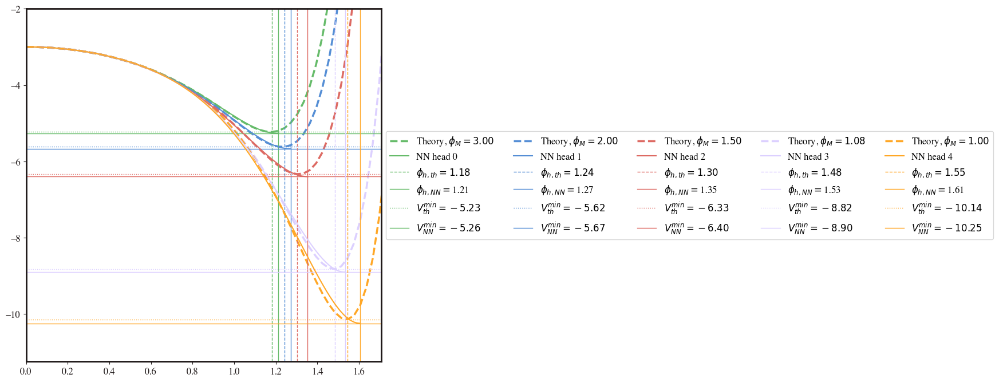

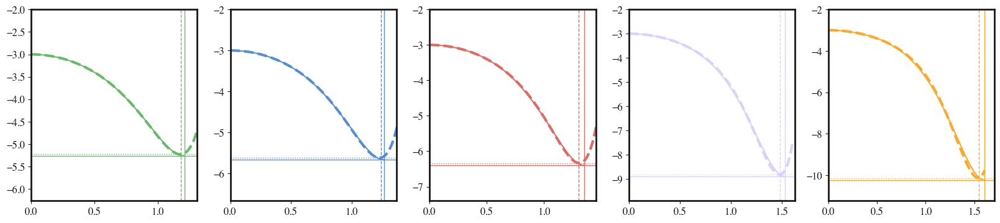

In [30]:
d.plot_loss(save_fig=False)
d.plot_potential(phim=phim_param, save_fig=False, show_legend=True)

In [9]:
#d.plot_metric(vmax=1000,save_fig=True)

## Transfer Learning (initial)

In [3]:
sofT_TL = 'SofTphiM0_9.txt'
sofT_transfer = f"/Users/pablo/Desktop/NNholo/MH_flattening_paper_3_to_1/Data/Potentials_phim/{sofT_TL}"


In [4]:
# Directory 
directory = "TL_to_0_9_from_3e6_real_deal_2"
# Parent Directory path 
parent_dir = "/Users/pablo/Desktop/NNholo/MH_flattening_paper_3_to_1/flat_5_heads/results_2/"
#PaTH
path_results_TL = os.path.join(parent_dir, directory) 

In [7]:
os.mkdir(path_results_TL) 
print("Directory '% s' created" % directory) 

FileExistsError: [Errno 17] File exists: '/Users/pablo/Desktop/NNholo/MH_flattening_paper_3_to_1/flat_5_heads/results_2/TL_to_0_9_from_3e6_real_deal_1'

In [5]:
load_path = f'{path_results_TL}/NN_5MH_flat_metric_epochs_3400000'


In [6]:
tl = NNholo_multihead_heist(transfer_sofT_path=sofT_transfer, phim_list=[0.9], \
                            saving_path = path_results_TL, load_path = load_path, \
                            u_pts = 64, transfer_lr=1e-3)  
                            
                            # new_sampling=True, \
                            # freeze_V_body=True, freeze_V_head=False, pretrained_V_head=False, \
                            # freeze_solver_body=[0,1,2,3,4,5], freeze_solver_head=[], pretrained_solver_head=[], )

Loading dictionary...


FileNotFoundError: [Errno 2] No such file or directory: '/Users/pablo/Desktop/NNholo/MH_flattening_paper_3_to_1/flat_5_heads/results_2/TL_to_0_9_from_3e6_real_deal_2/NN_5MH_flat_metric_epochs_4700000'

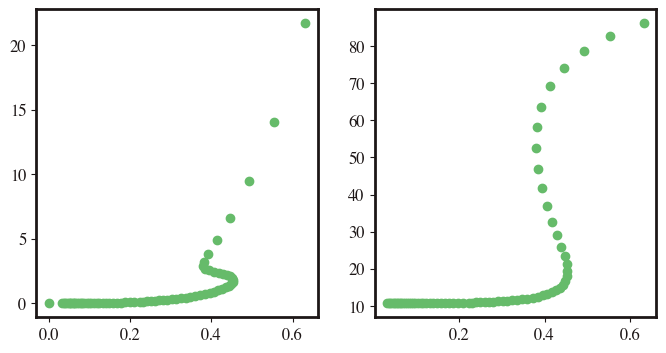

In [20]:
fig, ax=plt.subplots(1,2, figsize=(8,4))
ax[0].scatter(tl.solver.T_true, tl.solver.S_true)
ax[1].scatter(tl.solver.T_true, tl.solver.S_true/(tl.solver.T_true**3))

### Check samplings

Init pt curve S(T) ? 29


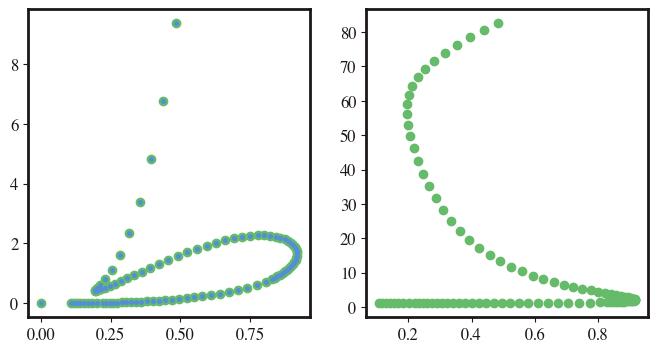

In [70]:
sofT_TL_test = 'SofTphiM0_65_more_pts_2.txt'
sofT_transfer_test = f"/Users/pablo/Desktop/NNholo/To run/January (2024)/Moving forward/Abemus saving for real/New life/ATL David/Data/Potentials_phim/{sofT_TL_test}"


df_data = pd.read_csv(sofT_transfer_test, sep=" ", header=None).values

init_pt_curve = int(input('Init pt curve S(T) ?'))   #int(input('Init UV point S(T) ? (usually 0)'))
S_true_1= torch.tensor(df_data[init_pt_curve:90:1,1])
T_true_1= torch.tensor(df_data[init_pt_curve:90:1,0])
#phi_h_true_1=torch.tensor(phih_true[50:100:10])

#S_true_2= torch.tensor(df_data[71:100:5,1])
#T_true_2= torch.tensor(df_data[71:100:5,0])

S_true_3= torch.tensor(df_data[91:165:3,1])
T_true_3= torch.tensor(df_data[91:165:3,0])
#phi_h_true_2=torch.tensor(phih_true[101:200:5])

S_true_4= torch.tensor(df_data[166:-1:5,1])
T_true_4= torch.tensor(df_data[166:-1:5,0])

S_true_lowest = torch.tensor([0])
T_true_lowest = torch.tensor([0])

S_true=torch.cat([S_true_1, S_true_3, S_true_4, S_true_lowest],dim=0)
T_true=torch.cat([T_true_1, T_true_3, T_true_4, T_true_lowest],dim=0)

fig, ax=plt.subplots(1,2, figsize=(8,4))
ax[0].scatter(tl.solver.T_true, tl.solver.S_true)
ax[0].scatter(T_true, S_true, s=7)
ax[1].scatter(T_true, S_true/(T_true**3))

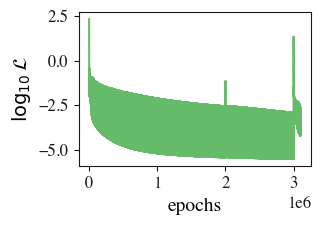

Min loss:  3.094934768722988e-06


In [57]:
tl.plot_loss(save_fig=False, figsize=(3,2))


### Train

In [21]:
store_mse = Store_MSE_Loss()

scheduler = torch.optim.lr_scheduler.StepLR(tl.adam, step_size=5000, gamma=0.985)
scheduler_cb = DoSchedulerStep(scheduler=scheduler)

potential_cb = BestValidationCallback()

In [22]:
var_name = ['Vs', 'Va', 'Vp','Sigma', 'A', 'phi']
pre_list=[]
pre_body_list=[]
for i in range(6):
    pre = copy.deepcopy(tl.solver.nets[i,0].head_model.NN[2].weight.detach().numpy())
    pre_body= copy.deepcopy(tl.solver.nets[i,0].H_model.NN[2].weight.detach().numpy())
    pre_list.append(pre)
    pre_body_list.append(pre_body)
    
V_pre = copy.deepcopy(tl.solver.V_net[0].head_model.NN[2].weight.detach().numpy())
V_body_pre = copy.deepcopy(tl.solver.V_net[0].H_model.layers[2].weight.detach().numpy())

In [23]:
retrained=0

In [24]:
tl.update_optimizer()

Actual learning rate:  0.001


In [25]:
for g in tl.adam.param_groups:
   # g['lr'] = 2.5e-4
    print(g['lr'])

0.001


In [ ]:
epochs = 100_000
for _ in range(5):
    tl.solver.fit(max_epochs=epochs, 
                     callbacks=[potential_cb, scheduler_cb],
                     tqdm_file=tqdm(total=epochs, dynamic_ncols=True, desc='Epochs', unit='iteration', colour='#0afa9e'))
    retrained+=epochs
    tl.MH_save_results(f'{path_results_TL}/TL_0_9')
    
    fig,ax=plt.subplots(1,2, figsize=(10,4))
    l_min = min(tl.solver.metrics_history['train_loss'][-retrained-50:])
    ax[0].plot(tl.solver.metrics_history['train_loss'][-retrained-50:])
    ax[0].set_yscale('log')
    ax[0].set_title('TL loss')
    ax[1].plot(tl.solver.metrics_history['train_loss'])
    ax[1].set_yscale('log')
    ax[1].set_title('Full (MH+TL) loss')
    print('Min loss TL', min(tl.solver.metrics_history['train_loss'][-10000:]))
    fig.savefig(f'{path_results_TL}/loss_epoch_{tl.solver.global_epoch}.pdf')
    plt.show()

    tl.plot_potential(phim=[0.9], save_fig=True)
    tl.plot_residuals_in_u(max_bound=1e-2, save_fig=True)
    

Epochs:   0%|                                 | 0/100000 [00:00<?, ?iteration/s]

In [1]:
epochs = 10
tl.solver.fit(max_epochs=epochs, 
                     callbacks=[potential_cb, scheduler_cb],
                     tqdm_file=tqdm(total=epochs, dynamic_ncols=True, desc='Epochs', unit='iteration', colour='#0afa9e'))
retrained+=epochs

NameError: name 'tl' is not defined

In [18]:
tl.MH_save_results(f'{path_results_TL}/TL_0_9')

Model succesfully saved


In [77]:
retrained

110000

## Unfreezing of weights for TL

### Load piece with already TL epochs

In [7]:
sofT_TL = 'SofTphiM0_9.txt'
sofT_transfer = f"/Users/pablo/Desktop/NNholo/MH_flattening_paper_3_to_1/Data/Potentials_phim/{sofT_TL}"


In [15]:
# Directory 
directory = "TL_to_0_9_from_3e6_real_deal_1"
# Parent Directory path 
parent_dir = "/Users/pablo/Desktop/NNholo/MH_flattening_paper_3_to_1/flat_5_heads/results_2/"
#PaTH
path_results_TL = os.path.join(parent_dir, directory) 

In [21]:
#os.mkdir(path_results_TL) 
print("Directory '% s' created" % directory) 

Directory 'TL_to_0_9_from_3e6_real_deal_1' created


In [23]:
load_path = f'{path_results_TL}/TL_0_9_unfrozen_addloss_V_epochs_5100000'


In [24]:
tl = NNholo_multihead_heist(transfer_sofT_path=sofT_transfer, phim_list=[0.9], \
                            saving_path = path_results_TL, load_path = load_path, \
                            u_pts = 64, transfer_lr=1e-5)  
                            
                            # new_sampling=True, \
                            # freeze_V_body=True, freeze_V_head=False, pretrained_V_head=False, \
                            # freeze_solver_body=[0,1,2,3,4,5], freeze_solver_head=[], pretrained_solver_head=[], )

Loading dictionary...
Dictionary loaded correctly
[32, 32, 32, 32, 128] [16, 16]


Load pretrained head(s)? No[0] ;  Yes[1] 1
Unfreeze bodies? No[0] ;  Yes[1] 0
Load prev optim? No[0] ;  Yes[1] 1


Equations dictionary generated


Force V(0), dV(0),ddV(0) ? No[0], Yes[1] 1


length of s(T) curves: [72]
head 0
Inside solver __init()__: <bound method NNholo_multihead_heist.generate_equations.<locals>.make_equations.<locals>.equations of <NNholo_multihead_paper_unfreezing_addloss_V.NNholo_multihead_heist object at 0x3515dd7b0>>
head 0
Inside solver __init()__: <bound method NNholo_multihead_heist.generate_equations.<locals>.make_equations.<locals>.equations of <NNholo_multihead_paper_unfreezing_addloss_V.NNholo_multihead_heist object at 0x3515dd7b0>>
Ready to transfer learn


In [6]:
tl.update_optimizer()

Actual learning rate:  6.9265956165628806e-06


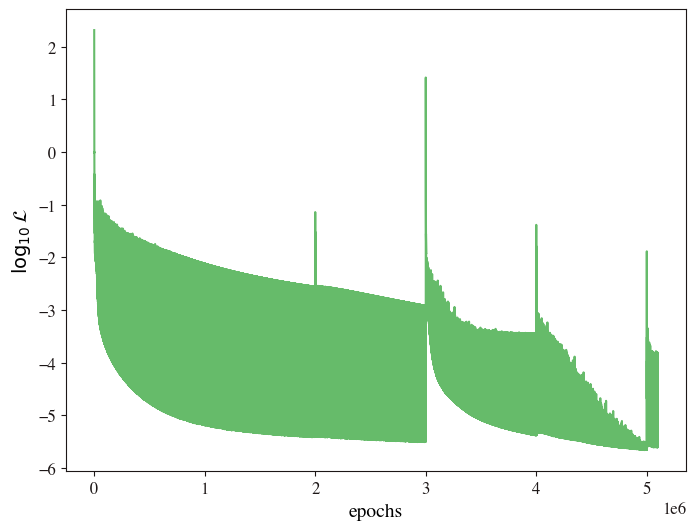

Min loss:  2.1826446151415547e-06
epochs= 5100000


In [25]:
tl.plot_loss(save_fig=False)
print('epochs=', tl.solver.global_epoch)

max phi_h=  1.7239098231685321


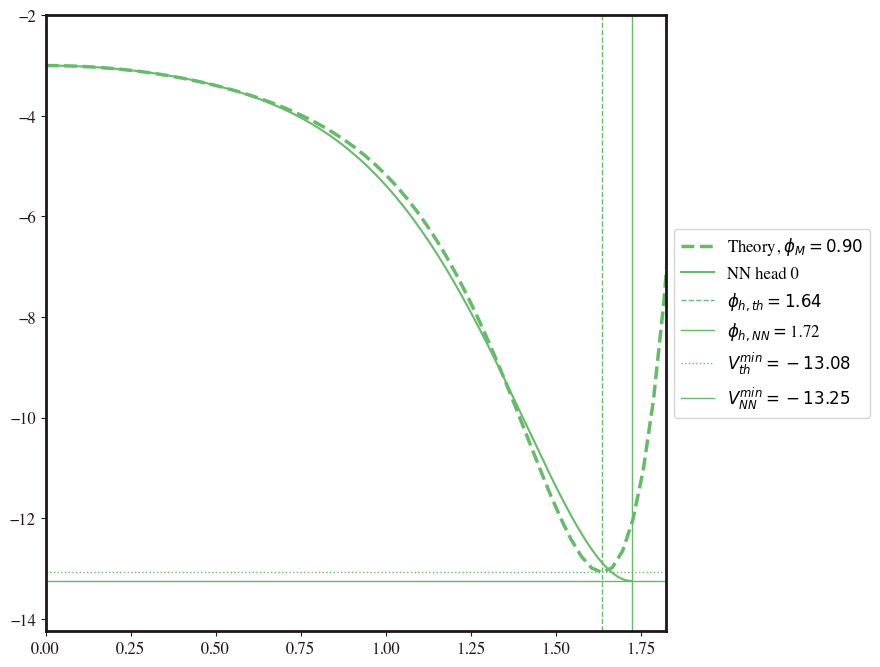

In [26]:
tl.plot_potential(phim=[0.9], sampling_pts=1000, save_fig=True)

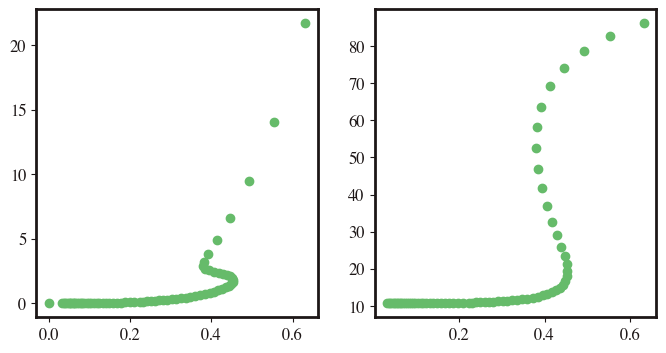

In [8]:
fig, ax=plt.subplots(1,2, figsize=(8,4))
ax[0].scatter(tl.solver.T_true, tl.solver.S_true)
ax[1].scatter(tl.solver.T_true, tl.solver.S_true/(tl.solver.T_true**3))

### Check samplings

Init pt curve S(T) ? 15


Len S(T): 25


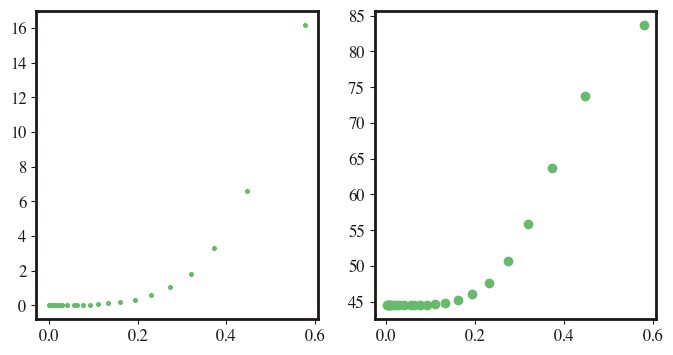

In [429]:
#sofT_TL_test = 'SofTphiM0_65_more_pts_2.txt'
sofT_TL_test = 'SofTphiM5_0.txt'
#sofT_transfer_test = f"/Users/pablo/Desktop/NNholo/To run/January (2024)/Moving forward/Abemus saving for real/New life/ATL David/Data/Potentials_phim/{sofT_TL_test}"

sofT_transfer_test = '/Users/pablo/Desktop/NNholo/MH_flattening_paper_3_to_1/Data/Potentials_phim/SofTphiM5_0.txt'

df_data = pd.read_csv(sofT_transfer_test, sep=" ", header=None).values

init_pt_curve = int(input('Init pt curve S(T) ?'))   #int(input('Init UV point S(T) ? (usually 0)'))
# S_true_1= torch.tensor(df_data[init_pt_curve:90:1,1])
# T_true_1= torch.tensor(df_data[init_pt_curve:90:1,0])
# #phi_h_true_1=torch.tensor(phih_true[50:100:10])

# #S_true_2= torch.tensor(df_data[71:100:5,1])
# #T_true_2= torch.tensor(df_data[71:100:5,0])

# S_true_3= torch.tensor(df_data[91:165:3,1])
# T_true_3= torch.tensor(df_data[91:165:3,0])
# #phi_h_true_2=torch.tensor(phih_true[101:200:5])

# S_true_4= torch.tensor(df_data[166:-1:5,1])
# T_true_4= torch.tensor(df_data[166:-1:5,0])

S_true_1= torch.tensor(df_data[init_pt_curve:90:6,1])
T_true_1= torch.tensor(df_data[init_pt_curve:90:6,0])
#phi_h_true_1=torch.tensor(phih_true[50:100:10])

#S_true_2= torch.tensor(df_data[71:100:5,1])
#T_true_2= torch.tensor(df_data[71:100:5,0])

S_true_3= torch.tensor(df_data[91:165:10,1])
T_true_3= torch.tensor(df_data[91:165:10,0])
#phi_h_true_2=torch.tensor(phih_true[101:200:5])

S_true_4= torch.tensor(df_data[166:-1:10,1])
T_true_4= torch.tensor(df_data[166:-1:10,0])

S_true_lowest = torch.tensor([0])
T_true_lowest = torch.tensor([0])

S_true=torch.cat([S_true_1, S_true_3, S_true_4, S_true_lowest],dim=0)
T_true=torch.cat([T_true_1, T_true_3, T_true_4, T_true_lowest],dim=0)

fig, ax=plt.subplots(1,2, figsize=(8,4))
#ax[0].scatter(d.solver.T_true, d.solver.S_true)
ax[0].scatter(T_true, S_true, s=7)
ax[1].scatter(T_true, S_true/(T_true**3))
print('Len S(T):',len(T_true))

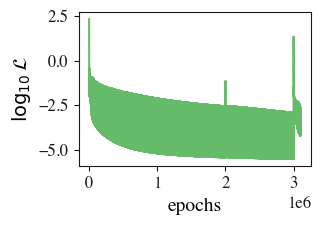

Min loss:  3.094934768722988e-06


In [57]:
tl.plot_loss(save_fig=False, figsize=(3,2))


### Train

In [9]:
store_mse = Store_MSE_Loss()

scheduler = torch.optim.lr_scheduler.StepLR(tl.adam, step_size=5000, gamma=0.985)
scheduler_cb = DoSchedulerStep(scheduler=scheduler)

potential_cb = BestValidationCallback()

In [10]:
var_name = ['Vs', 'Va', 'Vp','Sigma', 'A', 'phi']
pre_list=[]
pre_body_list=[]
for i in range(6):
    pre = copy.deepcopy(tl.solver.nets[i,0].head_model.NN[2].weight.detach().numpy())
    pre_body= copy.deepcopy(tl.solver.nets[i,0].H_model.NN[2].weight.detach().numpy())
    pre_list.append(pre)
    pre_body_list.append(pre_body)
    
V_pre = copy.deepcopy(tl.solver.V_net[0].head_model.NN[2].weight.detach().numpy())
V_body_pre = copy.deepcopy(tl.solver.V_net[0].H_model.layers[2].weight.detach().numpy())

In [11]:
tl.solver.global_epoch

4650000

In [13]:
(5e6-tl.solver.global_epoch)/50000

7.0

In [14]:
retrained=0

In [15]:
tl.update_optimizer()

Actual learning rate:  6.9265956165628806e-06


Epochs:   0%|                                  | 0/50000 [00:00<?, ?iteration/s]

Model succesfully saved
Min loss TL 2.5603734572159687e-06


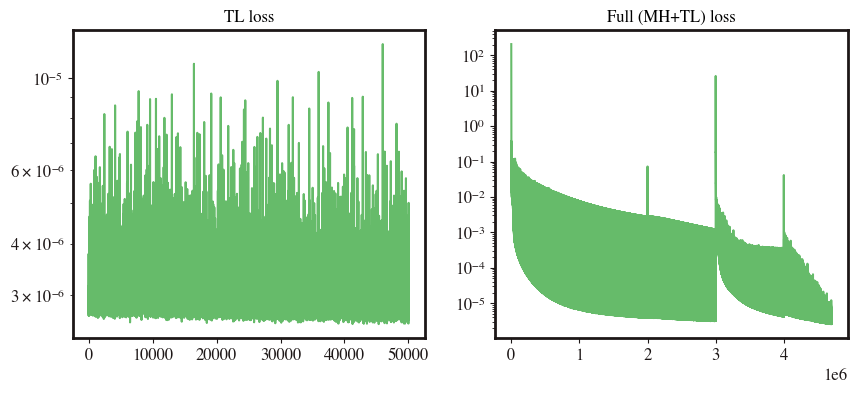

max phi_h=  1.7315944343319793


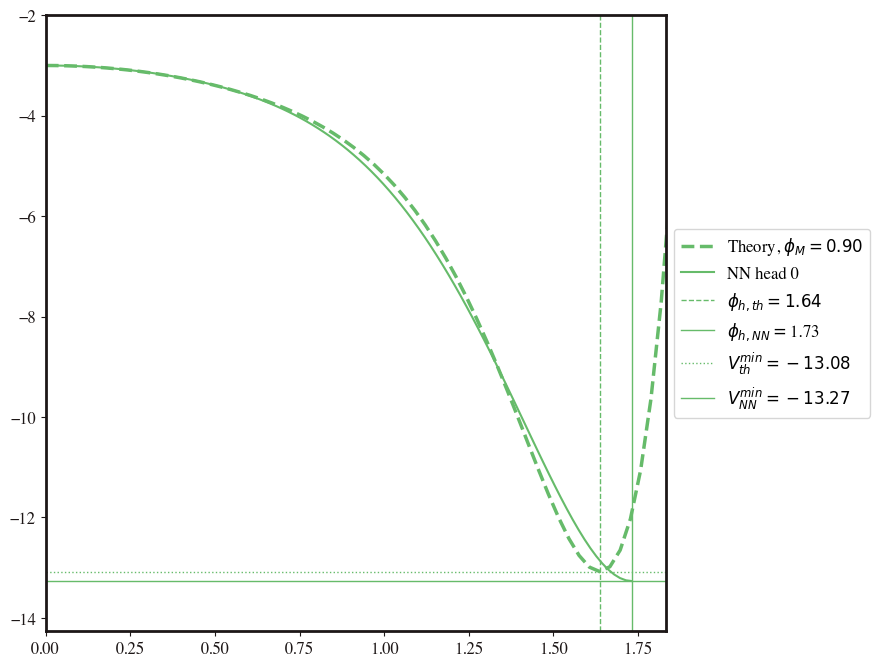

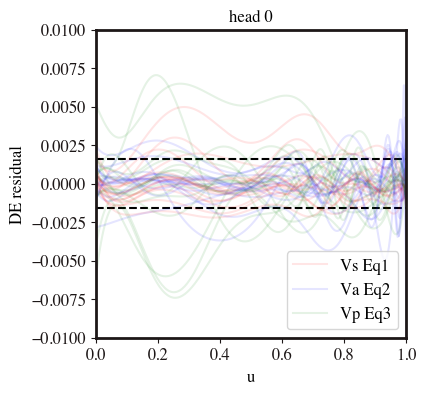

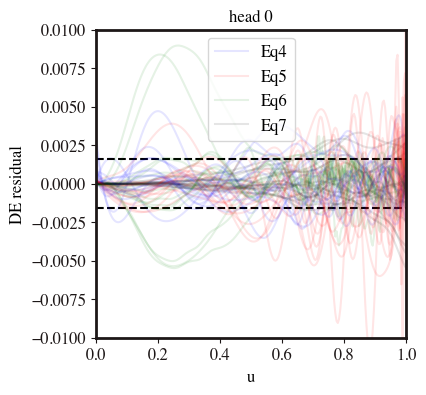

Epochs:   0%|                                  | 0/50000 [00:00<?, ?iteration/s]

Model succesfully saved
Min loss TL 2.4630008289479383e-06


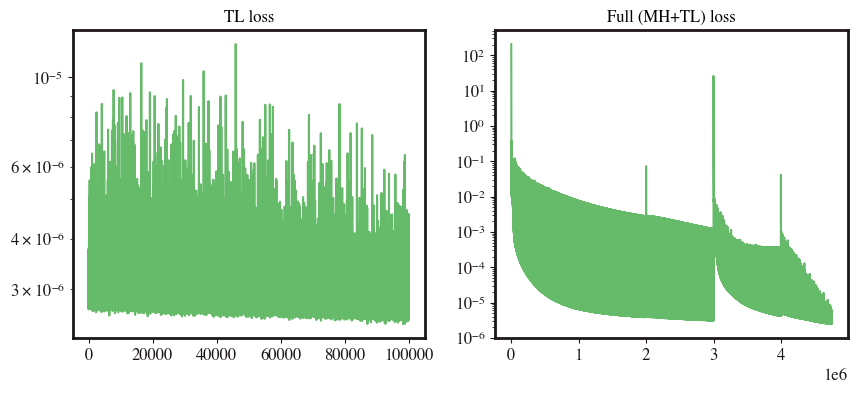

max phi_h=  1.7301894388374537


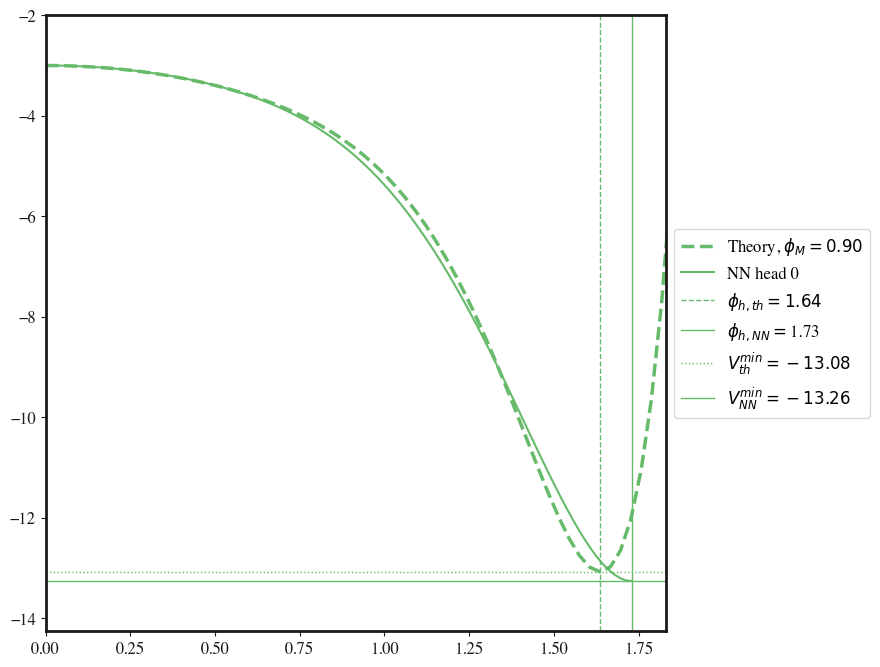

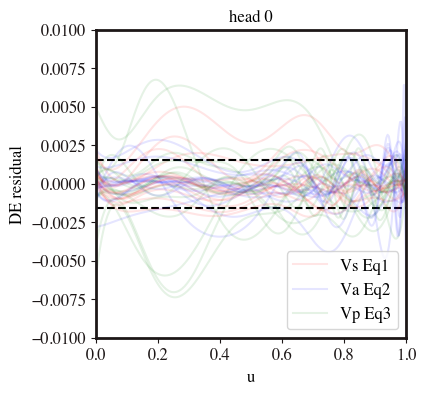

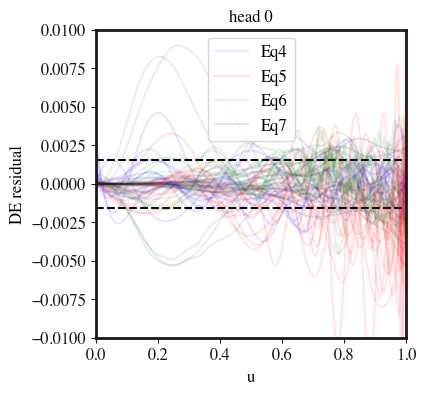

Epochs:   0%|                                  | 0/50000 [00:00<?, ?iteration/s]

Model succesfully saved
Min loss TL 2.387217737564737e-06


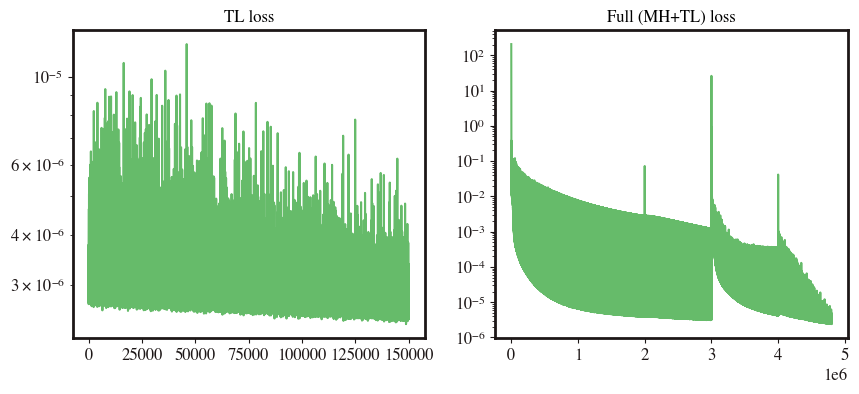

max phi_h=  1.7287956350732174


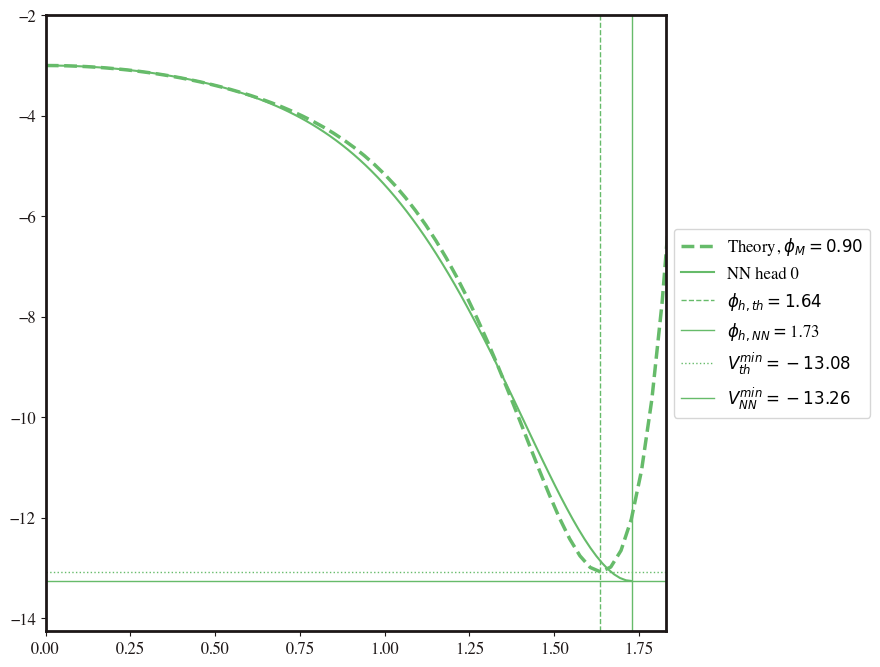

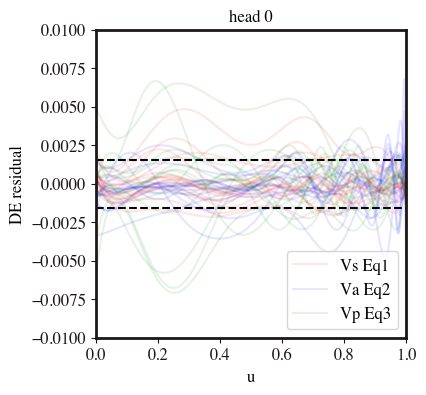

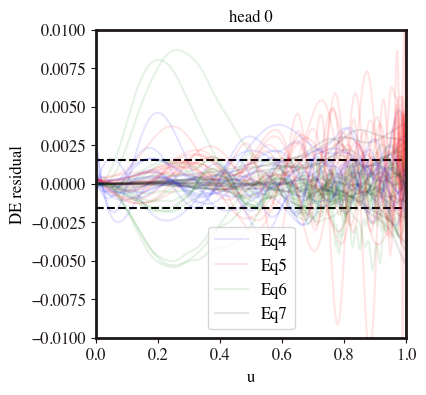

Epochs:   0%|                                  | 0/50000 [00:00<?, ?iteration/s]

Model succesfully saved
Min loss TL 2.3354427015801743e-06


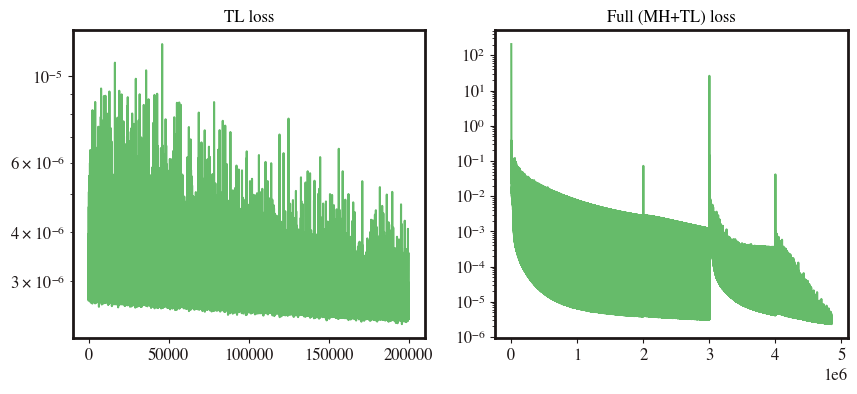

max phi_h=  1.7276394366549879


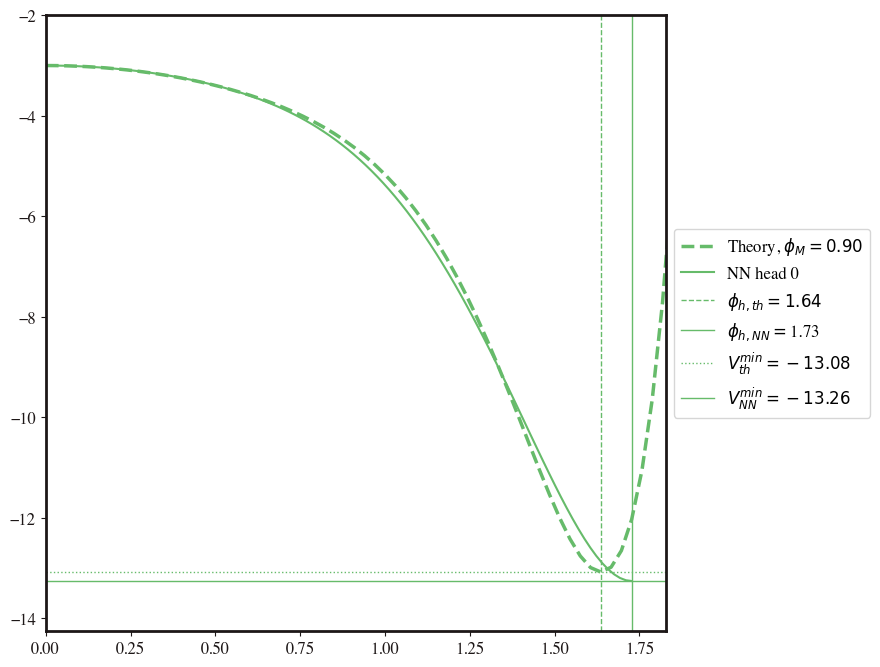

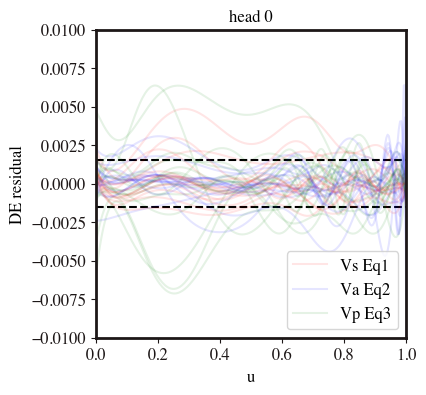

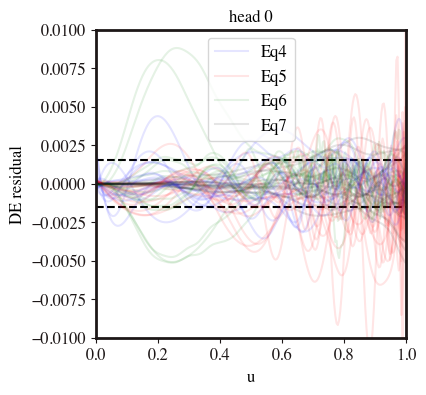

Epochs:   0%|                                  | 0/50000 [00:00<?, ?iteration/s]

Model succesfully saved
Min loss TL 2.282615381631548e-06


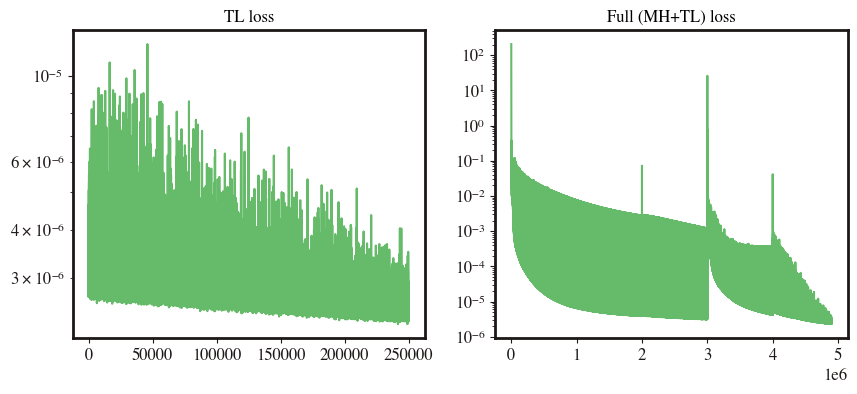

max phi_h=  1.7265774294659213


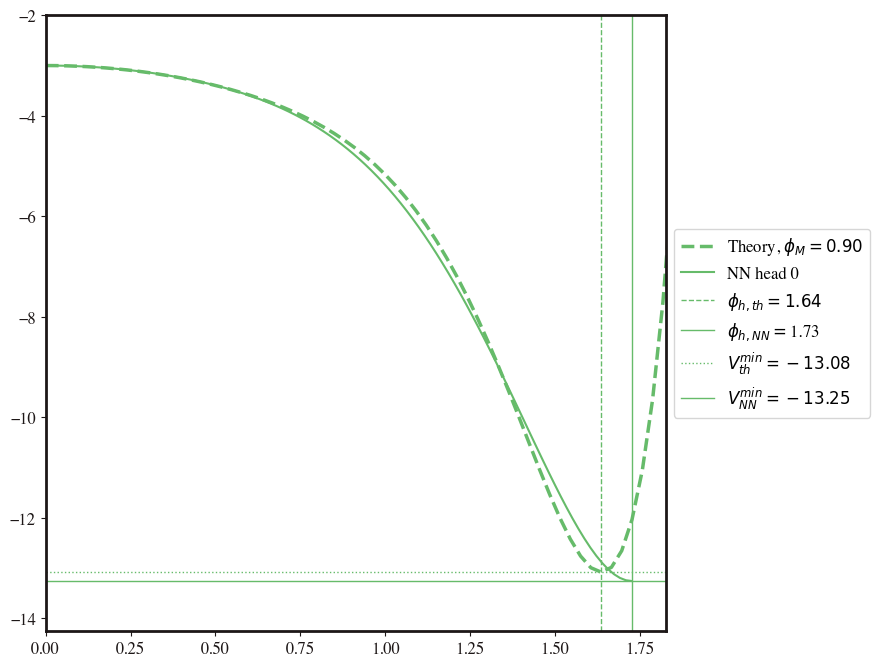

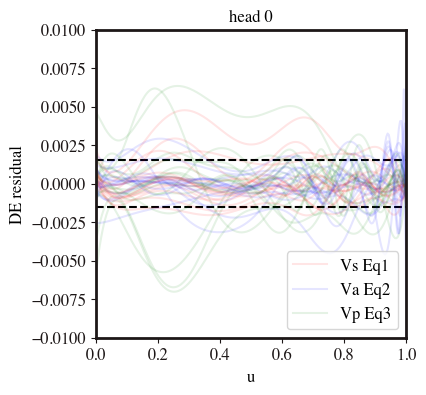

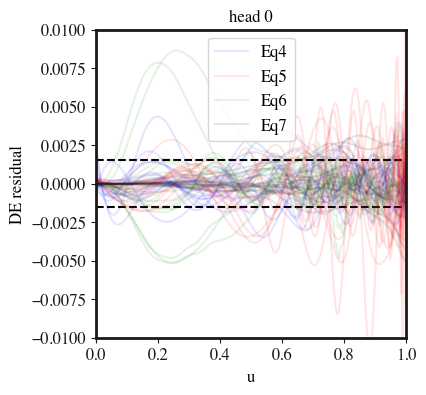

Epochs:   0%|                                  | 0/50000 [00:00<?, ?iteration/s]

Model succesfully saved
Min loss TL 2.2577974043787996e-06


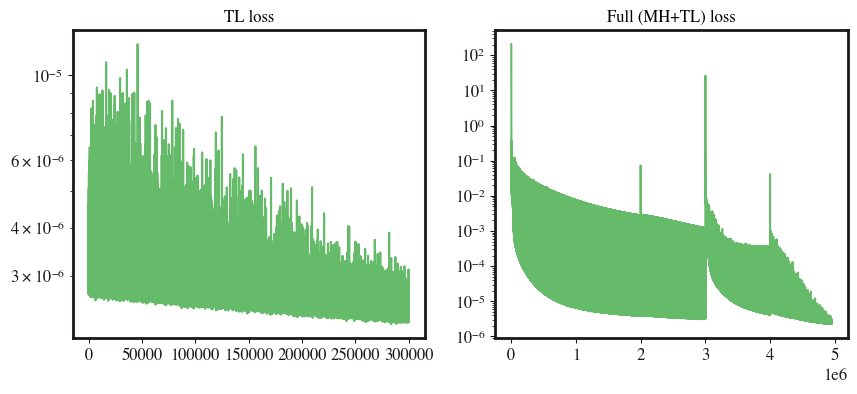

max phi_h=  1.7255785487003252


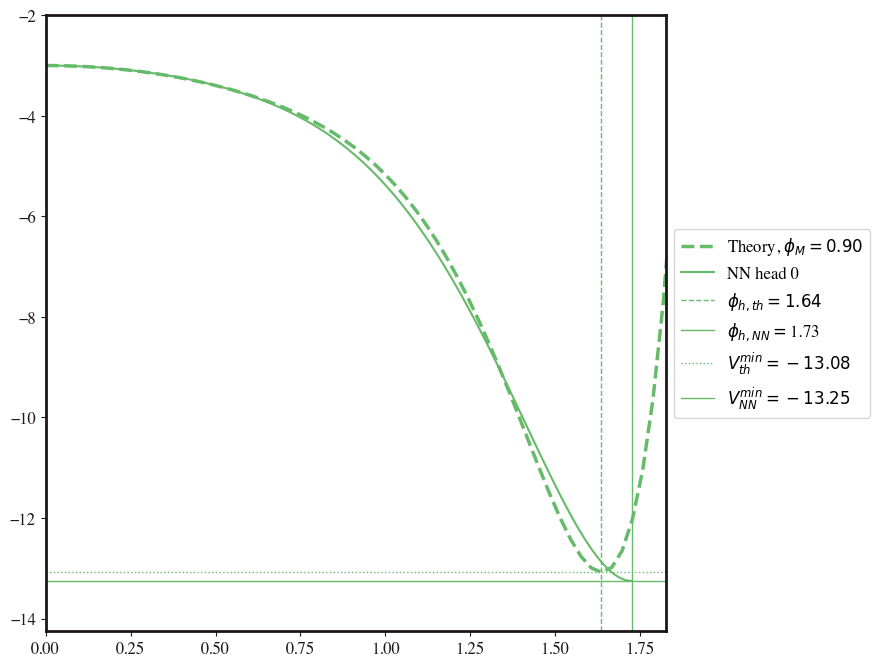

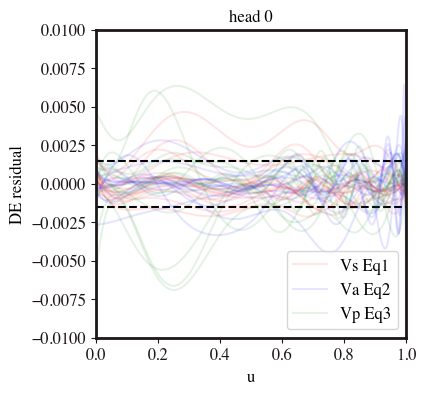

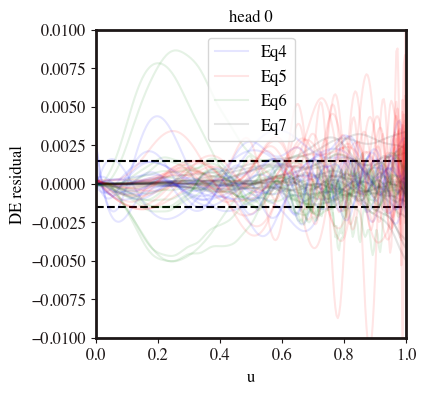

Epochs:   0%|                                  | 0/50000 [00:00<?, ?iteration/s]

Model succesfully saved
Min loss TL 2.1961965827634773e-06


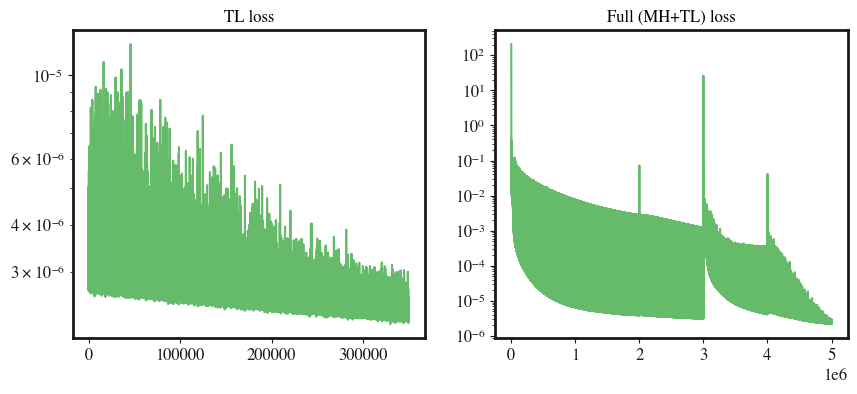

max phi_h=  1.7246952936633912


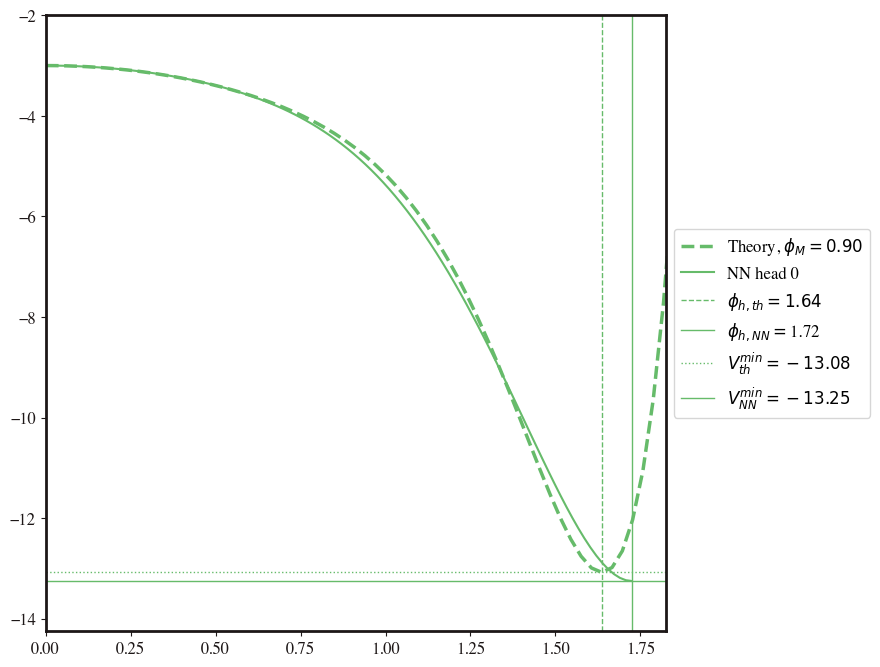

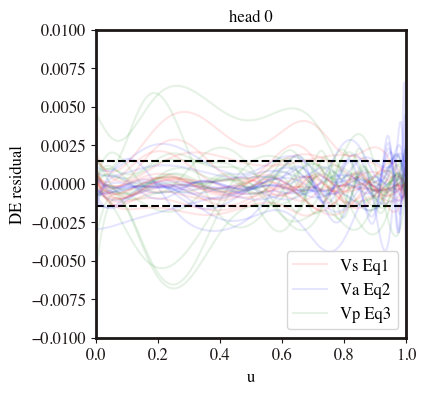

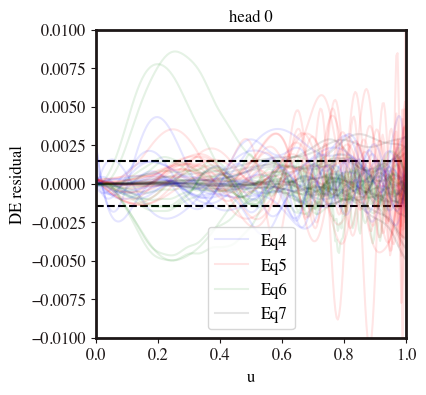

In [16]:
epochs = 50_000
for _ in range(7):
    tl.solver.fit(max_epochs=epochs, 
                     callbacks=[potential_cb, scheduler_cb],
                     tqdm_file=tqdm(total=epochs, dynamic_ncols=True, desc='Epochs', unit='iteration', colour='#0afa9e'))
    retrained+=epochs
    tl.MH_save_results(f'{path_results_TL}/TL_0_9_unfrozen')
    
    fig,ax=plt.subplots(1,2, figsize=(10,4))
    l_min = min(tl.solver.metrics_history['train_loss'][-retrained-50:])
    ax[0].plot(tl.solver.metrics_history['train_loss'][-retrained-50:])
    ax[0].set_yscale('log')
    ax[0].set_title('TL loss')
    ax[1].plot(tl.solver.metrics_history['train_loss'])
    ax[1].set_yscale('log')
    ax[1].set_title('Full (MH+TL) loss')
    print('Min loss TL', min(tl.solver.metrics_history['train_loss'][-10000:]))
    fig.savefig(f'{path_results_TL}/loss_epoch_{tl.solver.global_epoch}.pdf')
    plt.show()

    tl.plot_potential(phim=[0.9], save_fig=True)
    tl.plot_residuals_in_u(max_bound=1e-2, save_fig=True)
    

In [33]:
epochs = 1000
tl.solver.fit(max_epochs=epochs, 
                     callbacks=[potential_cb, scheduler_cb],
                     tqdm_file=tqdm(total=epochs, dynamic_ncols=True, desc='Epochs', unit='iteration', colour='#0afa9e'))
retrained+=epochs

Epochs:   0%|                                   | 0/1000 [00:00<?, ?iteration/s]

In [16]:
tl.MH_save_results(f'{path_results_TL}/TL_0_9_unfrozen')

Model succesfully saved


In [17]:
retrained

350000

Min loss TL 2.4531673263221266e-06


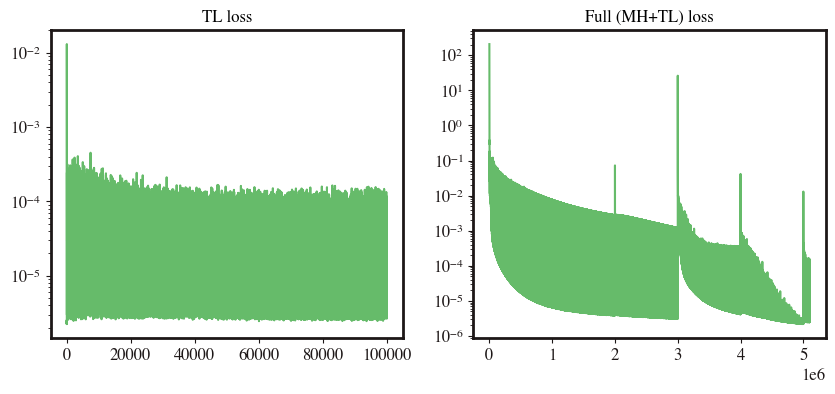

max phi_h=  1.7239098231685321


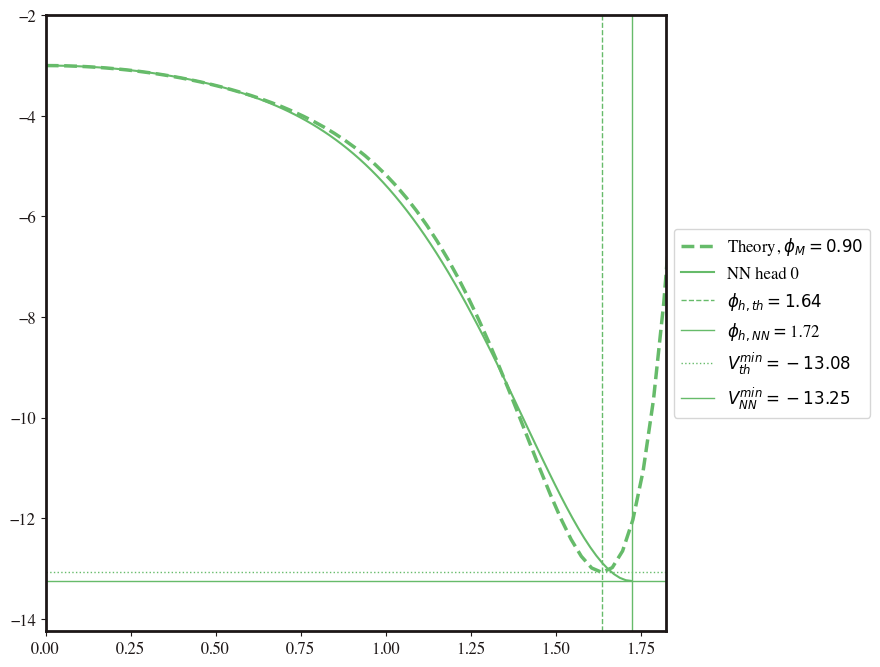

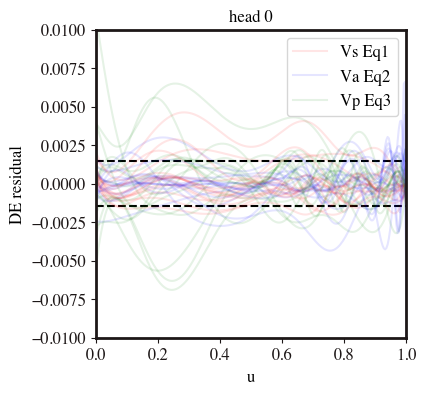

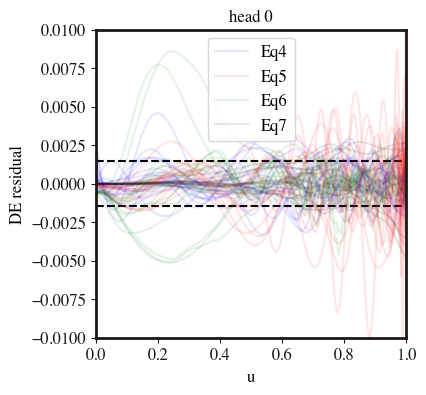

In [43]:
fig,ax=plt.subplots(1,2, figsize=(10,4))
l_min = min(tl.solver.metrics_history['train_loss'][-retrained-50:])
ax[0].plot(tl.solver.metrics_history['train_loss'][-retrained-50:])
ax[0].set_yscale('log')
ax[0].set_title('TL loss')
ax[1].plot(tl.solver.metrics_history['train_loss'])
ax[1].set_yscale('log')
ax[1].set_title('Full (MH+TL) loss')
print('Min loss TL', min(tl.solver.metrics_history['train_loss'][-10000:]))
#fig.savefig(f'{path_results_TL}/loss_epoch_{tl.solver.global_epoch}.pdf')
plt.show()

tl.plot_potential(phim=[0.9], save_fig=False)
tl.plot_residuals_in_u(max_bound=1e-2, save_fig=False)
#print(tl.solver.metrics_history['train_loss'][-101:])


In [ ]:
copy_loss = tl.solver.metrics_history['train_loss']
for i in range(tl.solver.global_epoch):
    if copy_loss[i]<0:
        copy_loss.remove(copy_loss[i])
        #print(i,'wtf')


4559522
4559522


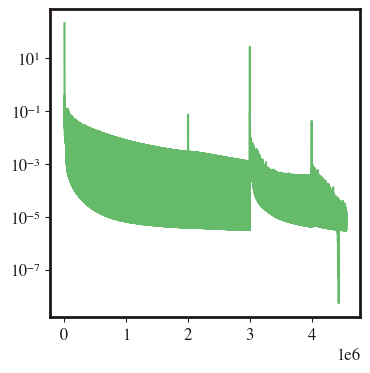

In [31]:
plt.plot(copy_loss)
print(len(copy_loss))
print(tl.solver.global_epoch)
plt.yscale('log')
#fig.savefig(f'{path_results_TL}/loss_epoch_{tl.solver.global_epoch}.pdf')
plt.show()


In [26]:
a=[1,2,3,4]
a.remove(a[2])
a

[1, 2, 4]

### Check if weights are frozen

Text(0.5, 1.0, 'V head')

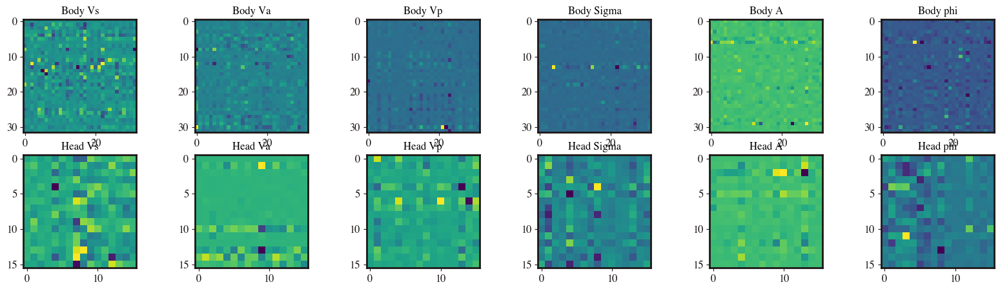

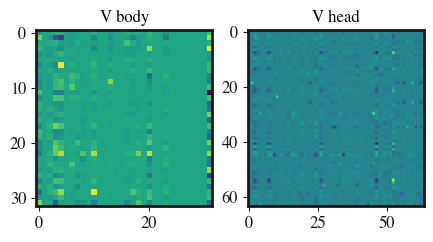

In [36]:
pos_list=[]
pos_body_list=[]
for i in range(6):
    pos = tl.solver.nets[i].head_model.NN[2].weight.detach().numpy()
    pos_body= tl.solver.nets[i].H_model.NN[2].weight.detach().numpy()
    pos_list.append(pos)
    pos_body_list.append(pos_body)

V_pos = tl.solver.V_net[0].head_model.NN[2].weight.detach().numpy()
V_body_pos = tl.solver.V_net[0].H_model.layers[2].weight.detach().numpy()

fig,ax=plt.subplots(2,6, figsize=(20,5))
for i in range(6):
    ax[1,i].imshow(pre_list[i]-pos_list[i])
    ax[1,i].set_title(f'Head {var_name[i]}')
    ax[0,i].imshow(pre_body_list[i]-pos_body_list[i])
    ax[0,i].set_title(f'Body {var_name[i]}')

fig2, ax = plt.subplots(1,2, figsize=(5,5))
im = ax[0].imshow(V_body_pre-V_body_pos)
ax[0].set_title('V body')
ax[1].imshow(V_pre-V_pos)
ax[1].set_title('V head')
#plt.colorbar(im, ax=ax[0])
#V_pre-V_pos
#pre_list[0]-pos_list[0]

## Forcing values of $V(\phi)$ at $\phi=0$

### Load piece with already TL epochs

In [2]:
sofT_TL = 'SofTphiM0_9.txt'
sofT_transfer = f"/Users/pablo/Desktop/NNholo/MH_flattening_paper_3_to_1/Data/Potentials_phim/{sofT_TL}"


In [3]:
# Directory 
directory = "TL_to_0_9_from_3e6_real_deal_1"
# Parent Directory path 
parent_dir = "/Users/pablo/Desktop/NNholo/MH_flattening_paper_3_to_1/flat_5_heads/results_2/"
#PaTH
path_results_TL = os.path.join(parent_dir, directory) 

In [21]:
#os.mkdir(path_results_TL) 
print("Directory '% s' created" % directory) 

Directory 'TL_to_0_9_from_3e6_real_deal_1' created


In [6]:
load_path = f'{path_results_TL}/TL_0_9_unfrozen_addloss_V_epochs_5100000'


In [7]:
tl = NNholo_multihead_heist(transfer_sofT_path=sofT_transfer, phim_list=[0.9], \
                            saving_path = path_results_TL, load_path = load_path, \
                            u_pts = 64, transfer_lr=1e-5)  
                            
                            # new_sampling=True, \
                            # freeze_V_body=True, freeze_V_head=False, pretrained_V_head=False, \
                            # freeze_solver_body=[0,1,2,3,4,5], freeze_solver_head=[], pretrained_solver_head=[], )

Loading dictionary...
Dictionary loaded correctly
[32, 32, 32, 32, 128] [16, 16]


Load pretrained head(s)? No[0] ;  Yes[1] 1
Unfreeze bodies? No[0] ;  Yes[1] 1
Load prev optim? No[0] ;  Yes[1] 1


Equations dictionary generated


Force V(0), dV(0),ddV(0) ? No[0], Yes[1] 1


length of s(T) curves: [72]
head 0
Inside solver __init()__: <bound method NNholo_multihead_heist.generate_equations.<locals>.make_equations.<locals>.equations of <NNholo_multihead_paper_unfreezing_addloss_V.NNholo_multihead_heist object at 0x2f5e92fe0>>
head 0
Inside solver __init()__: <bound method NNholo_multihead_heist.generate_equations.<locals>.make_equations.<locals>.equations of <NNholo_multihead_paper_unfreezing_addloss_V.NNholo_multihead_heist object at 0x2f5e92fe0>>
Ready to transfer learn


In [6]:
tl.update_optimizer()

Actual learning rate:  2.4046726758392044e-06


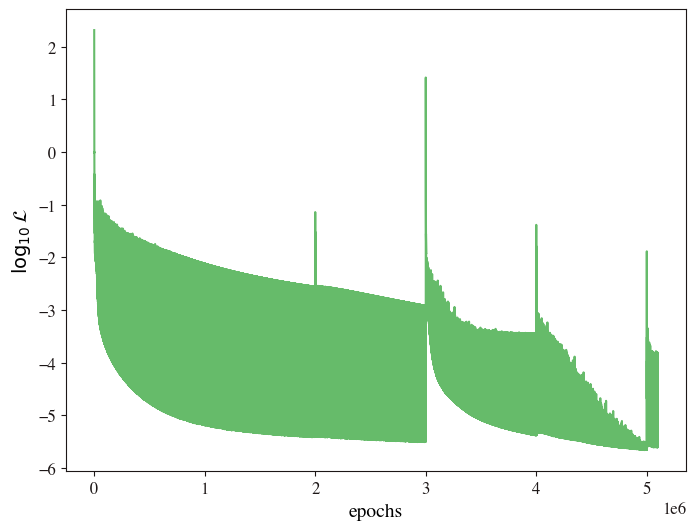

Min loss:  2.1826446151415547e-06


In [8]:
tl.plot_loss(save_fig=False)

max phi_h=  1.7239098231685321


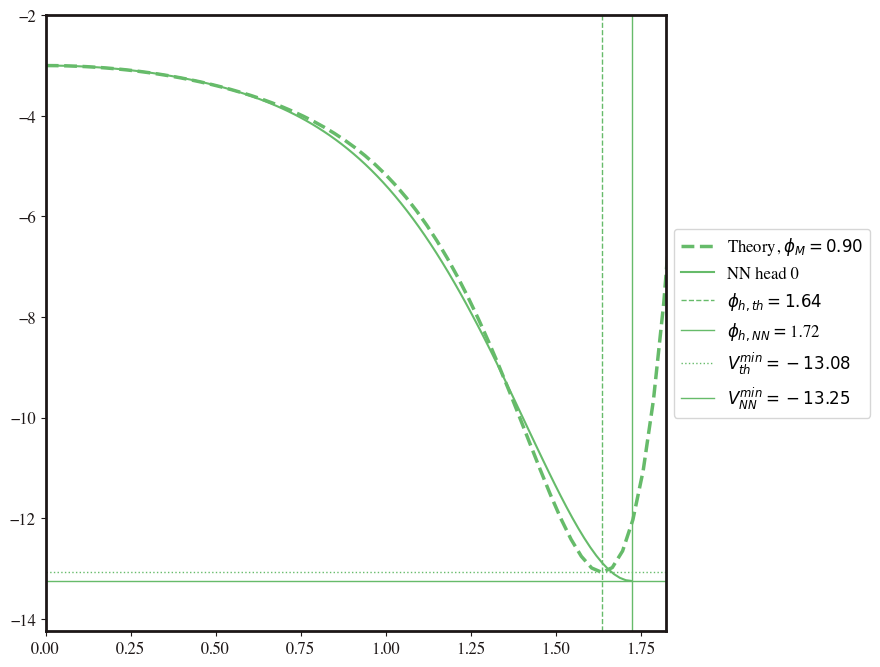

In [16]:
tl.plot_potential(phim=[0.9], sampling_pts=100, save_fig=False)

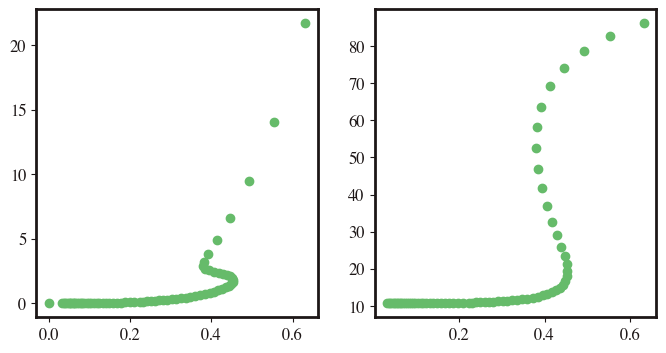

In [8]:
fig, ax=plt.subplots(1,2, figsize=(8,4))
ax[0].scatter(tl.solver.T_true, tl.solver.S_true)
ax[1].scatter(tl.solver.T_true, tl.solver.S_true/(tl.solver.T_true**3))

### Check samplings

Init pt curve S(T) ? 29


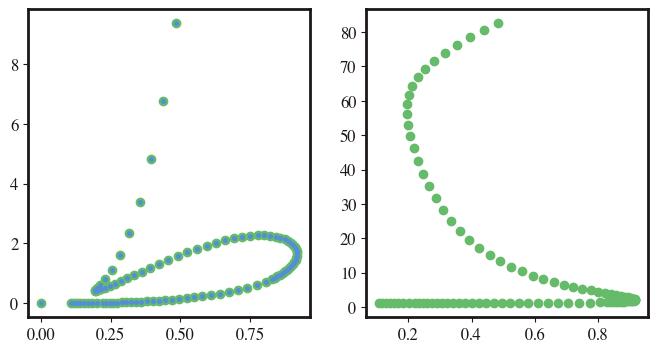

In [70]:
sofT_TL_test = 'SofTphiM0_65_more_pts_2.txt'
sofT_transfer_test = f"/Users/pablo/Desktop/NNholo/To run/January (2024)/Moving forward/Abemus saving for real/New life/ATL David/Data/Potentials_phim/{sofT_TL_test}"


df_data = pd.read_csv(sofT_transfer_test, sep=" ", header=None).values

init_pt_curve = int(input('Init pt curve S(T) ?'))   #int(input('Init UV point S(T) ? (usually 0)'))
S_true_1= torch.tensor(df_data[init_pt_curve:90:1,1])
T_true_1= torch.tensor(df_data[init_pt_curve:90:1,0])
#phi_h_true_1=torch.tensor(phih_true[50:100:10])

#S_true_2= torch.tensor(df_data[71:100:5,1])
#T_true_2= torch.tensor(df_data[71:100:5,0])

S_true_3= torch.tensor(df_data[91:165:3,1])
T_true_3= torch.tensor(df_data[91:165:3,0])
#phi_h_true_2=torch.tensor(phih_true[101:200:5])

S_true_4= torch.tensor(df_data[166:-1:5,1])
T_true_4= torch.tensor(df_data[166:-1:5,0])

S_true_lowest = torch.tensor([0])
T_true_lowest = torch.tensor([0])

S_true=torch.cat([S_true_1, S_true_3, S_true_4, S_true_lowest],dim=0)
T_true=torch.cat([T_true_1, T_true_3, T_true_4, T_true_lowest],dim=0)

fig, ax=plt.subplots(1,2, figsize=(8,4))
ax[0].scatter(tl.solver.T_true, tl.solver.S_true)
ax[0].scatter(T_true, S_true, s=7)
ax[1].scatter(T_true, S_true/(T_true**3))

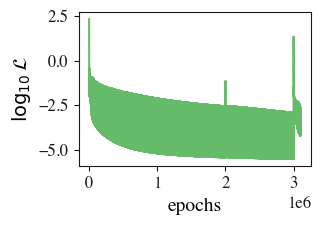

Min loss:  3.094934768722988e-06


In [57]:
tl.plot_loss(save_fig=False, figsize=(3,2))


## Train

In [8]:
store_mse = Store_MSE_Loss()

scheduler = torch.optim.lr_scheduler.StepLR(tl.adam, step_size=5000, gamma=0.985)
scheduler_cb = DoSchedulerStep(scheduler=scheduler)

potential_cb = BestValidationCallback()

In [9]:
var_name = ['Vs', 'Va', 'Vp','Sigma', 'A', 'phi']
pre_list=[]
pre_body_list=[]
for i in range(6):
    pre = copy.deepcopy(tl.solver.nets[i,0].head_model.NN[2].weight.detach().numpy())
    pre_body= copy.deepcopy(tl.solver.nets[i,0].H_model.NN[2].weight.detach().numpy())
    pre_list.append(pre)
    pre_body_list.append(pre_body)
    
V_pre = copy.deepcopy(tl.solver.V_net[0].head_model.NN[2].weight.detach().numpy())
V_body_pre = copy.deepcopy(tl.solver.V_net[0].H_model.layers[2].weight.detach().numpy())

In [47]:
tl.solver.global_epoch

5100000

In [11]:
retrained=0

In [41]:
tl.update_optimizer()

Actual learning rate:  2.333073546916092e-06


Epochs:   0%|                                  | 0/50000 [00:00<?, ?iteration/s]

Model succesfully saved
Min loss TL 2.5603734572159687e-06


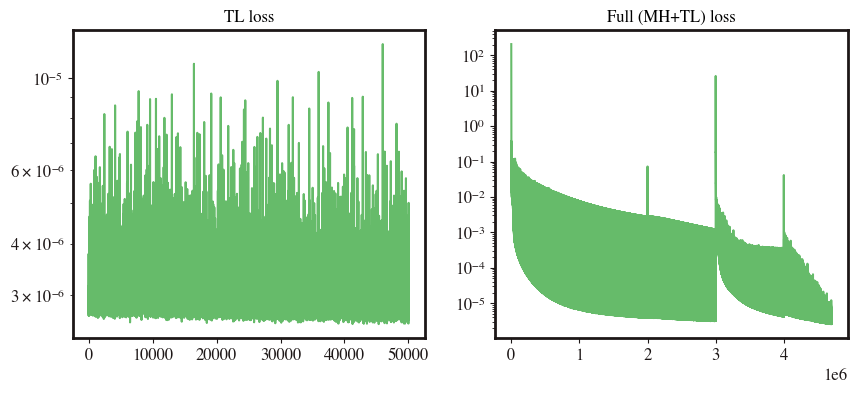

max phi_h=  1.7315944343319793


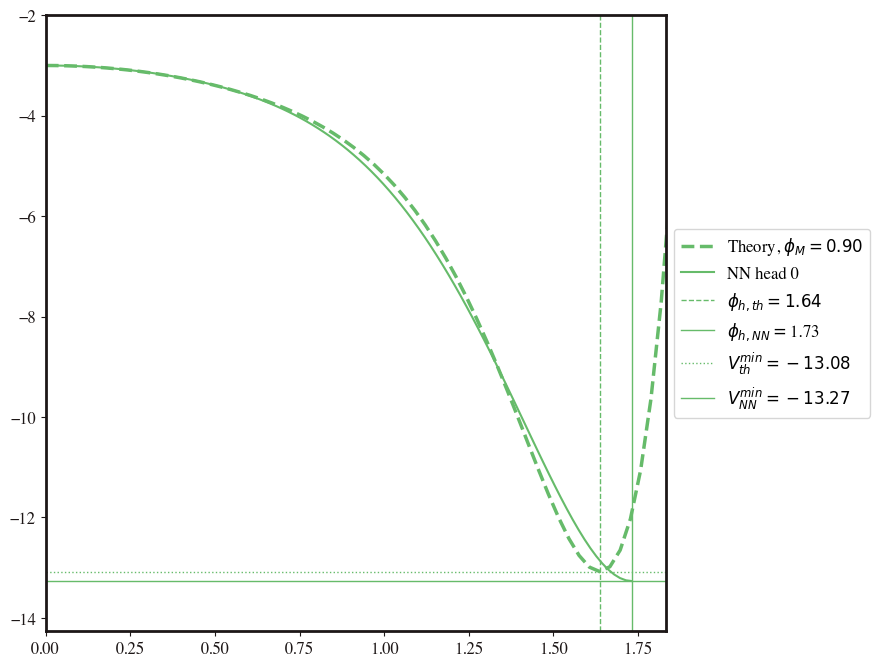

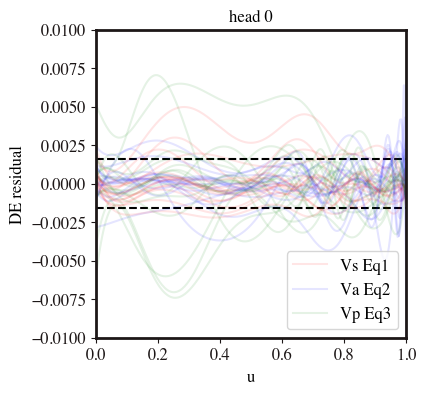

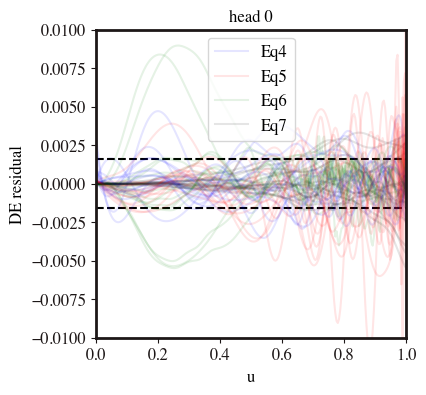

Epochs:   0%|                                  | 0/50000 [00:00<?, ?iteration/s]

Model succesfully saved
Min loss TL 2.4630008289479383e-06


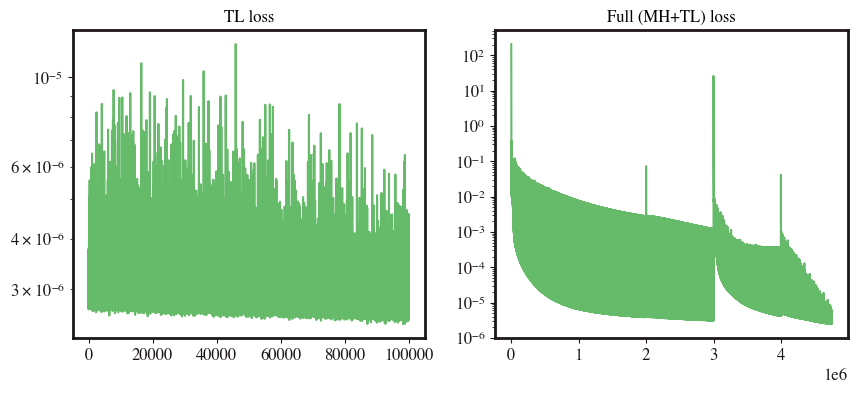

max phi_h=  1.7301894388374537


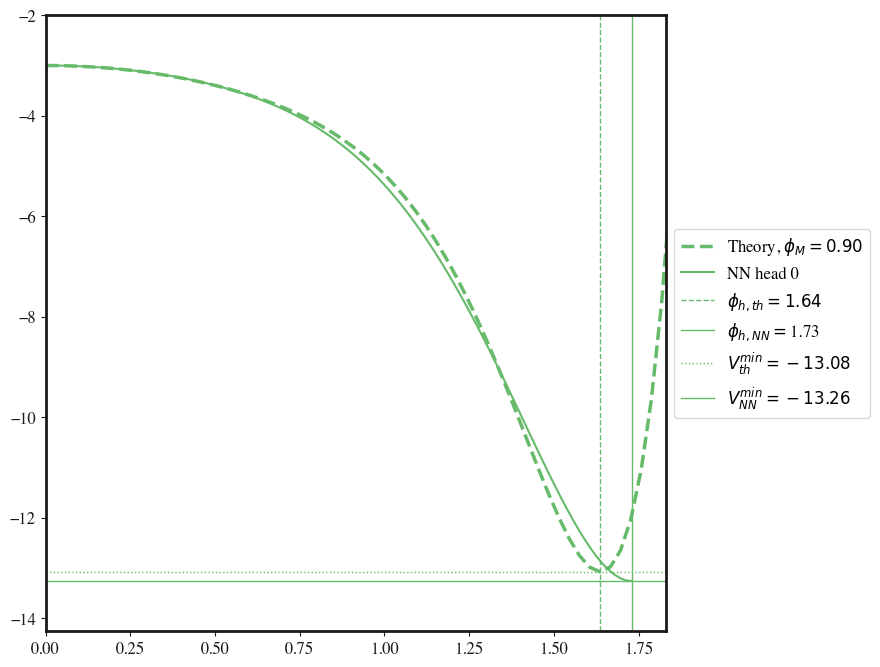

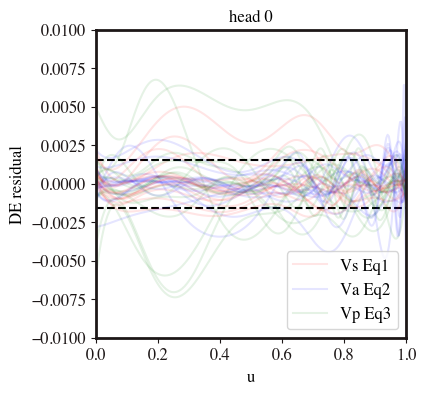

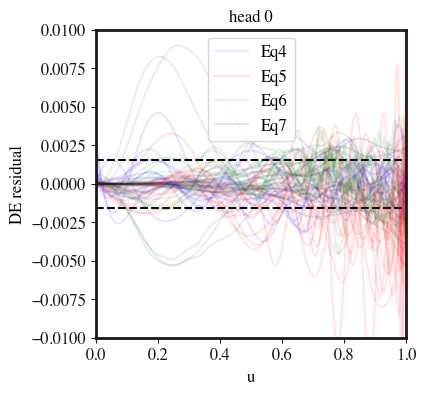

Epochs:   0%|                                  | 0/50000 [00:00<?, ?iteration/s]

Model succesfully saved
Min loss TL 2.387217737564737e-06


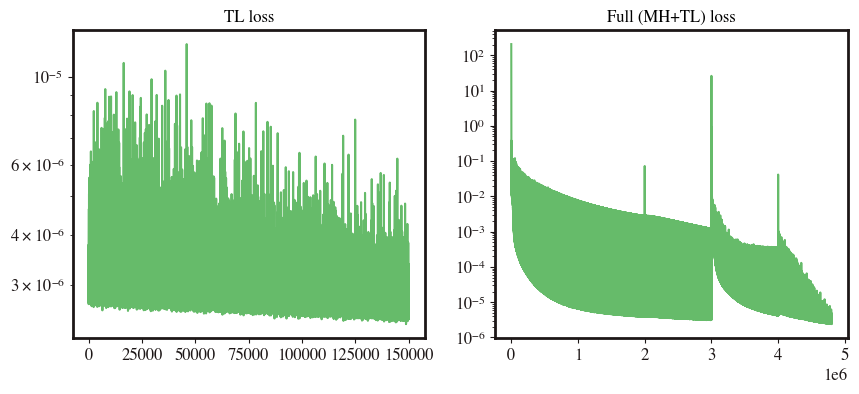

max phi_h=  1.7287956350732174


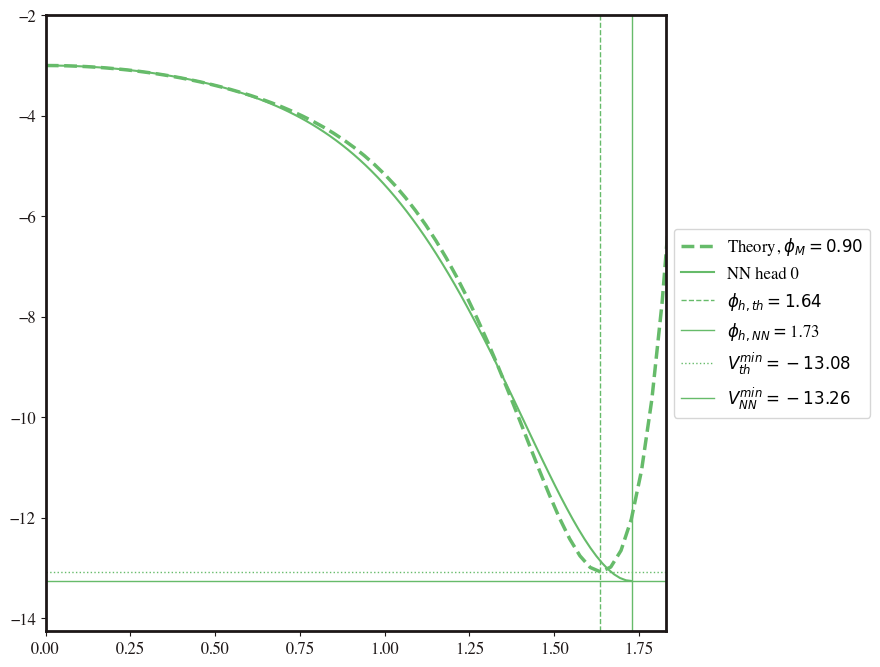

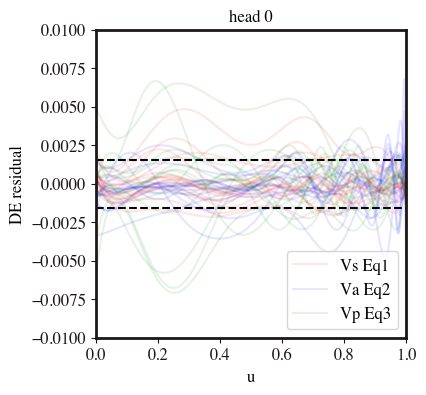

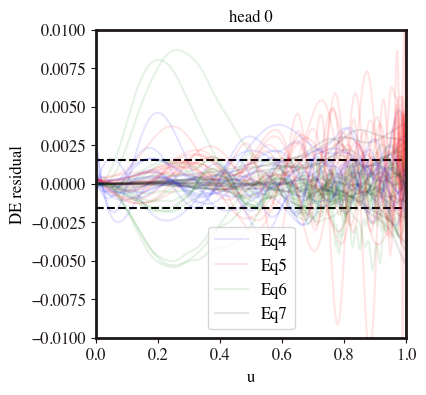

Epochs:   0%|                                  | 0/50000 [00:00<?, ?iteration/s]

Model succesfully saved
Min loss TL 2.3354427015801743e-06


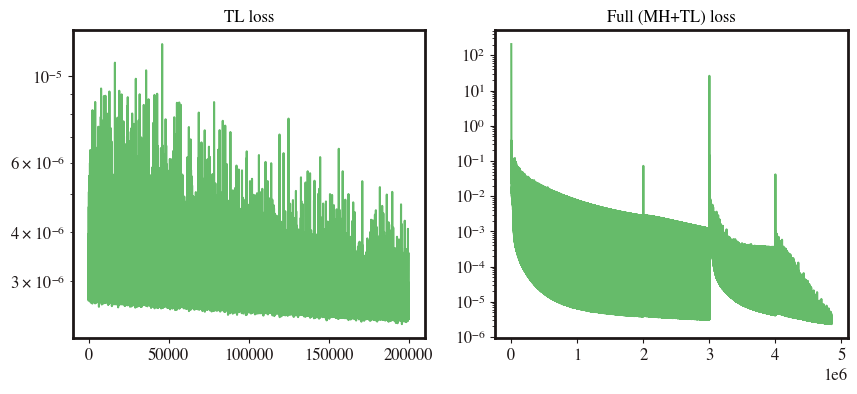

max phi_h=  1.7276394366549879


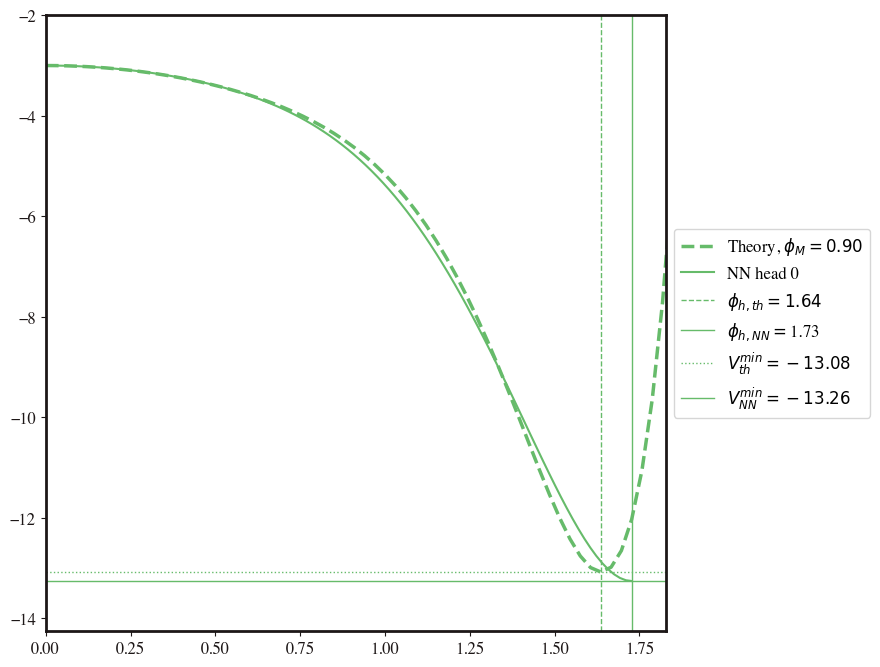

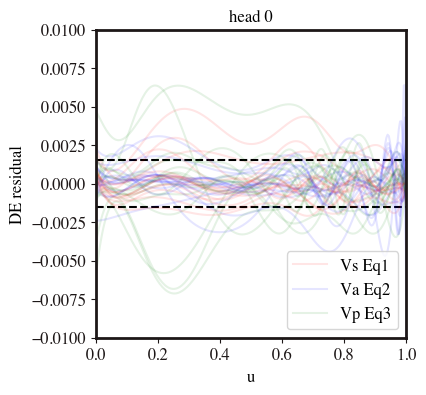

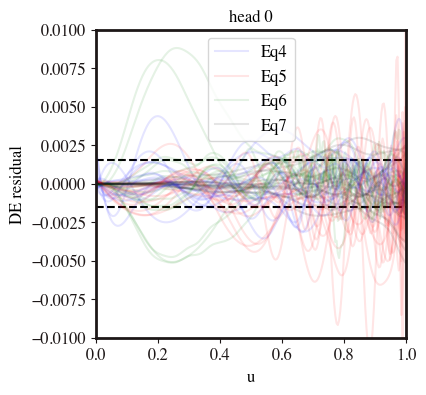

Epochs:   0%|                                  | 0/50000 [00:00<?, ?iteration/s]

Model succesfully saved
Min loss TL 2.282615381631548e-06


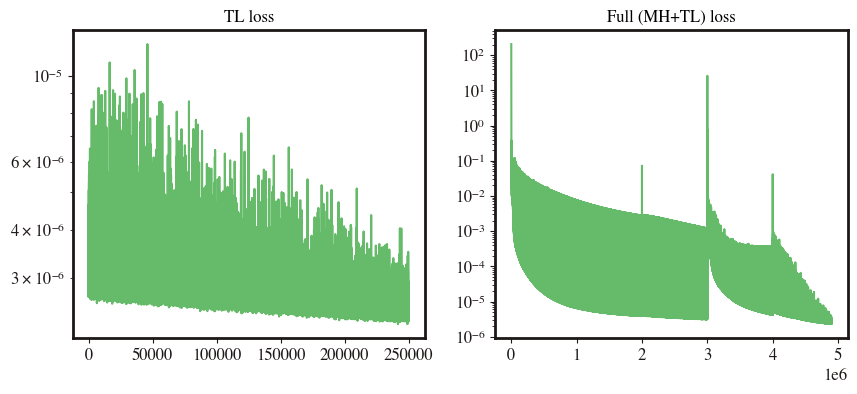

max phi_h=  1.7265774294659213


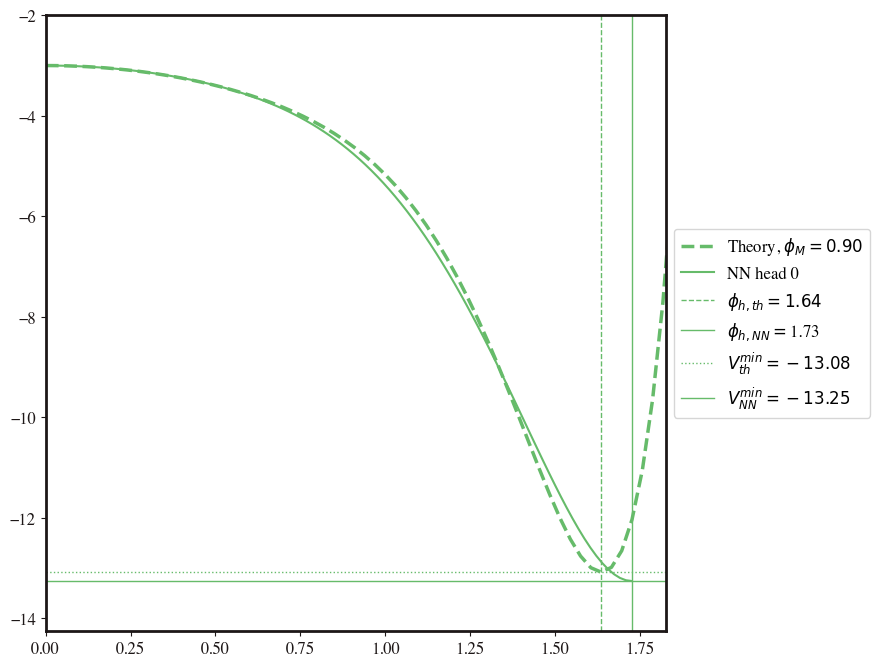

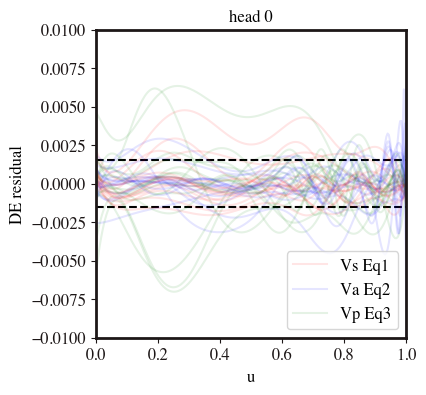

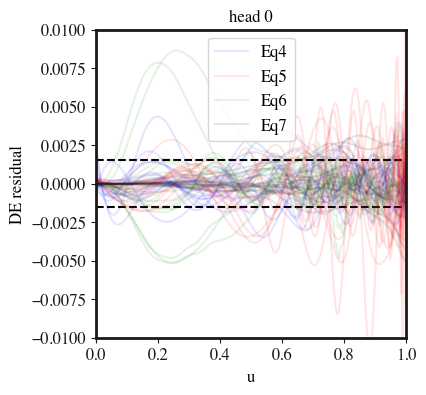

Epochs:   0%|                                  | 0/50000 [00:00<?, ?iteration/s]

Model succesfully saved
Min loss TL 2.2577974043787996e-06


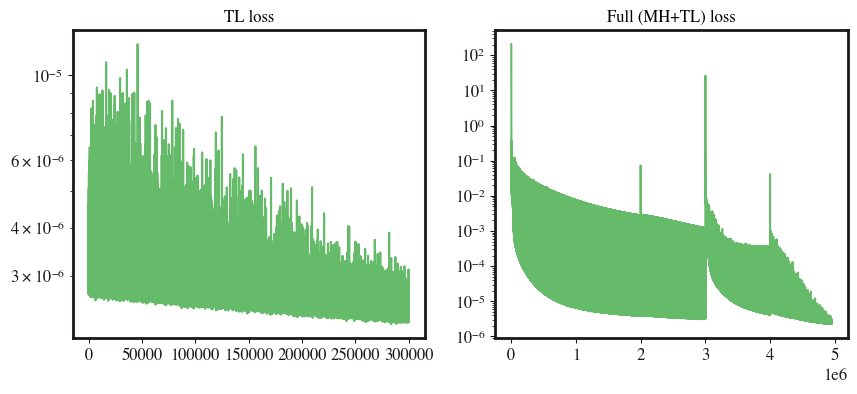

max phi_h=  1.7255785487003252


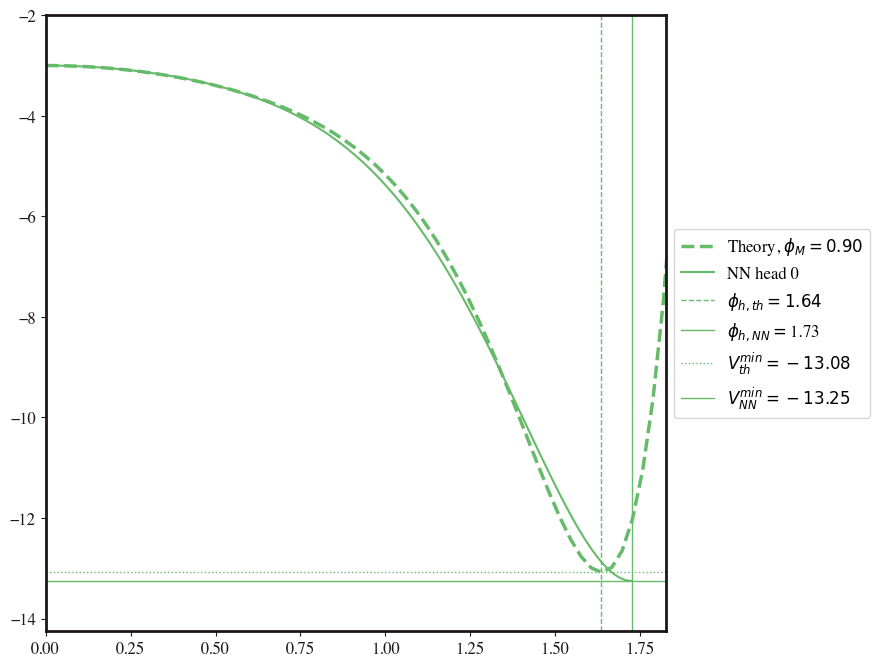

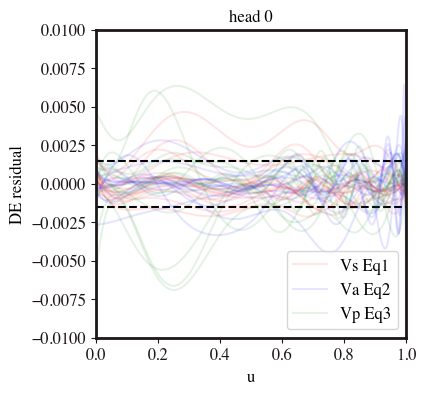

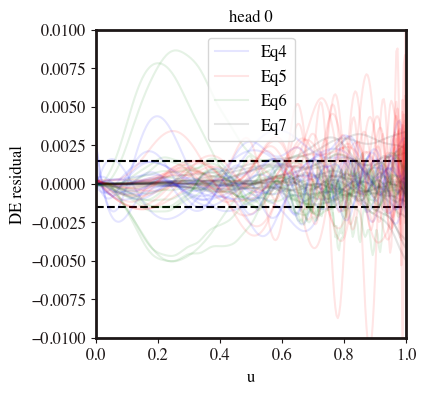

Epochs:   0%|                                  | 0/50000 [00:00<?, ?iteration/s]

Model succesfully saved
Min loss TL 2.1961965827634773e-06


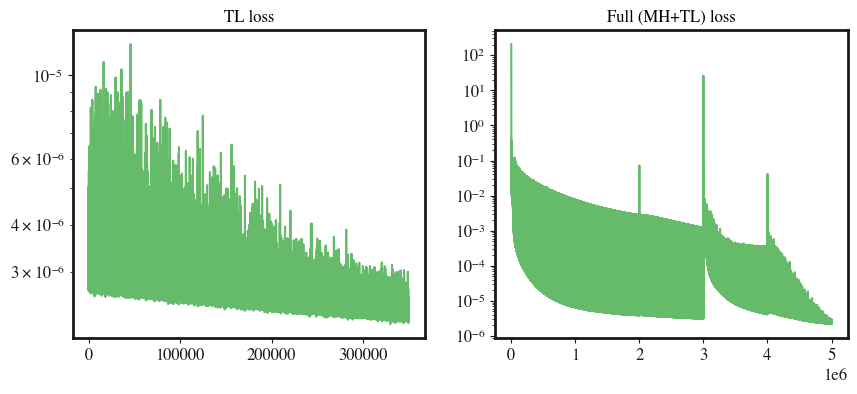

max phi_h=  1.7246952936633912


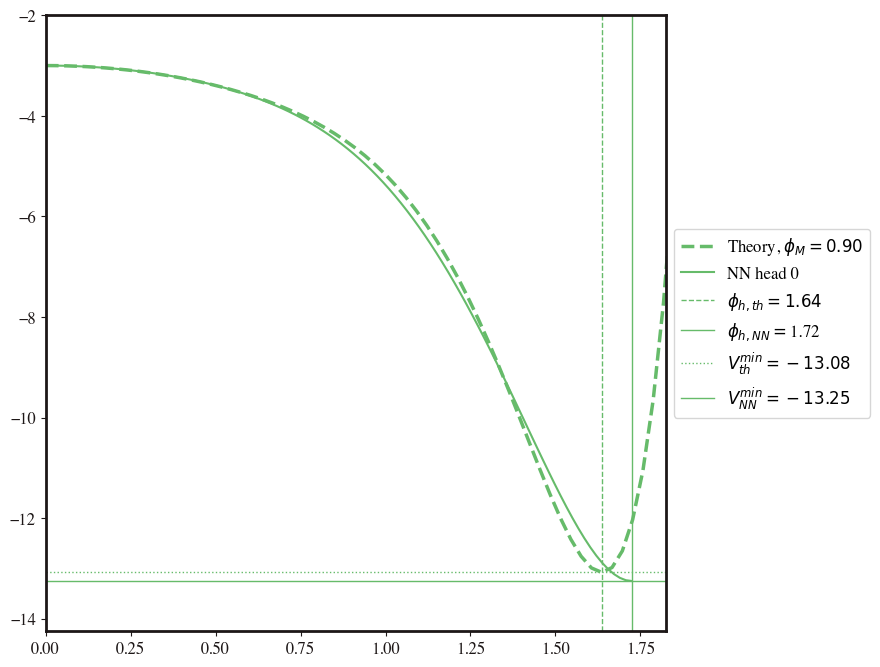

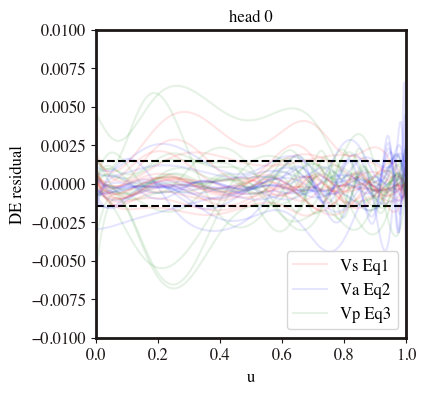

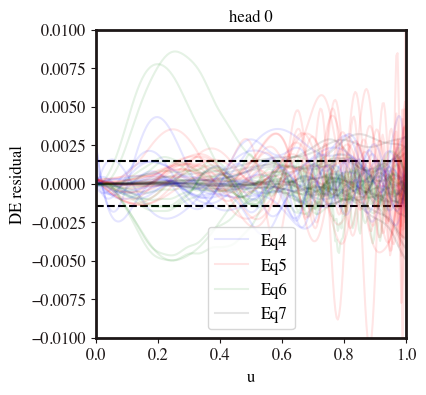

In [16]:
epochs = 50_000
for _ in range(7):
    tl.solver.fit(max_epochs=epochs, 
                     callbacks=[potential_cb, scheduler_cb],
                     tqdm_file=tqdm(total=epochs, dynamic_ncols=True, desc='Epochs', unit='iteration', colour='#0afa9e'))
    retrained+=epochs
    tl.MH_save_results(f'{path_results_TL}/TL_0_9_unfrozen')
    
    fig,ax=plt.subplots(1,2, figsize=(10,4))
    l_min = min(tl.solver.metrics_history['train_loss'][-retrained-50:])
    ax[0].plot(tl.solver.metrics_history['train_loss'][-retrained-50:])
    ax[0].set_yscale('log')
    ax[0].set_title('TL loss')
    ax[1].plot(tl.solver.metrics_history['train_loss'])
    ax[1].set_yscale('log')
    ax[1].set_title('Full (MH+TL) loss')
    print('Min loss TL', min(tl.solver.metrics_history['train_loss'][-10000:]))
    fig.savefig(f'{path_results_TL}/loss_epoch_{tl.solver.global_epoch}.pdf')
    plt.show()

    tl.plot_potential(phim=[0.9], save_fig=True)
    tl.plot_residuals_in_u(max_bound=1e-2, save_fig=True)
    

In [42]:
epochs = 90_000
tl.solver.fit(max_epochs=epochs, 
                     callbacks=[potential_cb, scheduler_cb],
                     tqdm_file=tqdm(total=epochs, dynamic_ncols=True, desc='Epochs', unit='iteration', colour='#0afa9e'))
retrained+=epochs

Epochs:   0%|                                  | 0/90000 [00:00<?, ?iteration/s]

In [49]:
tl.MH_save_results(f'{path_results_TL}/TL_0_9_unfrozen_addloss_V')

Model succesfully saved


In [46]:
retrained

100000

NameError: name 'retrained' is not defined

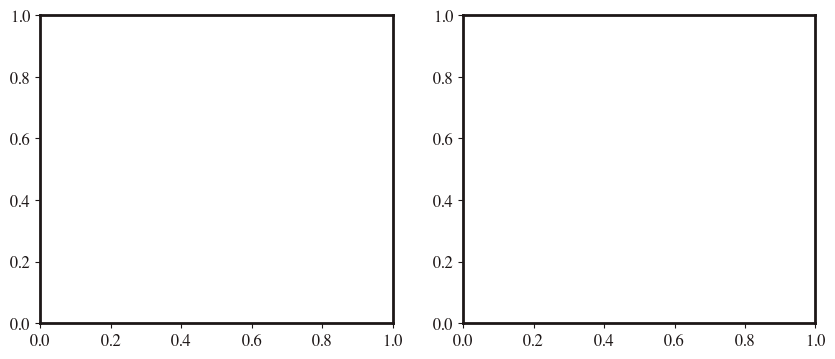

In [9]:
fig,ax=plt.subplots(1,2, figsize=(10,4))
l_min = min(tl.solver.metrics_history['train_loss'][-retrained-50:])
ax[0].plot(tl.solver.metrics_history['train_loss'][-retrained-50:])
ax[0].set_yscale('log')
ax[0].set_title('TL loss')
ax[1].plot(tl.solver.metrics_history['train_loss'])
ax[1].set_yscale('log')
ax[1].set_title('Full (MH+TL) loss')
print('Min loss TL', min(tl.solver.metrics_history['train_loss'][-10000:]))
#fig.savefig(f'{path_results_TL}/loss_epoch_{tl.solver.global_epoch}.pdf')
plt.show()

tl.plot_potential(phim=[0.9], sampling_pts=1000, save_fig=True)
#tl.plot_residuals_in_u(max_bound=1e-2, save_fig=False)
#print(tl.solver.metrics_history['train_loss'][-101:])


In [35]:
x=torch.zeros(1, requires_grad=True)
p = x.reshape(-1,1)
V_0 = tl.V[0](p)
DV_0 = diff(V_0, p)
DDV_0 = diff(diff(V_0,p),p)
print('V(0)=',V_0.detach().numpy(), 'dV(0)=',DV_0.detach().numpy(), 'ddV(0)=',DDV_0.detach().numpy())

V(0)= [[-2.99999942]] dV(0)= [[0.00048078]] ddV(0)= [[-2.99918109]]


In [38]:
x=torch.zeros(1, requires_grad=True)
p = x.reshape(-1,1)
V_0 = tl.V[0](p)
DV_0 = diff(V_0, p)
DDV_0 = diff(diff(V_0,p),p)
print('V(0)=',V_0.detach().numpy(), 'dV(0)=',DV_0.detach().numpy(), 'ddV(0)=',DDV_0.detach().numpy())

V(0)= [[-2.99999943]] dV(0)= [[0.00029456]] ddV(0)= [[-2.99971987]]


In [45]:
x=torch.zeros(1, requires_grad=True)
p = x.reshape(-1,1)
V_0 = tl.V[0](p)
DV_0 = diff(V_0, p)
DDV_0 = diff(diff(V_0,p),p)
print('V(0)=',V_0.detach().numpy(), 'dV(0)=',DV_0.detach().numpy(), 'ddV(0)=',DDV_0.detach().numpy())

V(0)= [[-2.99999549]] dV(0)= [[0.00057554]] ddV(0)= [[-2.99963844]]


V(0) [NET(
  (H_model): CustomNN(
    (layers): ModuleList(
      (0): Linear(in_features=1, out_features=32, bias=True)
      (1): SiLU()
      (2): Linear(in_features=32, out_features=32, bias=True)
      (3): SiLU()
    )
    (fc_out): Linear(in_features=32, out_features=128, bias=True)
  )
  (head_model): FCNN(
    (NN): Sequential(
      (0): Linear(in_features=128, out_features=64, bias=True)
      (1): Tanh()
      (2): Linear(in_features=64, out_features=64, bias=True)
      (3): Tanh()
      (4): Linear(in_features=64, out_features=1, bias=True)
    )
  )
)]


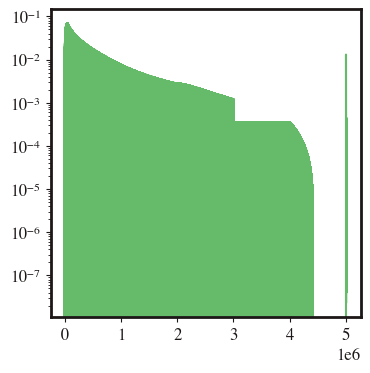

In [39]:

fig=plt.figure()
plt.plot(tl.solver.metrics_history['add_loss'])
plt.yscale('log')

print('V(0)', tl.V)

## Metrics of TL

In [57]:
tl.solver.global_epoch

1400000

Min loss TL 4.14942462236388e-06


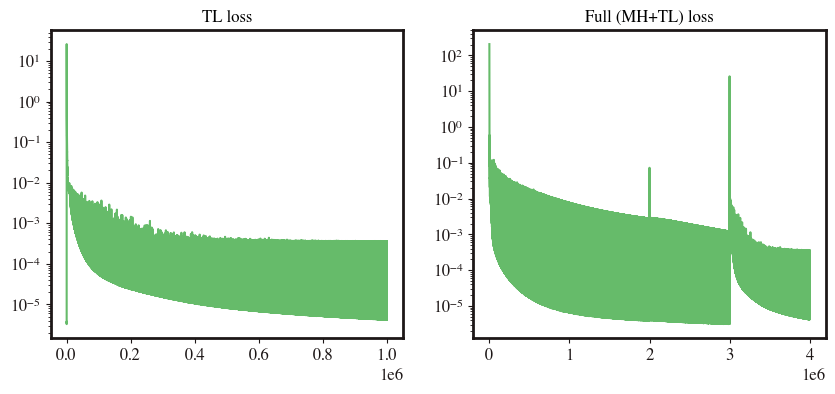

In [27]:
#tl.plot_loss(save_fig=True)
fig,ax=plt.subplots(1,2, figsize=(10,4))
ax[0].plot(tl.solver.metrics_history['train_loss'][-retrained-50:])
ax[0].set_yscale('log')
ax[0].set_title('TL loss')
ax[1].plot(tl.solver.metrics_history['train_loss'])
ax[1].set_yscale('log')
ax[1].set_title('Full (MH+TL) loss')
print('Min loss TL', min(tl.solver.metrics_history['train_loss'][-10000:]))
plt.show()
#fig.savefig(f'{path_results_TL}/loss_epoch_{tl.solver.global_epoch}.pdf')

max phi_h=  1.7506091379483633


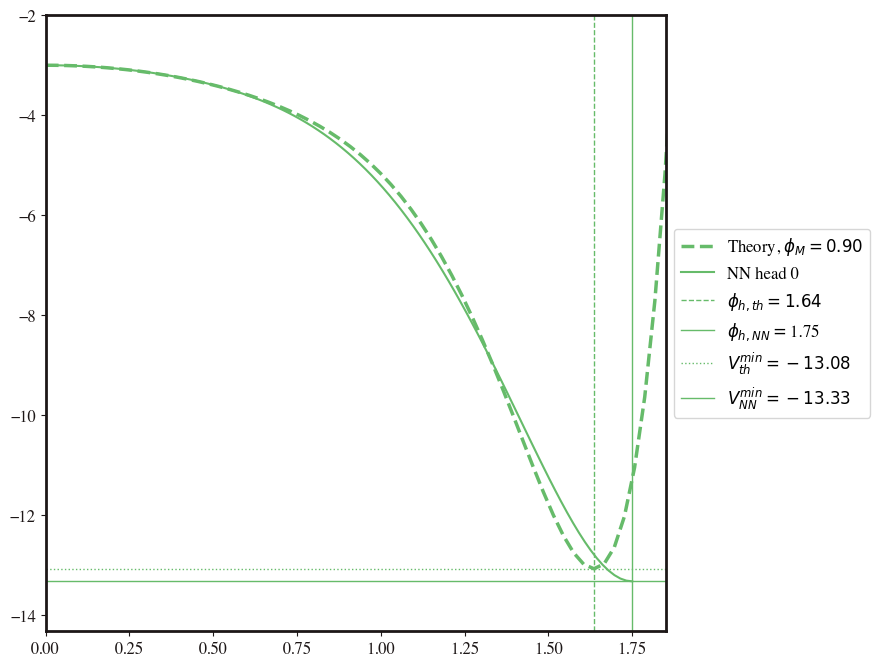

In [28]:
tl.plot_potential(phim=[0.9], save_fig=False)


g_MAT torch.Size([3600, 3, 3]) det torch.Size([3600]) U torch.Size([1, 50, 72])


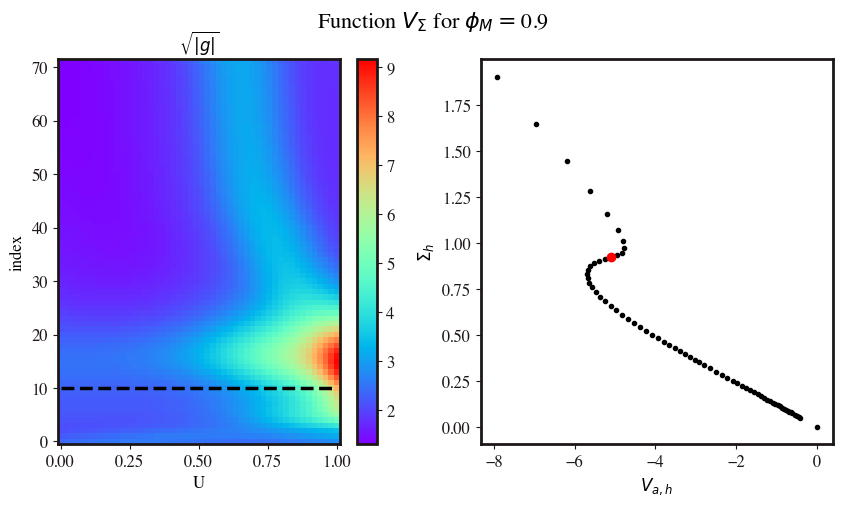

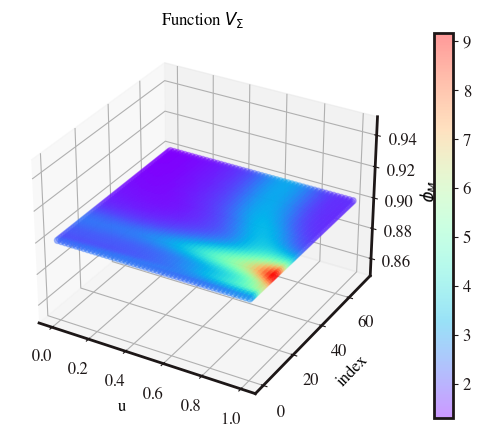

g_MAT torch.Size([3600, 3, 3]) det torch.Size([3600]) U torch.Size([1, 50, 72])


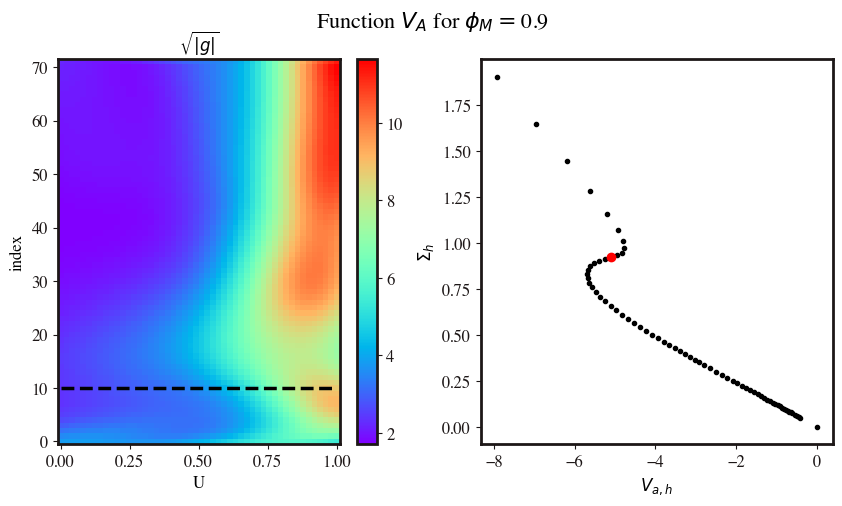

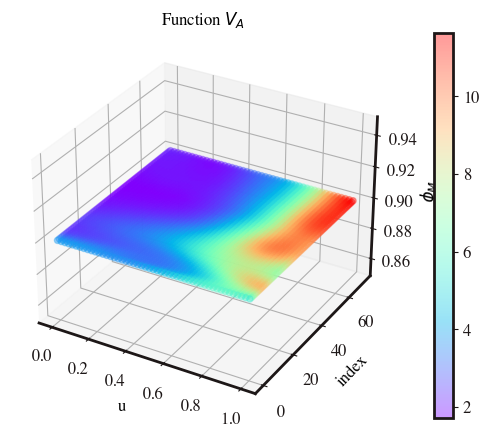

g_MAT torch.Size([3600, 3, 3]) det torch.Size([3600]) U torch.Size([1, 50, 72])


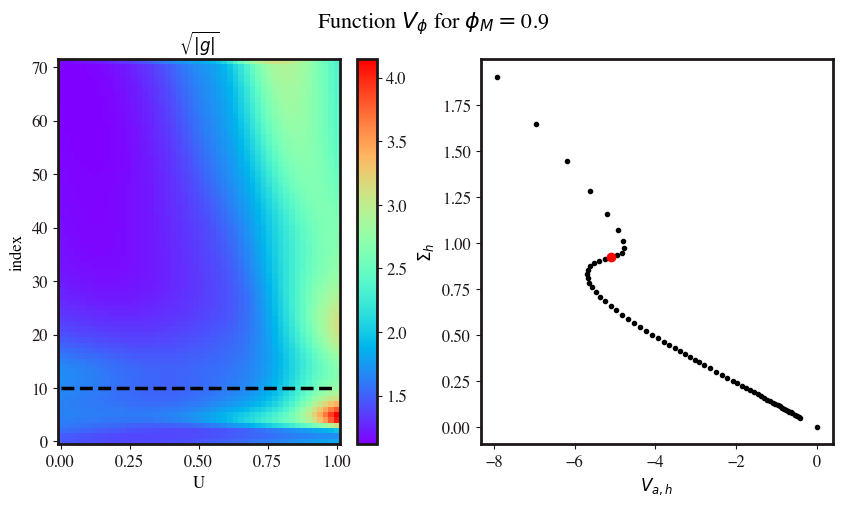

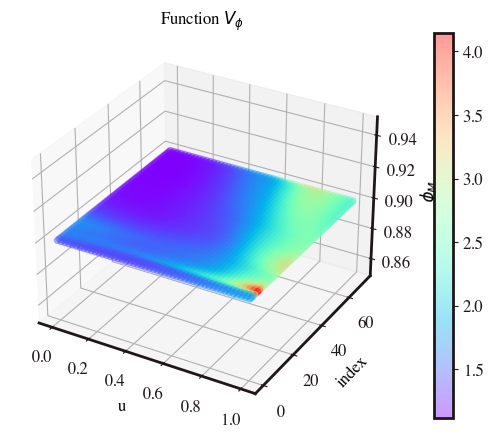

g_MAT torch.Size([3600, 3, 3]) det torch.Size([3600]) U torch.Size([1, 50, 72])


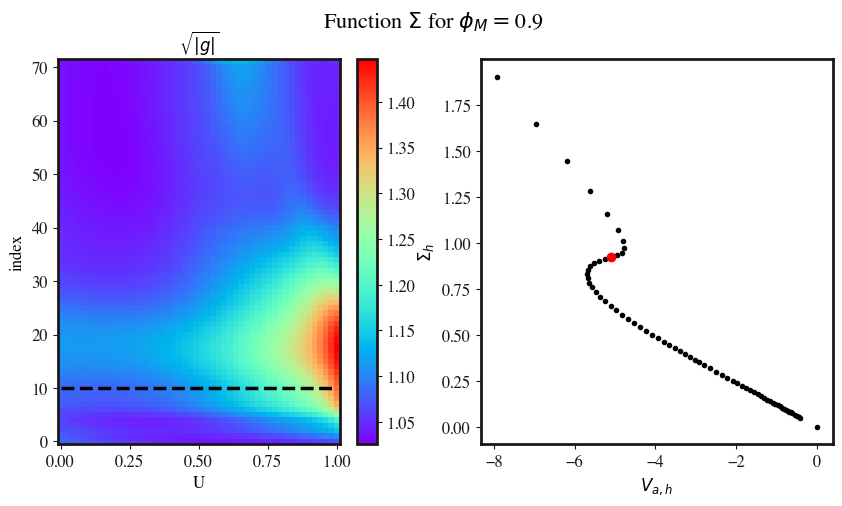

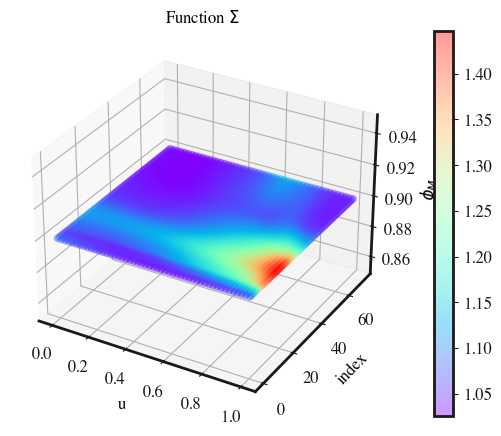

g_MAT torch.Size([3600, 3, 3]) det torch.Size([3600]) U torch.Size([1, 50, 72])


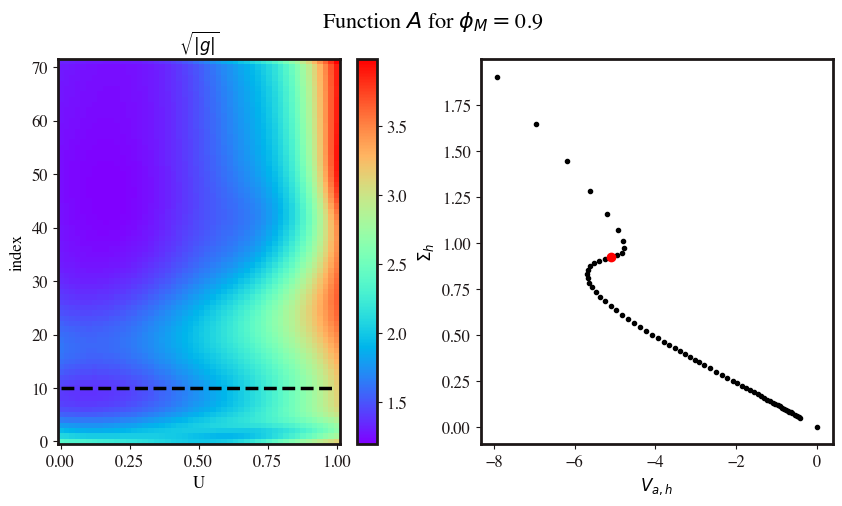

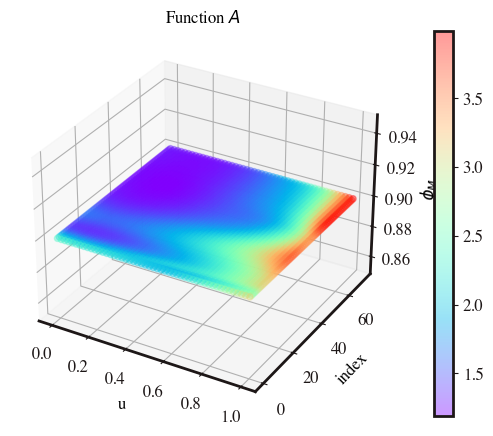

g_MAT torch.Size([3600, 3, 3]) det torch.Size([3600]) U torch.Size([1, 50, 72])


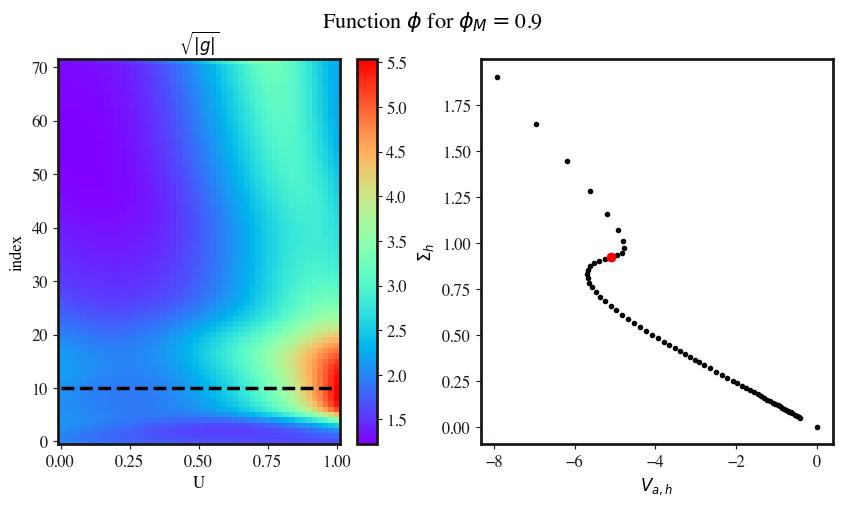

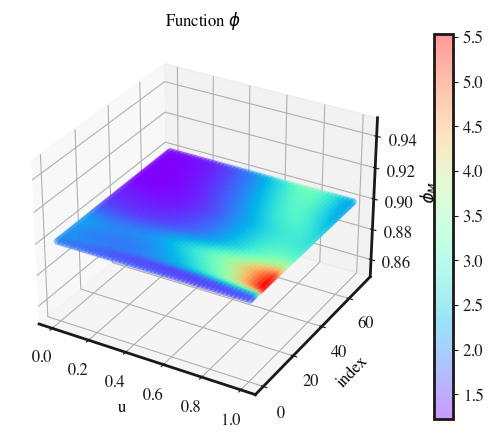

In [32]:
tl.plot_metric()

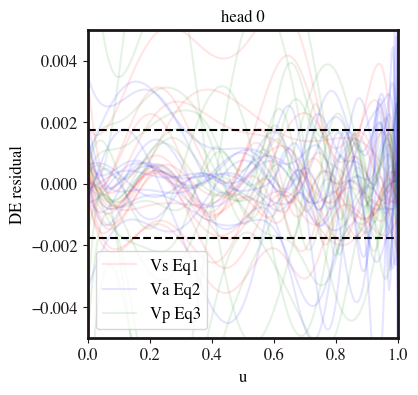

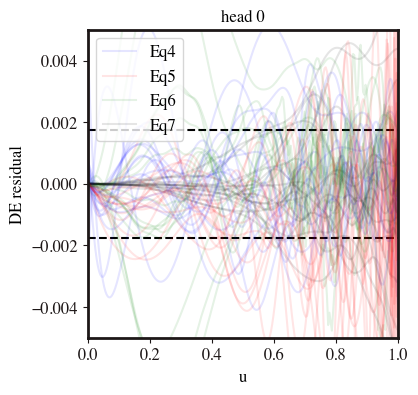

In [33]:
tl.plot_residuals_in_u(max_bound=5e-3, save_fig=False)

In [28]:
MH_save_results(tl, f'{path_results_TL}/NN_Heist_flat_test_3.1_TL_to_0_65')

Model succesfully saved


In [19]:
retrained

10

## Keep on training a single TL piece

In [21]:
load_path2 = f'{path_results_TL}/TL_0_9_epochs_{3000000+retrained}'

tl2 = NNholo_multihead_heist(transfer_sofT_path=sofT_transfer, phim_list=[0.9], \
                            saving_path = path_results_TL, load_path = load_path2, \
                            u_pts = 64, transfer_lr=1e-3)  
                            

Loading dictionary...
Dictionary loaded correctly
[32, 32, 32, 32, 128] [16, 16]
Equations dictionary generated
length of s(T) curves: [72]
head 0
Inside solver __init()__: <bound method NNholo_multihead_heist.generate_equations.<locals>.make_equations.<locals>.equations of <NNholo_multihead_paper.NNholo_multihead_heist object at 0x368f9a0b0>>
head 0
Inside solver __init()__: <bound method NNholo_multihead_heist.generate_equations.<locals>.make_equations.<locals>.equations of <NNholo_multihead_paper.NNholo_multihead_heist object at 0x368f9a0b0>>
Ready to transfer learn


In [24]:
store_mse2 = Store_MSE_Loss()

scheduler2 = torch.optim.lr_scheduler.StepLR(tl2.adam, step_size=5000, gamma=0.985)
scheduler_cb2 = DoSchedulerStep(scheduler=scheduler2)

potential_cb2 = BestValidationCallback()

In [25]:
epochs = 10
tl2.solver.fit(max_epochs=epochs, 
                 callbacks=[potential_cb2, scheduler_cb2],
                 tqdm_file=tqdm(total=epochs, dynamic_ncols=True, desc='Epochs', unit='iteration', colour='#0afa9e'))


Epochs:   0%|                                     | 0/10 [00:00<?, ?iteration/s]

# Old stuff

## Load transfered learned, without freezing body, so we get fine tunning

In [ ]:
tl_tuning = NNholo_multihead_heist(transfer_sofT_path=sofT_transfer, phim_list=[0.7], \
                            saving_path = path_results_TL, transfer_lr=1e-3, \
                            load_path = f'{path_results_TL}/NN_Heist_non_flat_test_5_TL_to_0_7_1318342')

## Keep on training the body

In [12]:
store_mse = Store_MSE_Loss()

scheduler = torch.optim.lr_scheduler.StepLR(e.adam, step_size=5000, gamma=0.985)
scheduler_cb = DoSchedulerStep(scheduler=scheduler)

potential_cb = BestValidationCallback()


In [18]:
epochs = 10
e.solver.fit(max_epochs=epochs, 
                 callbacks=[potential_cb, scheduler_cb],
                 tqdm_file=tqdm(total=epochs, dynamic_ncols=True, desc='Epochs', unit='iteration', colour='#0afa9e'))

Epochs:   0%|                                     | 0/10 [00:00<?, ?iteration/s]

In [9]:
load_path = "/Users/pablo/Desktop/NNholo/To run/January (2024)/Moving forward/Abemus saving for real/New life/Multihead/trial_4/NN_MH_trial_4_epochs_300000"
transfer_sofT_path = "/Users/pablo/Desktop/NNholo/To run/January (2024)/Moving forward/Abemus saving for real/New life/Multihead/Data/Potentials_phim/SofTphiM0_9.txt"

tl = NNholo_multihead(saving_path=path_results, transfer_sofT_path=transfer_sofT_path, load_path=load_path, transfer_lr=1e-4)

Equations dictionary generated
length of s(T) curves: [72]
head 0
Inside solver __init()__: <bound method NNholo_multihead.generate_equations.<locals>.make_equations.<locals>.equations of <NNholo_multihead_delta.NNholo_multihead object at 0x31407ea10>>
Ready to transfer learn


In [11]:
store_mse = Store_MSE_Loss()

scheduler = torch.optim.lr_scheduler.StepLR(tl.adam, step_size=5000, gamma=0.985)
scheduler_cb = DoSchedulerStep(scheduler=scheduler)

potential_cb = BestValidationCallback()


NameError: name 'tl' is not defined

In [26]:
tl.update_optimizer(5e-5)

Learning rate updated to:  5e-05


In [27]:
epochs = 100000
tl.solver.fit(max_epochs=epochs, 
                 callbacks=[potential_cb, scheduler_cb],
                 tqdm_file=tqdm(total=epochs, dynamic_ncols=True, desc='Epochs', unit='iteration', colour='#0afa9e'))

Epochs:   0%|                                 | 0/100000 [00:00<?, ?iteration/s]

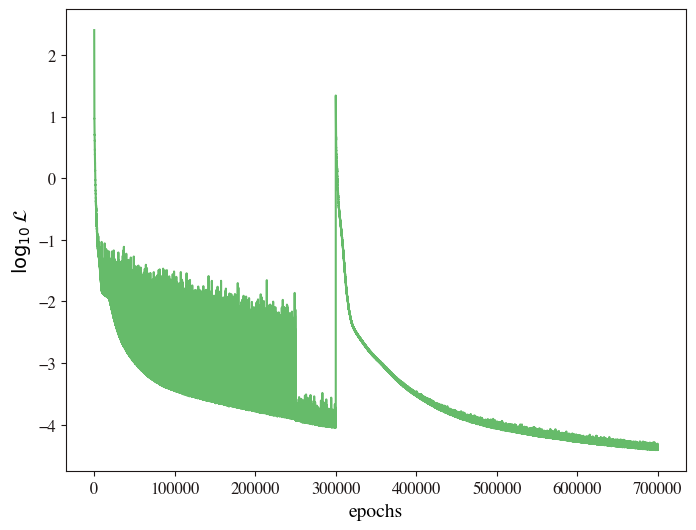

Min loss:  3.8751813940019e-05
max phi_h=  1.717543321474725


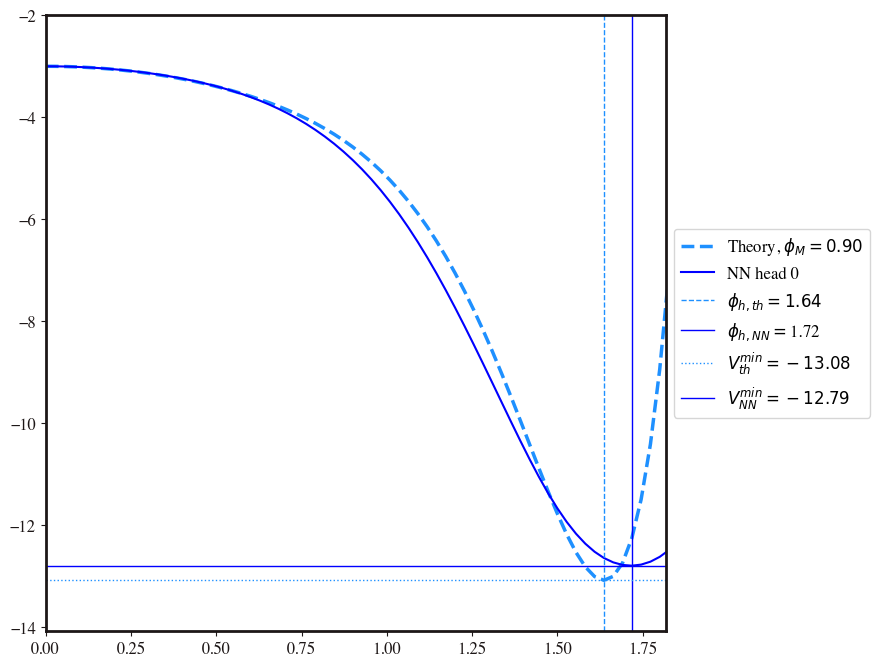

In [24]:
tl.plot_loss()
tl.plot_potential(phim=[0.9], save_fig=True)

In [16]:
tl.update_optimizer()

Actual learning rate:  2.9846845658843145e-05


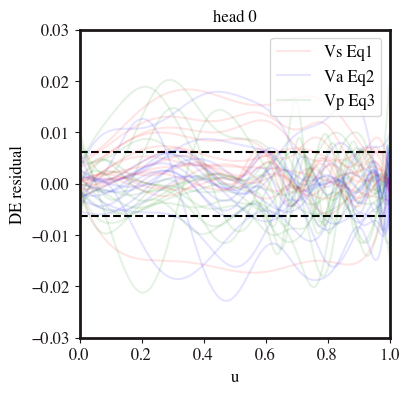

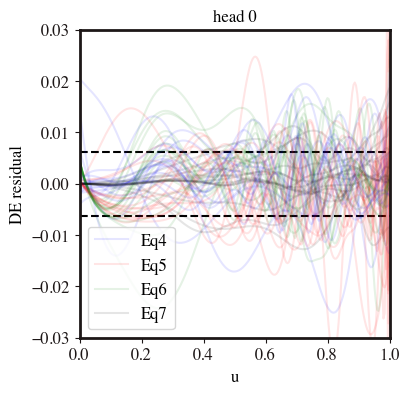

In [20]:
tl.plot_residuals_in_u(max_bound=3e-2)

In [23]:
a=2.3
b=str(a)
c=b.replace('.','_')
print(c)

2_3


## Generate new model with $S(T)$ for Adiabatic TL

In [3]:
sofT5 = "/Users/pablo/Desktop/NNholo/To run/January (2024)/Moving forward/Abemus saving for real/New life/Multihead/Data/Potentials_phim/SofTphiM5_0.txt"
sofT2 = "/Users/pablo/Desktop/NNholo/To run/January (2024)/Moving forward/Abemus saving for real/New life/Multihead/Data/Potentials_phim/SofTphiM2_0.txt"
sofT1_08 = "/Users/pablo/Desktop/NNholo/To run/January (2024)/Moving forward/Abemus saving for real/New life/Multihead/Data/Potentials_phim/SofTphiM1_08.txt"
sofT1 = "/Users/pablo/Desktop/NNholo/To run/January (2024)/Moving forward/Abemus saving for real/New life/Multihead/Data/Curve_sofT_case3of5.csv"
sofT_list = [sofT5, sofT1_08,sofT1]
#sofT_list = [sofT5]
solver_nets = [32,32,32]
solver_head = [16,16]
V_nets = [16,16,16,16,16]
V_head = [8,8]
u_pts = 48

In [4]:

d = NNholo_multihead(sofT_path_list=sofT_list,\
           saving_path = path_results, u_pts=u_pts, solver_nets=solver_nets, V_arch=V_nets, solver_head_arch=solver_head, \
                     V_head_arch=V_head, actv_V_head=nn.SiLU, u_sampling='chebyshev2-noisy', n_batches_train=1, \
                     load_path = 'NN_trial_save_4_epochs_300' )


Loading the model...
Solver architecture [32, 32, 32]
Solver head architecture [10, 10]
V architecture [16, 16, 16, 8]
V head architecture [8, 8]
Creating the nets...
Equations dictionary generated
Equation list ready
length of s(T) curves: [72, 72, 68]
head 0
Inside solver __init()__: <bound method NNholo_multihead.generate_equations.<locals>.make_equations.<locals>.equations of <NNholo_multihead_delta.NNholo_multihead object at 0x2bf9ae620>>
head 1
Inside solver __init()__: <bound method NNholo_multihead.generate_equations.<locals>.make_equations.<locals>.equations of <NNholo_multihead_delta.NNholo_multihead object at 0x2bf9ae620>>
head 2
Inside solver __init()__: <bound method NNholo_multihead.generate_equations.<locals>.make_equations.<locals>.equations of <NNholo_multihead_delta.NNholo_multihead object at 0x2bf9ae620>>
Loading data to the solver


In [5]:
#y = d.g1.get_examples().detach().numpy()
#plt.figure(figsize=(15,5))
#plt.hist(y,bins=250)
#plt.show()

In [6]:
store_mse = Store_MSE_Loss()

scheduler = torch.optim.lr_scheduler.StepLR(d.adam, step_size=5000, gamma=0.985)
scheduler_cb = DoSchedulerStep(scheduler=scheduler)

potential_cb = BestValidationCallback()

In [7]:
d.update_optimizer()

Actual learning rate:  0.0008597304422591431


In [8]:
epochs = 100
d.solver.fit(max_epochs=epochs, 
             callbacks=[potential_cb, scheduler_cb],
             tqdm_file=tqdm(total=epochs, dynamic_ncols=True, desc='Epochs', unit='iteration', colour='#0afa9e'))

#, 

Epochs:   0%|                                    | 0/100 [00:00<?, ?iteration/s]

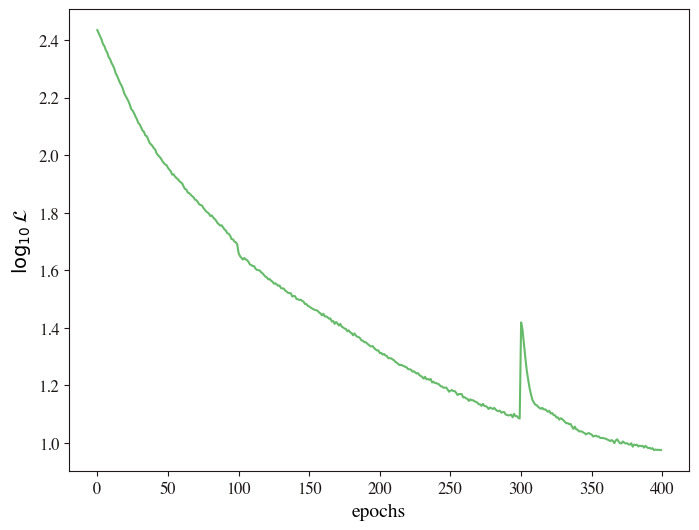

Min loss:  9.43498462217673


In [9]:
d.plot_loss()

In [10]:
d.MH_save_results(f'{path_results}/NN_MH_trial_gamma_2')

Model succesfully saved


max phi_h=  0.7529363211909775
max phi_h=  0.6367147779119559
max phi_h=  0.534462811093448
max phi_h=  0.45179725464426823


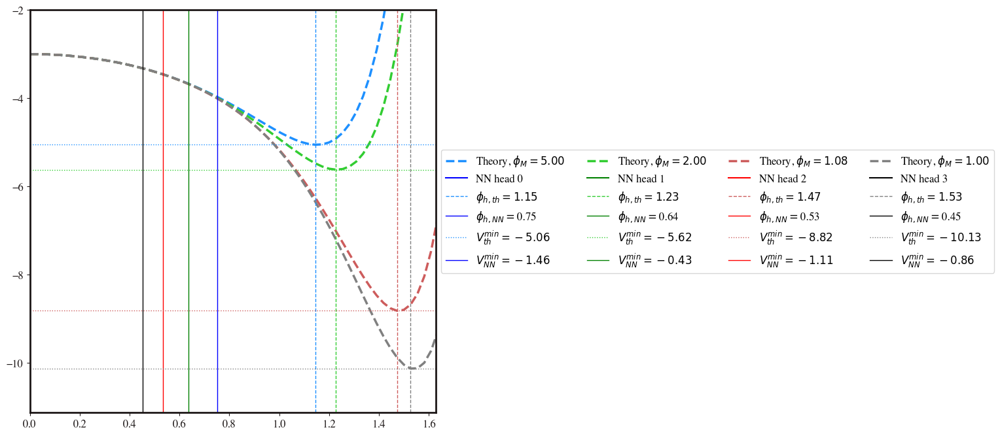

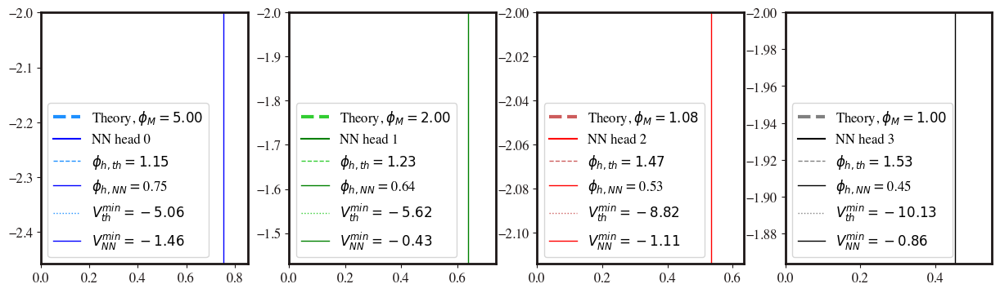

In [22]:
phim_list=[5,2,1.08,1]

d.plot_potential(phim=phim_list, save_fig=False)

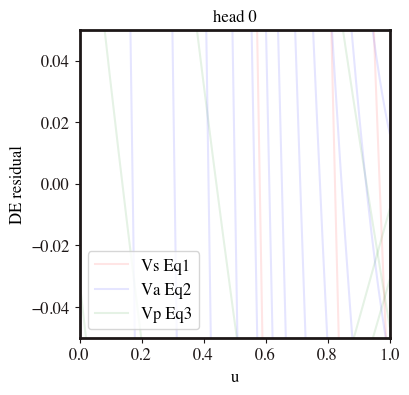

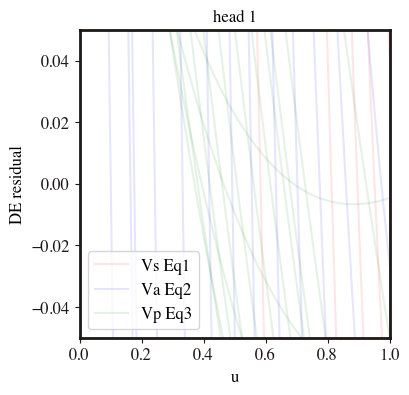

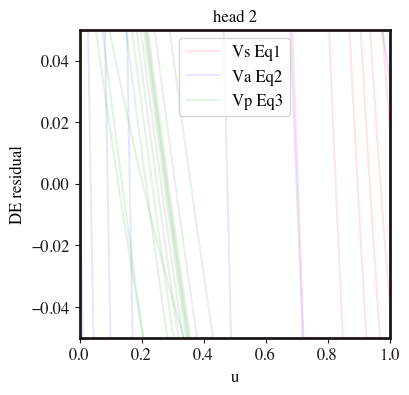

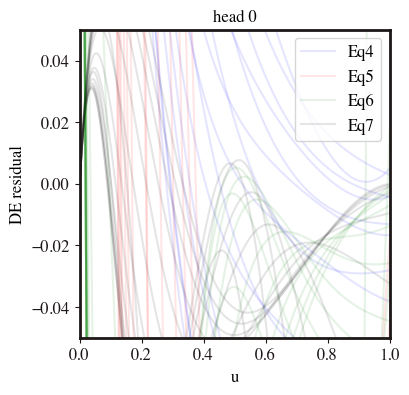

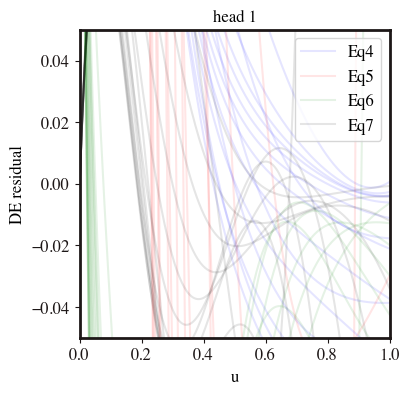

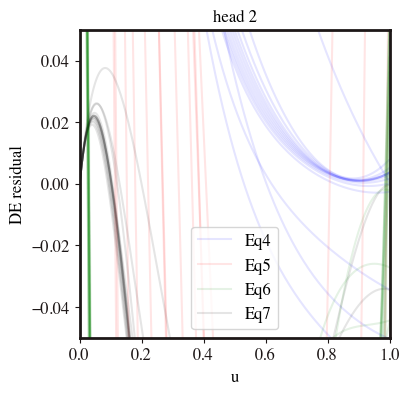

In [11]:
d.plot_residuals_in_u(max_bound=5e-2, save_fig=False)

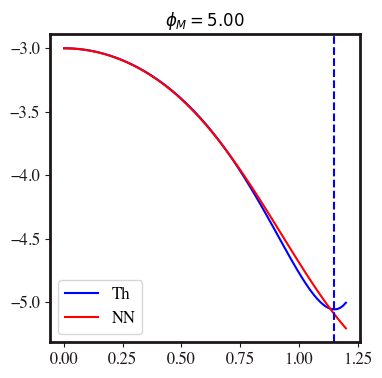

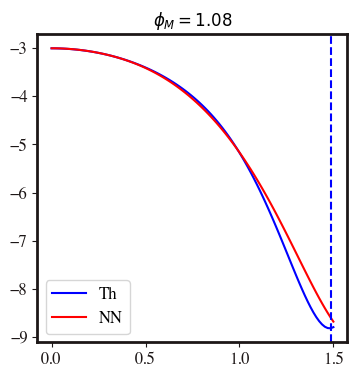

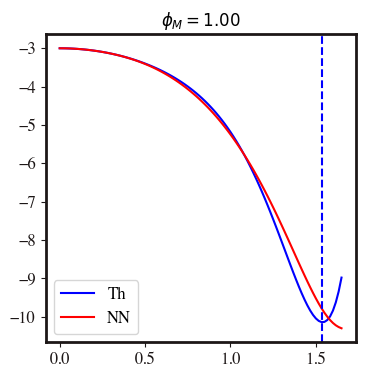

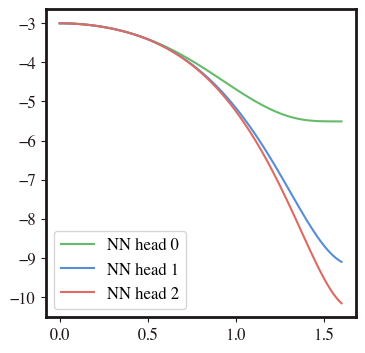

In [15]:
phimax_list=[1.2,1.5,1.65]
phim_list=[5,1.08,1]
for i, phim in enumerate(phim_list):
    phi = torch.linspace(0,phimax_list[i],100)
    V_th = V_or(phi, phim=phim)
    fig=plt.figure()
    plt.plot(phi.detach().numpy(), V_th, '-b', label='Th')
    V_phi = d.V_net[i](phi.reshape(-1,1))
    plt.plot(phi.detach().numpy(), V_phi.detach().numpy(), '-r', label='NN')
    plt.axvline(phi[np.argmin(V_th)], color='blue', linestyle='dashed')
    plt.legend()
    plt.title(r'$\phi_M=%.2f$'%phim)
    plt.show()

plt.figure()
for i in range(3):
    phi = torch.linspace(0,1.6,100)
    V_phi = d.V_net[i](phi.reshape(-1,1))
    plt.plot(phi.detach().numpy(),V_phi.detach().numpy(), label='NN head %i'%i)
plt.legend()
plt.show()

In [17]:
d.MH_save_results('NN_MH_trial_save')

Model succesfully saved


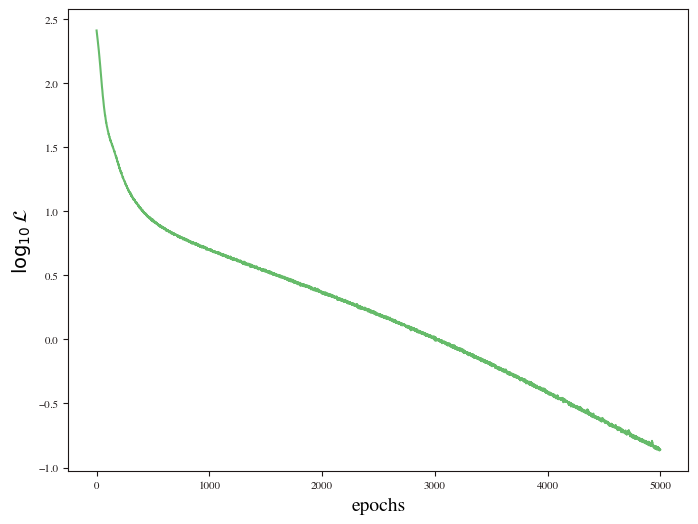

Min loss:  0.13580358067808104


In [11]:
d.plot_loss()

max phi_h=  0.5268920971958345
max phi_h=  0.5268920971958345
max phi_h=  0.5268920971958345


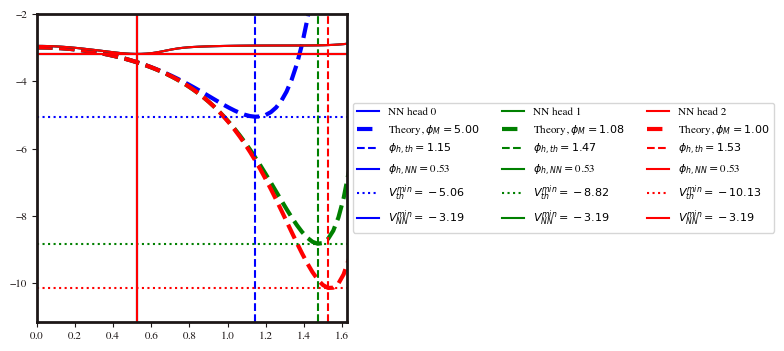

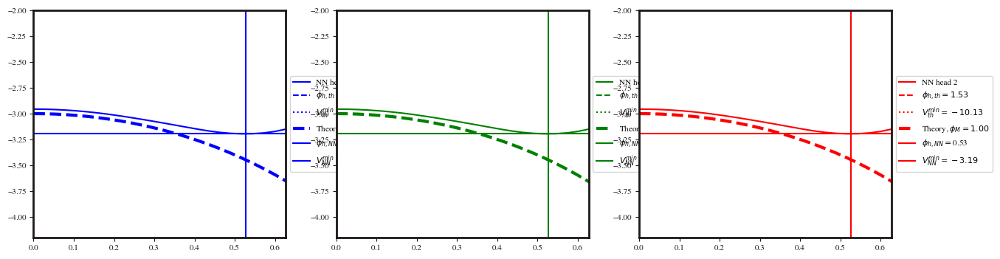

In [12]:
phim_list=[5,1.08,1]

d.plot_potential(phim=phim_list)

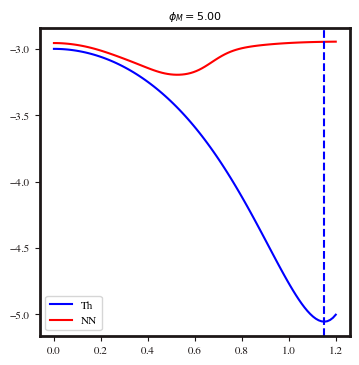

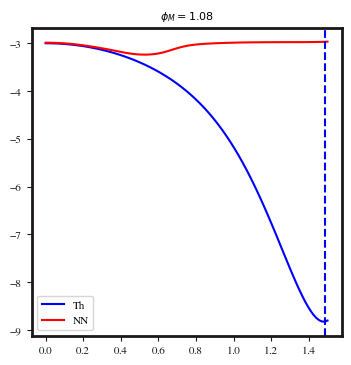

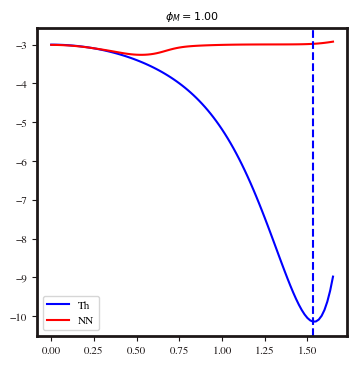

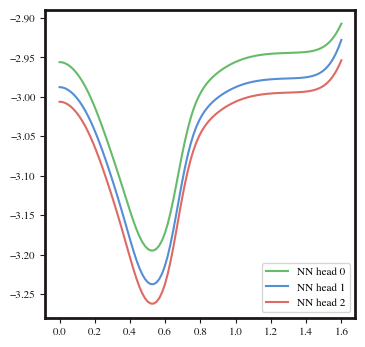

In [14]:

phimax_list=[1.2,1.5,1.65]

for i, phim in enumerate(phim_list):
    phi = torch.linspace(0,phimax_list[i],100)
    V_th = V_or(phi, phim=phim)
    fig=plt.figure()
    plt.plot(phi.detach().numpy(), V_th, '-b', label='Th')
    V_phi = d.V_net[i](phi.reshape(-1,1))
    plt.plot(phi.detach().numpy(), V_phi.detach().numpy(), '-r', label='NN')
    plt.axvline(phi[np.argmin(V_th)], color='blue', linestyle='dashed')
    plt.legend()
    plt.title(r'$\phi_M=%.2f$'%phim)
    plt.show()

plt.figure()
for i in range(3):
    phi = torch.linspace(0,1.6,100)
    V_phi = d.V_net[i](phi.reshape(-1,1))
    plt.plot(phi.detach().numpy(),V_phi.detach().numpy(), label='NN head %i'%i)
plt.legend()
plt.show()
    


Epochs: 0iteration [00:00, ?iteration/s]

Training Progress: 0it [00:00, ?it/s]

140425 149542
slope= -1.040804079229806e-09


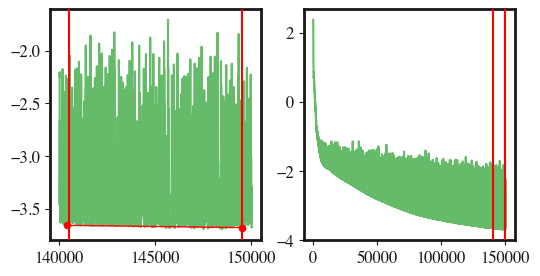

Slope = 1.040804079229806e-09 < thres: 0.001


In [28]:
custom_train(d, thres=1e-3, check_every=0, step=10000)

In [27]:
def custom_train(model, thres, check_every=1000, step=None):
    cbar = tqdm(total=check_every, dynamic_ncols=True, desc='Epochs', unit='iteration', colour='#b11226')
    t = 0
    if step==None:
        step = check_every
    while t==0:
        model.solver.fit(check_every, callbacks = [potential_cb, scheduler_cb]) #, tqmd_file = cbar)
        
        train = model.solver.metrics_history['train_loss']
        #a = np.log10(min(train[-init:-(init-step)]))
        #b =  np.log10(min(train[-step:]))
        #var = abs((10**a - 10**b)/(10**a)) * 100
        
        epsilon=int(0.05*step)
        init = len(train)-step
        end = init+step
        #x_list = [init+epsilon,end-epsilon]

        a = np.log10(min(train[init:(init+epsilon)]))
        b =  np.log10(min(train[end-epsilon:end]))
        x_a = np.argmin(train[init:(init+epsilon)])+init
        x_b = end-np.argmin(train[end-epsilon:end])
        x_list=[x_a,x_b]
        print(x_a, x_b)
        y_list= [a,b]

        slope = (10**b - 10**a)/(step)
        print('slope=',slope)
        
        fig,ax =plt.subplots(1,2,figsize=(6,3))
        ax[0].plot(np.linspace(init,end,len(train[init:end])), np.log10(train[init:end]))
        ax[0].plot(x_list,y_list, '-r', linewidth=1)
        ax[0].scatter(x_list, y_list, color='r', s=20, zorder=3)
        ax[0].axvline(init+epsilon, color='r', zorder=3)
        ax[0].axvline(end-epsilon, color='r', zorder=3)        
        ax[1].plot(np.log10(train))
        ax[1].axvline(init+epsilon, color='r', zorder=3)
        ax[1].axvline(end-epsilon, color='r', zorder=3)
        plt.show()
        if slope<0 and abs(slope)<thres:
            t+=1       
            print('Slope =', abs(slope), '< thres:',thres)
    

In [16]:
c = [2,4,6]
def test(a):
    b = (a*c[head])
    return b
            

In [17]:
n_heads=3
d=[test(1.0) for head in range(n_heads)]

NameError: name 'head' is not defined

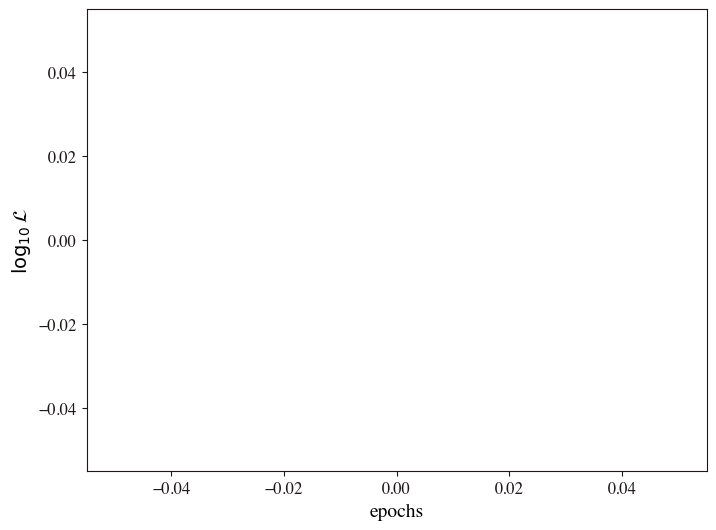

ValueError: min() arg is an empty sequence

In [12]:
d.plot_loss(save_fig = False)
#d.plot_DE_loss()
#d.plot_add_loss()
#d.plot_separate_losses(save_fig = True)


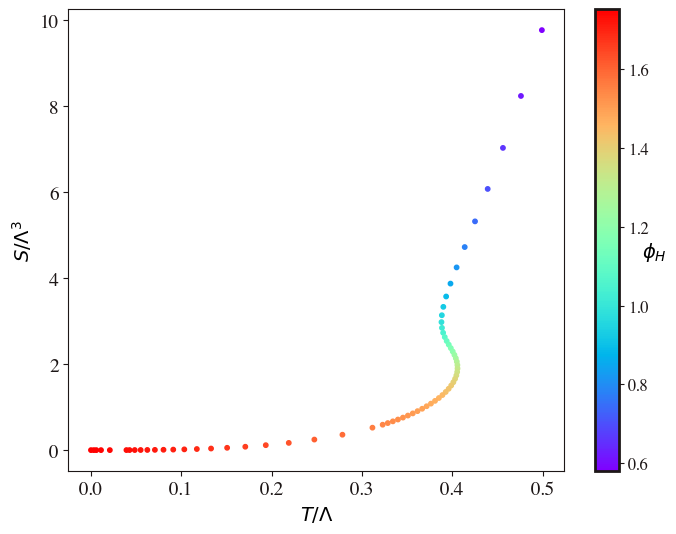

In [29]:
d.plot_colored_sofT(phiM_chosen=1, colormap='rainbow')

In [30]:
d.update_optimizer()

Actual learning rate:  0.00022060891046938726


max phi_h=  1.6431360574117273
V(0) tensor([[-3.0000]], grad_fn=<AddmmBackward0>)
DV(0) tensor([[7.1557e-05]], grad_fn=<AddBackward0>)
DDV(0) tensor([[-3.0160]], grad_fn=<AddBackward0>)


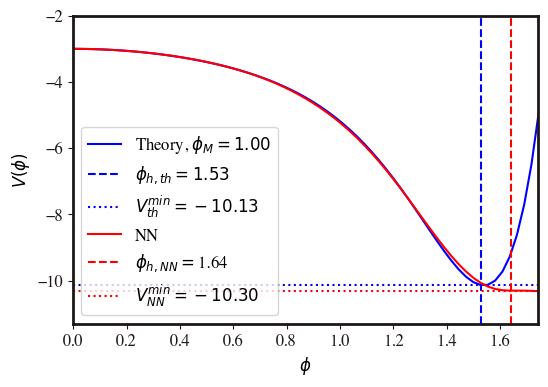

In [47]:
d.plot_potential(phim=[1])

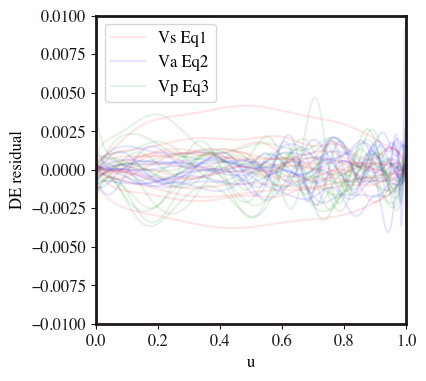

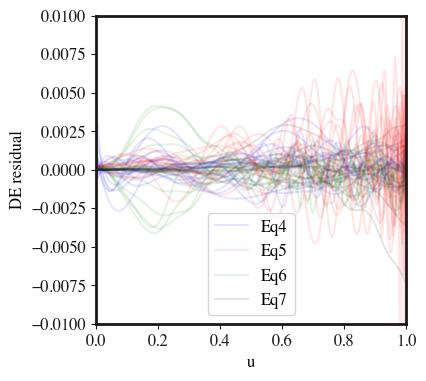

In [42]:
d.plot_residuals_in_u(max_bound=1e-2)

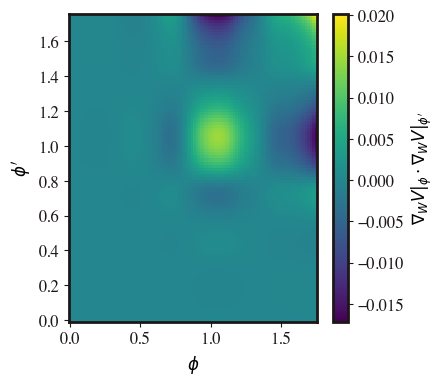

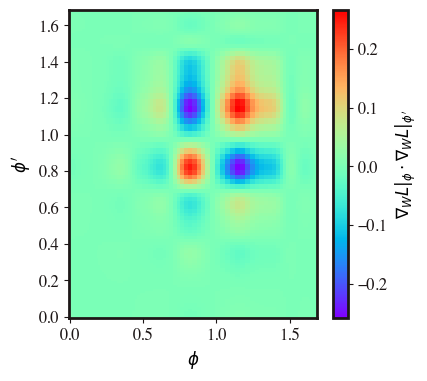

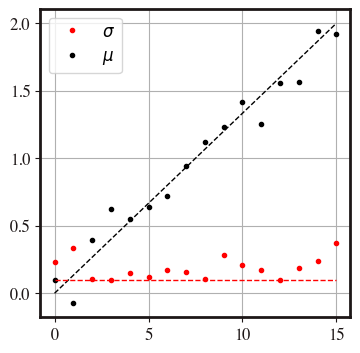

Text(0, 0.5, 'w-HL2')

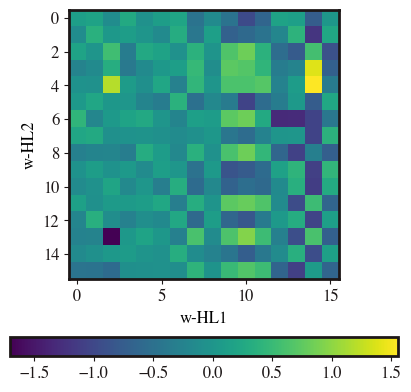

In [43]:
phi=torch.reshape(torch.linspace(0.0,1.75,100),[100,1])
V = d.V
pot = V(phi)
pot_der = []
PHIX,PHIY = np.meshgrid(phi,phi)
for i in pot:
    mean_der = torch.mean(diff(i,V.layers[0].weight,shape_check=False))
    pot_der.append(mean_der.detach().numpy())
corr = np.zeros([len(pot_der),len(pot_der)])
for i in range(len(pot_der)):
    for j in range(len(pot_der)):
        corr[i,j] = pot_der[i]*pot_der[j]
plt.pcolormesh(PHIX,PHIY,corr)
plt.xlabel('$\phi$')
plt.ylabel('$\phi^\prime$')
plt.colorbar(label = '$\\nabla_W V|_{\phi} \cdot \\nabla_W V|_{\phi^\prime}$')

solution = d.solver.get_solution()
#u_sampling = d.g1.get_examples()
u_sampling = torch.linspace(0,1,100)
S= np.ones_like(u_sampling.detach().numpy())*0
T= np.ones_like(u_sampling.detach().numpy())*0
phi=solution(u_sampling,S,T)[5]
#plt.plot(u_sampling.detach().numpy(),phi.detach().numpy())
#plt.show()


fig=plt.figure()
# Get the loss #
res = sum(d.solver.get_residuals(u_sampling,S,T))
#plt.plot(u_sampling.detach().numpy(),res.detach().numpy())
#plt.show()
diff_list = []
for r in res:
    diff_list.append(diff(r,d.V.layers[0].weight,shape_check=False).mean())
diff_list = torch.stack(diff_list)
PHI1,PHI2 = np.meshgrid(phi.detach().numpy(),phi.detach().numpy())
mat_corr = np.ones_like(PHI1)
for i in range(len(diff_list)):
    for j in range(len(diff_list)):
        mat_corr[i,j] = diff_list[i]*diff_list[j]
    #mat_corr[i,:] = mat_corr[i,:] * 1/(np.sqrt(sum(mat_corr[i,:]**2)))
    #mat_corr[i,:] = mat_corr[i,:] * 1/(max(mat_corr[i,:]))


plt.pcolor(PHI1,PHI2,mat_corr,cmap='rainbow')
plt.xlabel('$\phi$')
plt.ylabel('$\phi^\prime$')
plt.colorbar(label = '$\\nabla_W L|_{\phi} \cdot \\nabla_W L|_{\phi^\prime}$')
#plt.title()
plt.show()
fig.savefig(f'{path_results}/loss_loc.pdf')

fig=plt.figure()
plt.plot(d.V.sigma.detach().numpy(),'.r',label  = "$\sigma $")
plt.plot(d.V.mu.detach().numpy(),'.k',label = "$\mu$")
plt.plot(np.linspace(0,15,100),np.linspace(0,2,100),'--k', linewidth=1)
plt.plot(np.linspace(0,15,100), 0.1 * np.ones(100), '--r', linewidth=1)
plt.legend()

plt.grid()
plt.show()
fig.savefig(f'{path_results}/localiz_distrib.pdf')

fig=plt.figure(figsize=(5,5))
plt.imshow(d.V.layers[2].weight.detach().numpy())
plt.colorbar(orientation='horizontal');
plt.xlabel('w-HL1')
plt.ylabel('w-HL2')

In [39]:
path = f'{path_results}/NN_saved_PGL_learn_sigma_0.1_phiM1'
d.save_results_new(path)

Model succesfully saved


Point 1 ; phi_h_yago = 0.600000


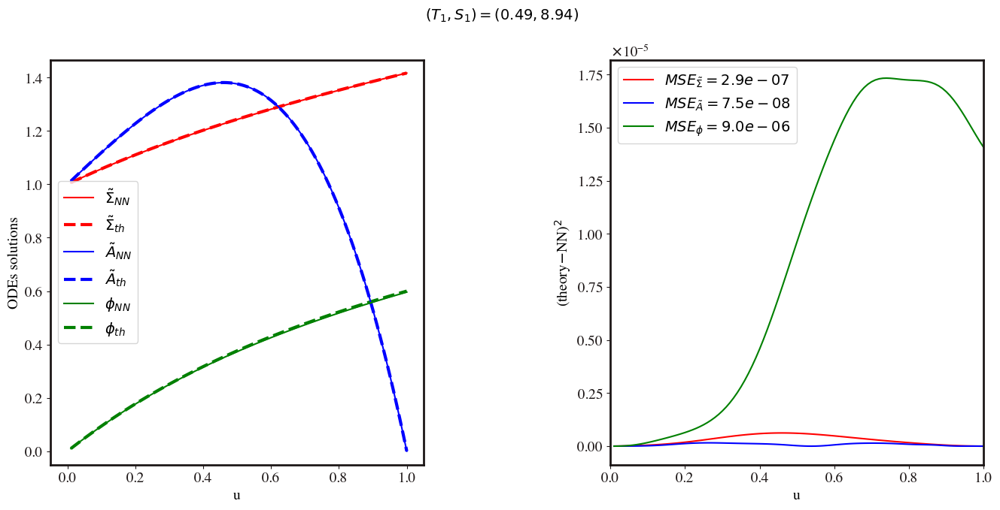

Point 2 ; phi_h_yago = 1.411452


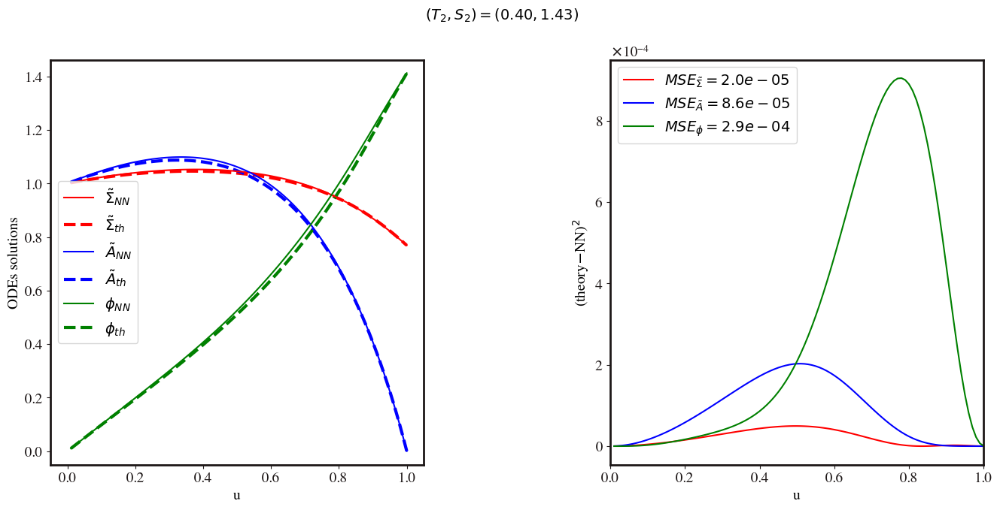

Point 3 ; phi_h_yago = 1.528000


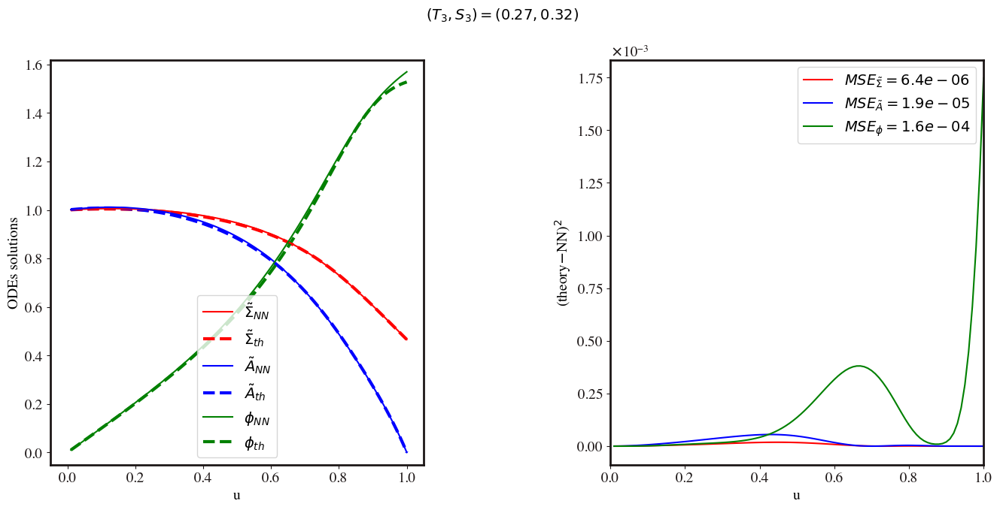

In [44]:
d.compare_to_yago()

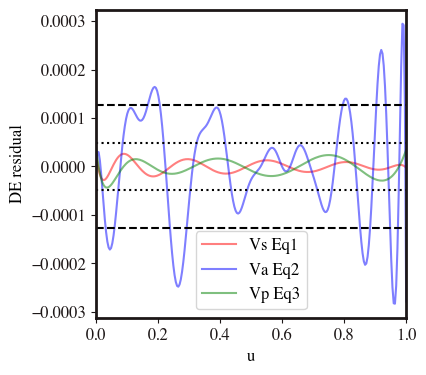

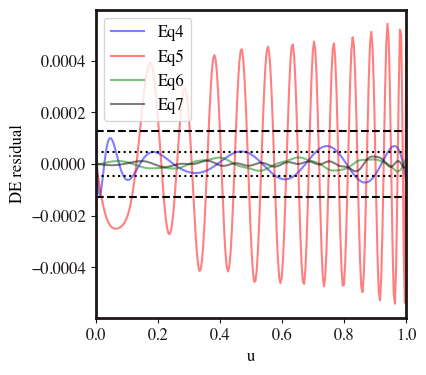

In [11]:
d.plot_residuals_in_u(max_bound=False)

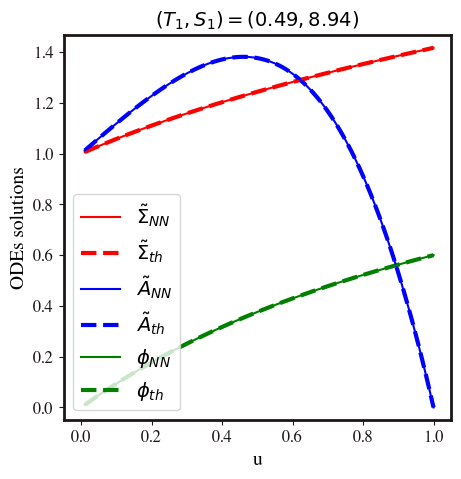

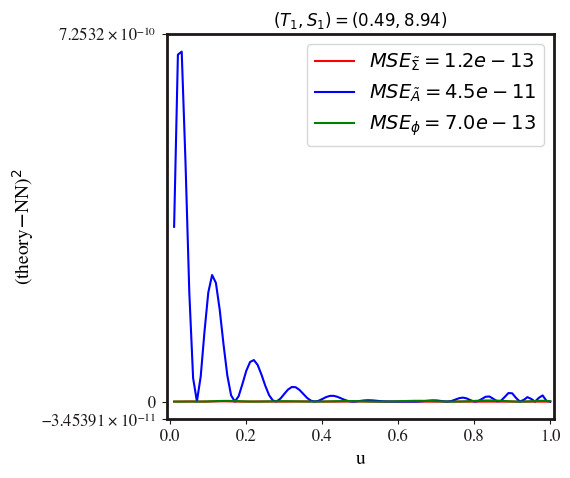

In [12]:
d.compare_to_yago()

## Extrating solution fields $\psi=\{\Sigma, A,\phi\}$, 1st and 2nd derivatives, for high number of points in $u$ for analysis of the precision of solutions

Point 1 ; phi_h_yago = 0.600000


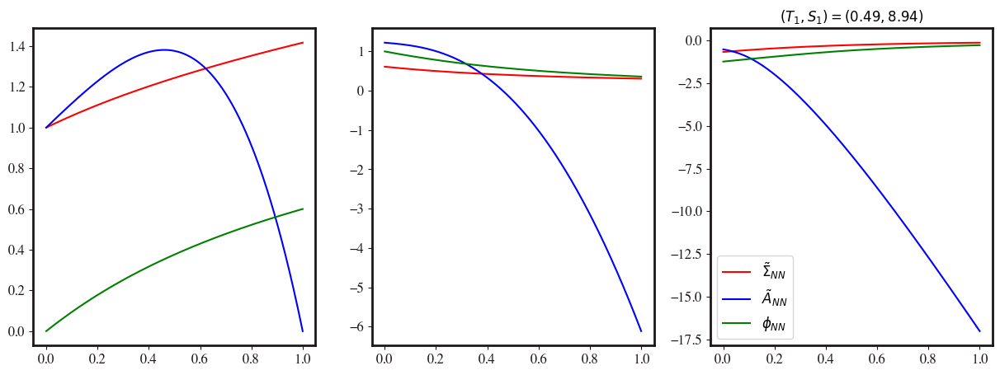

Point 2 ; phi_h_yago = 1.411452


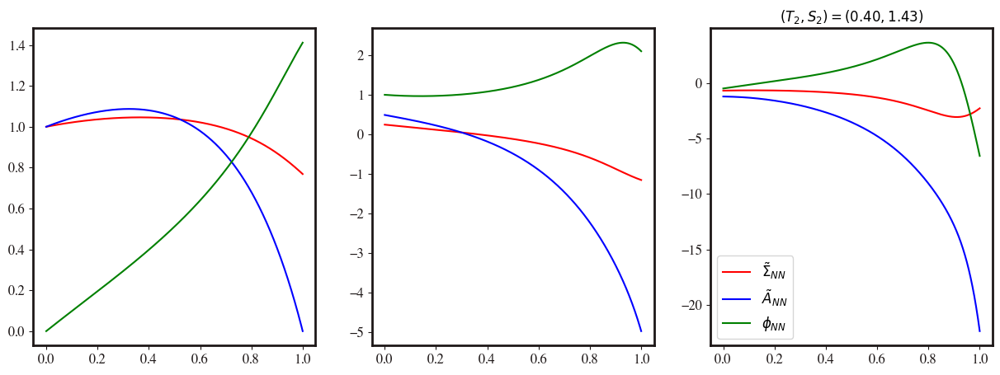

Point 3 ; phi_h_yago = 1.528000


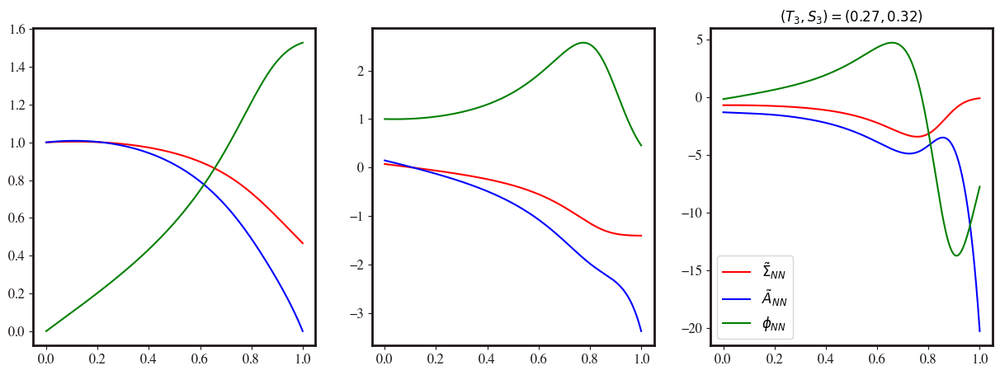

In [73]:
S_yago = [8.939014410418975, 1.42689,  0.31734643273483476] 
T_yago = [0.4867126785278015, 0.395869, 0.26805164866639136] 
phi_uh_yago= [0.6, 1.4114516577290581, 1.528]

u=np.linspace(0,1,5000)
u_t = torch.linspace(0,1,5000,requires_grad=True)

for i in range(3):
    save_path = f'/Users/pablo/Desktop/NNholo/To run/January (2024)/Moving forward/Abemus saving for real/Forcing to Yago - phiM = 1/solution fields/point {i+1}'


    fig, ax = plt.subplots(1,3,figsize=(15,5))
        
    S_tt=S_yago[i]
    T_tt=T_yago[i]
    
    Sigma_h = (S_tt*np.ones_like(u)/np.pi)**(1/3)
    Va_h = (-T_tt*np.ones_like(u)*4*np.pi)
    
    #Sigma_h = .78*np.ones_like(u)
    #Va_h = -10.0*np.ones_like(u)
    
    solution = d.solver.get_solution(best=True)
    
    Vs, Va, Vp, Sigma, A, phi = solution(u, Sigma_h,  Va_h, to_numpy=True)

    Vs_t, Va_t, Vp_t, Sigma_t, A_t, phi_t = solution(u_t, Sigma_h,  Va_h, to_numpy=False)
    
    DDS = diff(Vs_t, u_t, order=1, shape_check = False)
    DDA = diff(Va_t, u_t, order=1, shape_check = False)
    DDp = diff(Vp_t, u_t, order=1, shape_check = False)

    DS = diff(Sigma_t, u_t, order=1, shape_check = False)
    DA = diff(A_t, u_t, order=1, shape_check = False)
    Dp = diff(phi_t, u_t, order=1, shape_check = False)

    DDS_2 = diff(Sigma_t, u_t, order=2, shape_check = False)
    DDA_2 = diff(A_t, u_t, order=2, shape_check = False)
    DDp_2 = diff(phi_t, u_t, order=2, shape_check = False)
    
    
    print('Point %i' %int(i+1), '; phi_h_yago = %f' %phi_uh_yago[i])
    
    ax[0].plot(u, Sigma, 'r-', label=r'$\tilde{\Sigma}_{NN}$', zorder=2)    
    ax[0].plot(u, A, 'b-', label=r'$\tilde{A}_{NN}$', zorder=2)    
    ax[0].plot(u, phi, 'g-', label=r'$\phi_{NN}$', zorder=2)

    ax[1].plot(u, Vs, 'r-', label=r'$\tilde{\Sigma}_{NN}$', zorder=2)    
    ax[1].plot(u, Va, 'b-', label=r'$\tilde{A}_{NN}$', zorder=2)    
    ax[1].plot(u, Vp, 'g-', label=r'$\phi_{NN}$', zorder=2)

    ax[2].plot(u, DDS.detach().numpy(), 'r-', label=r'$\tilde{\Sigma}_{NN}$', zorder=2)    
    ax[2].plot(u, DDA.detach().numpy(), 'b-', label=r'$\tilde{A}_{NN}$', zorder=2)    
    ax[2].plot(u, DDp.detach().numpy(), 'g-', label=r'$\phi_{NN}$', zorder=2)


    np.savetxt(f'{save_path}/Sigma', Sigma)
    np.savetxt(f'{save_path}/A', A)
    np.savetxt(f'{save_path}/phi', phi)

    np.savetxt(f'{save_path}/DS', Vs)
    np.savetxt(f'{save_path}/DA', Va)
    np.savetxt(f'{save_path}/Dp', Vp)

    np.savetxt(f'{save_path}/DDS', DDS.detach().numpy())
    np.savetxt(f'{save_path}/DDA', DDA.detach().numpy())
    np.savetxt(f'{save_path}/DDp', DDp.detach().numpy())
    
    #ax[0].ticklabel_format(axis='y', style='sci', scilimits=(1,1))

    #plt.xlim(-0.05,1.05)
    #plt.ylim(-0.05,max(max(Sigma),max(A),max(phi))+0.05)
    
    #ax[0].set_title(title,fontsize = fontsize)
    plt.legend()
    #plt.grid()
    #plt.savefig('solution3.png')
    
    title = r"$(T_{:.0f}, S_{:.0f})=({:.2f}, {:.2f})$".format(i+1,i+1,T_tt, S_tt)
    plt.title(title)

    plt.show()
    
    #fig.savefig(f'/Users/pablo/Desktop/NNholo/To run/January (2024)/Plots paper/DE solution_pt_{i+1}_(phiM=1,best).pdf')

In [36]:
d.update_optimizer()

Actual learning rate:  2.3686025857016165e-06


In [38]:
#d.save_results_new(f'{path_results}/NN_saved_phiM1_forcing_to_yagos_sol')

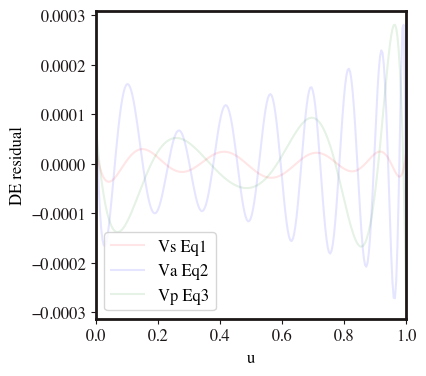

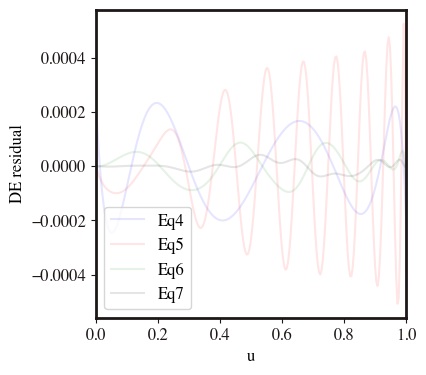

In [39]:
d.plot_residuals_in_u(max_bound=False, save_plot=True)

# Load old pretrained (by me) model ($\phi_M=4$) (works)

In [5]:
# Directory 
directory = "phiM = 4"
# Parent Directory path 
parent_dir = "/Users/pablo/Desktop/NNholo/To run/January (2024)/Moving forward/Abemus saving for real/"
# Path 
path_results_2 = os.path.join(parent_dir, directory) 

In [6]:
e = NNholo(data_path = "/Users/pablo/Desktop/NNholo/To run/January (2024)/Moving forward/Abemus saving for real/Data/Potentials_phim/SofTphiM4_0.txt", \
           saving_path = path_results_2)

File is .txt


Loss coeff:  0


In [7]:
e.load_results(f'{path_results_2}/trained_NN_7 (phim=4)_1e6')

Loss coeff:  0


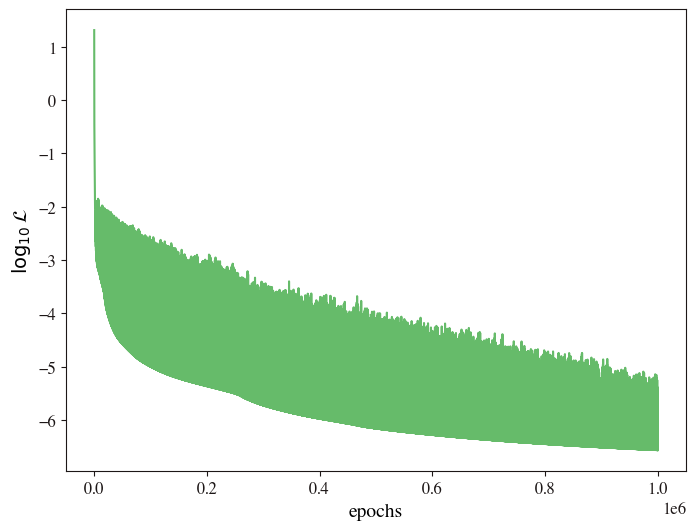

Min loss:  2.720886416315576e-07
max phi_h=  1.2226941866924046


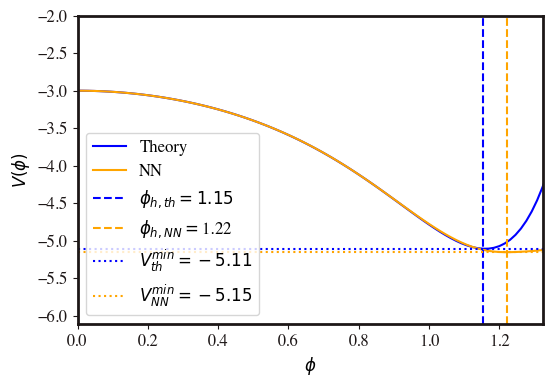

In [8]:
e.plot_loss()
e.plot_potential(phim=4)

In [9]:
# SAVE #
e.load_results(f'{path_results}/trained_NN_addloss')

Model succesfully saved


## Save with new method

In [9]:
e.save_results_new(f'{path_results_2}/NN_phiM4_NO_addloss_new_save')

Model succesfully saved


## Load newly saved net (or saved with new method)

In [10]:
f = NNholo(data_path = "/Users/pablo/Desktop/NNholo/To run/January (2024)/Moving forward/Abemus saving for real/Data/Potentials_phim/SofTphiM4_0.txt", \
           saving_path = path_results_2)


File is .txt


Loss coeff:  0


In [11]:
f.load_results_new(f'{path_results_2}/NN_phiM4_NO_addloss_new_save_epochs_0')

Loss coeff:  0


Actual learning rate:  0.001
None
Model succesfully loaded


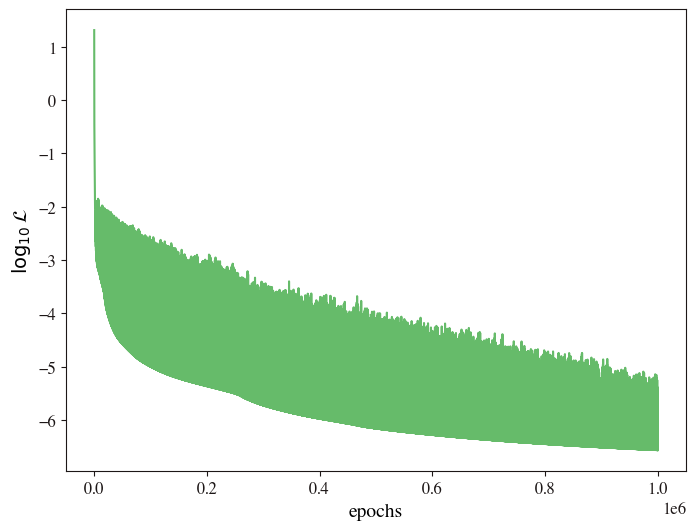

Min loss:  2.720886416315576e-07
max phi_h=  1.2226941866924046


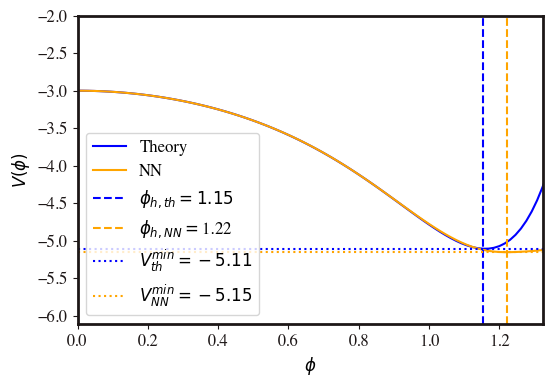

In [12]:
f.plot_loss()
f.plot_potential(phim=4)
#e.sofT_curve()

## Keep on training newly loaded net

In [13]:
store_mse = Store_MSE_Loss()

scheduler = torch.optim.lr_scheduler.StepLR(f.adam, step_size=100, gamma=0.985)
scheduler_cb = DoSchedulerStep(scheduler=scheduler)

potential_cb = BestValidationCallback()

In [14]:
f.update_optimizer(5e-5)

Learning rate updated to:  5e-05


In [15]:
epochs = 1000

f.solver.fit(max_epochs=epochs, 
             callbacks=[potential_cb, scheduler_cb], 
             tqdm_file=tqdm(total=epochs, dynamic_ncols=True, desc='Epochs', unit='iteration', colour='#0afa9e'))

Epochs:   0%|          | 0/1000 [00:00<?, ?iteration/s]

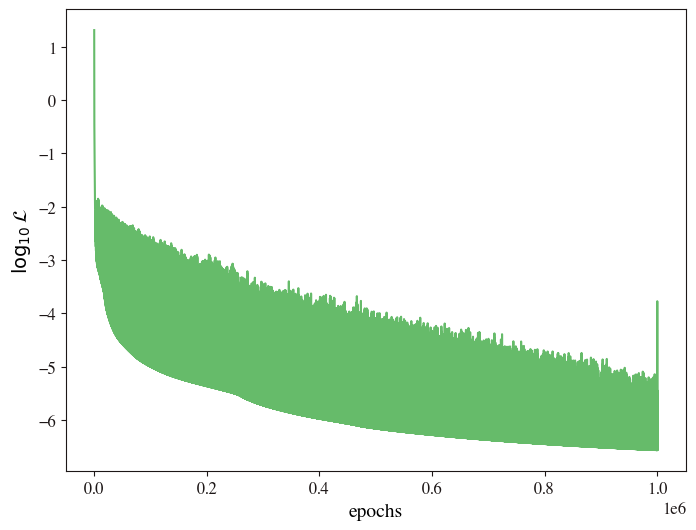

Min loss:  2.720886416315576e-07
max phi_h=  1.2227253944936058


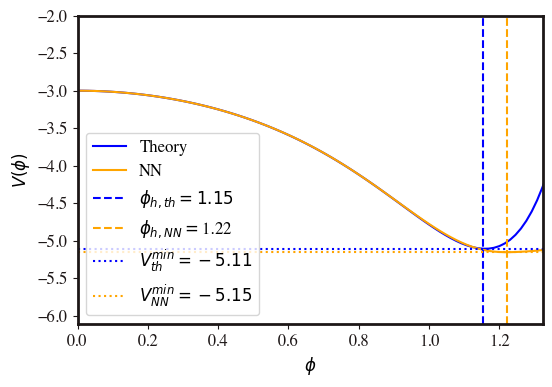

In [16]:
f.plot_loss()
f.plot_potential(phim=4)

In [17]:
f.save_results_new(f'{path_results_2}/NN_phiM4_NO_addloss_new_save')

Model succesfully saved
